In [1]:
import warnings
# Suppress all DeprecationWarnings
warnings.filterwarnings("ignore", category=DeprecationWarning)

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.integrate import solve_ivp
import sympy as sp # 'sympy' library for symbolic calculations

# # Setting the fontsize of x, y label and title of python plots globally
# import matplotlib as mpl
# # Set global font sizes
# mpl.rcParams['axes.titlesize'] = 12      # Title font size
# mpl.rcParams['axes.labelsize'] = 12      # X and Y label font size
# mpl.rcParams['xtick.labelsize'] = 10     # X tick label font size
# mpl.rcParams['ytick.labelsize'] = 10     # Y tick label font size
# mpl.rcParams['legend.fontsize'] = 8     # Legend font size
# mpl.rcParams['font.size'] = 12           # General font size (e.g. for text)
# mpl.rcParams['figure.dpi'] = 300         # higher dpi = more resolution

# # For Interactive window (zoom-in, zoom-out feature)
# # %matplotlib widget

# # Uncomment the below one high quality plots
# # plots and code are in same window
# %matplotlib inline  
# # for clear image, can be set to 'pdf/png' format also
# %config InlineBackend.figure_format = 'retina'  

In [3]:
import matplotlib as mpl
mpl.rcParams.update({
    # Figure
    "figure.figsize": (6.5, 4.5),   # single-column paper
    "figure.dpi": 300,
    "savefig.dpi": 300,

    # Fonts
    "font.size": 12,          # base font
    "axes.labelsize": 13,
    "axes.titlesize": 13,
    "xtick.labelsize": 11,
    "ytick.labelsize": 11,

    # Legend
    "legend.fontsize": 10,
    "legend.frameon": True,
    "legend.framealpha": 0.9,
    "legend.borderpad": 0.3,
    "legend.labelspacing": 0.3,
    "legend.handlelength": 1.2,
    "legend.handletextpad": 0.4,

    # Lines and markers
    "lines.linewidth": 2.0,
    "lines.markersize": 6,

    # Axes
    "axes.linewidth": 1.2,
    "xtick.major.width": 1.1,
    "ytick.major.width": 1.1,
    "xtick.minor.width": 0.8,
    "ytick.minor.width": 0.8,

    # Grid (if used)
    "grid.linewidth": 0.6,
    "grid.alpha": 0.4,
})

#### Universal constants in SI units ( Global variable )

In [4]:
G = 6.67 * (1e-11)
pc = 3*(1e16)
c = 3*(1e8)

# Mass of Sun in Kg
M_sun = 1e30

#### Binary Masses

In [5]:
# BINARY MASSES

# Primary Mass (bigger BH)
mass_1 = (1e3)*M_sun
# Secondary Mass (smaller BH)
mass_2 = 10*M_sun
# Total mass
total_mass = mass_1 + mass_2

eta = mass_1*mass_2/(total_mass**2)

# ISCO distance
r_min = (6*G*mass_1)/(c**2)

# Conversion factors ( Geometrized units G = c = 1 )
t_factor = r_min/c        # from ISCO distance to seconds
l0 = r_min          # from ISCO distance to meters
m0 = (c**2)*r_min/G # from ISCO distance to kg

# Binary masses in ISCO distance (bcz we write DE in geometrized units ,i.e, G = c = 1)
m1 = mass_1 / m0
m2 = mass_2 / m0
M = total_mass / m0

#### Initial orbital parameters

In [6]:
# Initial eccentricity
e_i = 0.1 
# Initial value of semi-latus rectum in ISCO distance units
p_i = 50
# Initial value of omega in radians
omega_i = 0.0  
# Staring time
t_i = 0.0

# Final value of 'f' 
f_final = 1e15*(np.pi)

# Distance between binaries and observation point
R = 10 * 1e6 * pc / l0  # in ISCO units

## Elliptical binaries in Vacuum

#### Averaged Osculating equations for GW backreaction 

$ \big< \frac{de}{df} \big>_{GW} = -\frac{8}{5} \eta \frac{M^{5/2}}{ p^{5/2}} \big( \frac{304}{24}e+\frac{121}{24} e^3 \big) $

$ \big< \frac{dp}{df} \big>_{GW} = -\frac{8}{5} \eta \frac{M^{5/2}}{ p^{3/2}} (8+7 e^2)  $

$ \big< \frac{d\omega}{df} \big>_{GW} = 0 $

$ \big< \frac{dt}{df} \big>_{GW} = \sqrt{\frac{p^3}{M}} (1- e^2)^{-3/2} $ 

Everything is in Geometrized units i.e, $ \boxed{ G = c = 1 }$

In [7]:
# Averaged osculating equations considering only GW backreaction
def osculating_eqn_gw_brxn(f,y,combination,alpha):
    e, p, omega, t = y
    # If DM gravity effect is considered then total mass should be M_eff else its just M=(m1+m2)
    if combination==2 or combination==3:
        dedf = -(8/5)*eta*(((M_eff(alpha))**(5/2))/((p**(5/2))))*( (304/24)*e + (121/24)*(e**3) )
        dpdf = -(8/5)*eta*(((M_eff(alpha))**(5/2))/((p**(3/2))))*( 8 + 7*(e**2) )
        domegadf = 0.0
        dtdf = np.sqrt((p**3)/(M_eff(alpha))) * ((1- e**2)**(-3/2))
    else:    
        dedf = -(8/5)*eta*(((M)**(5/2))/((p**(5/2))))*( (304/24)*e + (121/24)*(e**3) )
        dpdf = -(8/5)*eta*((M)**(5/2))/(((p**(3/2))))*( 8 + 7*(e**2) )
        domegadf = 0.0
        dtdf = np.sqrt((p**3)/(M)) * ((1- e**2)**(-3/2))
    return [dedf, dpdf, domegadf, dtdf]

class orbit_evolution_without_DM:
    # Initial parameters
    def __init__(self, e_i, p_i, omega_i, t_i, f_final):
        self.e_i = e_i
        self.p_i = p_i
        self.omega_i = omega_i
        self.t_i = t_i
        self.f_final = f_final
    
    # Orbit evolution considering only GW backreaction
    def orbit_evolution_gw_brxn(self):
        # Define the event function
        def stopping_condition(f, y):
            e, p, omega, t = y
            # Final value of semi-latus rectum ( at LSO )
            p_end = ( 6 + 2*self.e_i )*r_min/l0
            return p - p_end  # Integration stops when 'p' reaches Last Stable orbit

        # Make the event terminal and specify the direction
        stopping_condition.terminal = True    # ensures that the solver stops integration when the event is detected.
        stopping_condition.direction = 0      # allows the detection of zero crossings in any direction (i.e., both increasing and decreasing)

        # Coupled osculating equations
        def coupled_osculating_eqns(f,y):
            return osculating_eqn_gw_brxn(f,y,combination=0,alpha=0)

        # Initial conditions
        initial_conditions = [self.e_i, self.p_i, self.omega_i, self.t_i]

        f_span = (0,self.f_final)   # True anomaly 'f'

        # Solve the system using solve_ivp
        solution = solve_ivp(coupled_osculating_eqns, f_span, initial_conditions, events=stopping_condition, method='RK45',
                             atol=1e-12, rtol=1e-8, max_step=100*(np.pi) + 1e-2) 

        # print(solution.success)
        # print(solution.status)
        print(solution.message)
        
        return solution.t, solution.y

In [8]:
sol_GW = orbit_evolution_without_DM(e_i, p_i, omega_i, t_i, f_final)

f_GW, y_GW = sol_GW.orbit_evolution_gw_brxn() 

A termination event occurred.


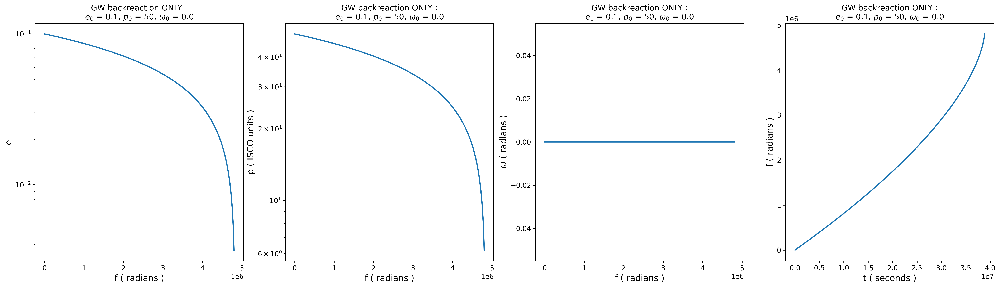

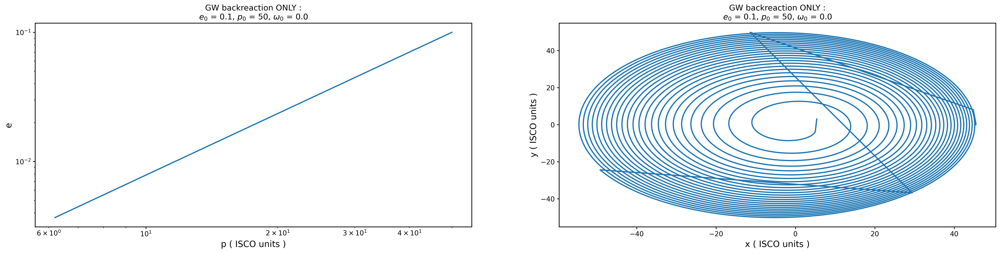

In [9]:
# FOR GW BACKREACTION ONLY
plt.figure(figsize=(28,7))

plt.subplot(141)
plt.plot( f_GW, y_GW[0])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.yscale('log')
plt.title('GW backreaction ONLY :'+'\n'+rf'$e_0$ = {e_i}, $p_0$ = {p_i}, $\omega_0$ = {omega_i}')

plt.subplot(142)
plt.plot( f_GW, y_GW[1])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('p ( ISCO units )', fontsize =14)
plt.yscale('log')
plt.title('GW backreaction ONLY :'+'\n'+rf'$e_0$ = {e_i}, $p_0$ = {p_i}, $\omega_0$ = {omega_i}')

plt.subplot(143)
plt.plot( f_GW, y_GW[2])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel(r'$\omega$ ( radians )', fontsize =14)
plt.title('GW backreaction ONLY :'+'\n'+rf'$e_0$ = {e_i}, $p_0$ = {p_i}, $\omega_0$ = {omega_i}')

plt.subplot(144)
plt.plot( y_GW[3]*t_factor, f_GW)
plt.ylabel('f ( radians )', fontsize =14)
plt.xlabel('t ( seconds )', fontsize =14)
plt.title('GW backreaction ONLY :'+'\n'+rf'$e_0$ = {e_i}, $p_0$ = {p_i}, $\omega_0$ = {omega_i}')

plt.show()

#-----------'e' Vs 'p'
plt.figure(figsize=(28,6))

plt.subplot(121)
plt.plot( y_GW[1], y_GW[0])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('p ( ISCO units )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.title('GW backreaction ONLY :'+'\n'+rf'$e_0$ = {e_i}, $p_0$ = {p_i}, $\omega_0$ = {omega_i}')

plt.subplot(122)
# Relative distance between binaries
def rel_distance(y, f):
    e, p, omega, t = y
    return p/( 1 + e*np.cos(f) )
r_GW = rel_distance(y_GW, f_GW)
plt.plot( r_GW*np.cos(f_GW), r_GW*np.sin(f_GW))
plt.xlabel('x ( ISCO units )', fontsize =14)
plt.ylabel('y ( ISCO units )', fontsize =14)
plt.title('GW backreaction ONLY :'+'\n'+rf'$e_0$ = {e_i}, $p_0$ = {p_i}, $\omega_0$ = {omega_i}')

plt.show()

## Elliptical binaries in Static DM environment

#### Dark Matter density parameters

<center>    
$ \rho_{DM} (r) = 
\begin{cases} 
\rho_{sp} \big( \frac{r_{sp}}{r} \big)^{\alpha} &  r_{min} \leq r \leq r_{sp} \\
0 &  r < r_{min} \\
\end{cases} $
</center>    

where, for given primary IMBH of mass $10^3 M_{\odot}$, $r_{sp}=0.54pc$, $\rho_{sp} = 226 M_{\odot} / pc^3$ and $r_{min} = r_{ISCO} = 3R_s = 6 m_1 $

In [10]:
# DARK-MATTER MINISPIKE Profile parameters

alpha = 2.35 # DM exponent
rho_sp = (226*M_sun/((pc)**3))*(l0**3 / m0)  # in ISCO units
r_sp = 0.54 * (pc) / l0   # in ISCO units

# FF is needed for DM minispike gravity force ( put FF = 0 to check the Favata result )
def FF(alpha):
    return 4*(np.pi)*(rho_sp)*((r_sp)**alpha )/(3-alpha) 

# Effective mass M_eff needed for DM effect contribution ( DM gravity, DF, Accretion ). 
# For GW backreaction only, we consider total mass M instead
def M_eff(alpha):
    rmin = r_min/l0 # it is basically equal to 1, since everything is in ISCO units
    return (m1 + m2) - (( 4*(np.pi)*(rho_sp)*((r_sp)**alpha)*((rmin)**(3-alpha)) )/(3-alpha))

I_v = 3    # Dynamical friction factor
lamda = 1  # Accretion factor

#### Averaged Osculating equations for (Relativistic DF) as perturbation 

$ \big< \frac{de}{df} \big>_{DF} = - \frac{4 m_2 \rho_{sp} (r_{sp})^{\alpha} I_v }{M^2} p^{-\alpha} \mathcal{f1} (e, p) $

$ \big< \frac{dp}{df} \big>_{DF} = - \frac{4 m_2 \rho_{sp} (r_{sp})^{\alpha} I_v }{M^2} p^{1-\alpha} \mathcal{g1} (e, p) $

where,

$ \mathcal{f1} (e, p) = \int_{0}^{2\pi} \frac{ [p-M(1+e^2-2e\cos{f})] [p+M(1+e^2+2e\cos{f})]^2 (\cos{f} +e)}{(1+2e \cos{f} +e^2)^{3/2}(1+e\cos{f})^{2-\alpha}} df $

$ \mathcal{g1} (e, p) = \int_{0}^{2\pi} \frac{[p-M(1+e^2-2e\cos{f})] [p+M(1+e^2+2e\cos{f})]^2}{(1+2e \cos{f} +e^2)^{3/2}(1+e\cos{f})^{2-\alpha}} df $

$$ $$

$ \big< \frac{d\omega}{df} \big>_{DF} = 0 $

$ \big< \frac{dt}{df} \big>_{DF} = \sqrt{\frac{p^3}{M}} (1-e^2)^{-3/2} $ 


#### Averaged Osculating equations for (Accretion) as perturbation 

$ \big< \frac{de}{df} \big>_{acc} = - \frac{4 m_2 \rho_{sp} (r_{sp})^{\alpha} \lambda }{M^2} p^{3-\alpha} \mathcal{f2} (e) $

$ \big< \frac{dp}{df} \big>_{acc} = - \frac{4 m_2 \rho_{sp} (r_{sp})^{\alpha} \lambda }{M^2} p^{4-\alpha} \mathcal{g2} (e) $

where,

$ \mathcal{f2} (e) = \int_{0}^{2\pi} \frac{(\cos{f} +e)}{(1+2e \cos{f} +e^2)^{3/2}(1+e\cos{f})^{2-\alpha}} df $

$ \mathcal{g2} (e) = \int_{0}^{2\pi} \frac{1}{(1+2e \cos{f} +e^2)^{3/2}(1+e\cos{f})^{2-\alpha}} df $

$$ $$

$ \big< \frac{d\omega}{df} \big>_{acc} = 0 $

$ \big< \frac{dt}{df} \big>_{acc} = \sqrt{\frac{p^3}{M}} (1-e^2)^{-3/2} $ 


#### Averaged Osculating equations for DM Minispike gravity as perturbation 

$ \big< \frac{de}{df} \big>_{DM} = - \frac{p^{3-\alpha} F}{M_{eff}} \int_{0}^{2\pi} \frac{1}{2\pi} \frac{\sin{f}}{(1+e \cos{f})^{3-\alpha}} df $

$ \big< \frac{dp}{df} \big>_{DM} = 0 $

$ \big< \frac{d\omega}{df} \big>_{DM} = \frac{p^{3-\alpha} F}{M_{eff}} \int_{0}^{2\pi} \frac{1}{2\pi} \frac{\cos{f}}{e(1+e \cos{f})^{3-\alpha}} df $

$ \big< \frac{dt}{df} \big>_{DM} = \sqrt{\frac{p^3}{M_{eff}}} \int_{0}^{2\pi} \frac{1}{2\pi} \frac{1}{(1+e \cos{f})^2} \big[ 1 + \frac{p^{3-\alpha} F \cos{f}}{M_{eff} e (1+ e \cos{f})^{3-\alpha}} \big] df $ 

Let

$ func1 =  \frac{1}{2\pi} \frac{\sin{f}}{(1+e \cos{f})^{3-\alpha}}  $

$ func2 =  \frac{1}{2\pi} \frac{\cos{f}}{e(1+e \cos{f})^{3-\alpha}} $

$ func3 =  \frac{1}{2\pi} \frac{1}{(1+e \cos{f})^2} \big[ 1 + \frac{p^{3-\alpha} F \cos{f}}{M_{eff} e (1+ e \cos{f})^{3-\alpha}} \big]  $

Everything is in Geometrized units i.e, $ \boxed{ G = c = 1 }$

In [11]:
from scipy.integrate import simpson

# Averaged osculating equations considering only ( Relativistic DF )
def osculating_eqn_DF(f, y, alpha, combination):
    e, p, omega, t = y
    
    x = np.linspace(0, 2*np.pi, 1000)
        
    # If DM gravity effect is also considered then total mass should be M_eff else its just M=(m1+m2)
    if combination==3:
        f1x = ( (p-M_eff(alpha) *(1+e**2-2*e*np.cos(x)) )*(p+M_eff(alpha)*(1+e**2+2*e*np.cos(x)) )**2 * (np.cos(x) + e)/
                ((1 + 2*e* np.cos(x) + e**2 )**(3/2) * (1 + e* np.cos(x))**(2-alpha) ))
        f1_e = simpson(f1x, x)
        
        g1x = ( (p-M_eff(alpha) *(1+e**2-2*e*np.cos(x)) )*(p+M_eff(alpha)*(1+e**2+2*e*np.cos(x)) )**2 /
                ( ((1 + 2*e* np.cos(x) + e**2 )**(3/2)) * ((1 + e* np.cos(x))**(2-alpha)) ) )
        g1_e = simpson(g1x, x)

        dedf = -( ( 4*m2*rho_sp*(r_sp**alpha)* I_v )*(p**(-alpha))/(M_eff(alpha)**2) )*f1_e
        dpdf = -( ( 4*m2*rho_sp*(r_sp**alpha)* I_v )*(p**(1-alpha))/(M_eff(alpha)**2) )*g1_e
        domegadf = 0.0
        dtdf = ( np.sqrt( (p**3)/(M_eff(alpha)) ) )*( (1 - e**2)**(-3/2) )
    else: 
        f1x = ( (p-M*(1+e**2-2*e*np.cos(x)) )*(p+M*(1+e**2+2*e*np.cos(x)) )**2 * (np.cos(x) + e)/
                ((1 + 2*e* np.cos(x) + e**2 )**(3/2) * (1 + e* np.cos(x))**(2-alpha) ))
        f1_e = simpson(f1x, x)
        
        g1x = ( (p-M*(1+e**2-2*e*np.cos(x)) )*(p+M*(1+e**2+2*e*np.cos(x)) )**2 /
                ( ((1 + 2*e* np.cos(x) + e**2 )**(3/2)) * ((1 + e* np.cos(x))**(2-alpha)) ) )
        g1_e = simpson(g1x, x)

        dedf = -( ( 4*m2*rho_sp*(r_sp**alpha)* I_v )*(p**(-alpha))/(M**2) )*f1_e
        dpdf = -( ( 4*m2*rho_sp*(r_sp**alpha)* I_v )*(p**(1-alpha))/(M**2) )*g1_e
        domegadf = 0.0
        dtdf = ( np.sqrt( (p**3)/(M) ) )*( (1 - e**2)**(-3/2) ) 
    return [dedf, dpdf, domegadf, dtdf]

# Averaged osculating equations considering only ( Accretion )
def osculating_eqn_accretion(f, y, alpha, combination):
    e, p, omega, t = y
    
    x = np.linspace(0, 2*np.pi, 1000)
    f2x = (np.cos(x) + e)/((1 + 2*e* np.cos(x) + e**2 )**(3/2) * (1 + e* np.cos(x))**(2-alpha) )
    f2_e = simpson(f2x, x)
    
    g2x = 1/( ((1 + 2*e* np.cos(x) + e**2 )**(3/2)) * ((1 + e* np.cos(x))**(2-alpha)) )
    g2_e = simpson(g2x, x)
    
    # If DM gravity effect is also considered then total mass should be M_eff else its just M=(m1+m2)
    if combination==3:
        dedf = -( ( 4*m2*rho_sp*(r_sp**alpha)* lamda )*(p**(3-alpha))/(M_eff(alpha)**2) )*f2_e
        dpdf = -( ( 4*m2*rho_sp*(r_sp**alpha)* lamda )*(p**(4-alpha))/(M_eff(alpha)**2) )*g2_e
        domegadf = 0.0
        dtdf = ( np.sqrt( (p**3)/(M_eff(alpha)) ) )*( (1 - e**2)**(-3/2) )
    else:    
        dedf = -( ( 4*m2*rho_sp*(r_sp**alpha)* lamda )*(p**(3-alpha))/(M**2) )*f2_e
        dpdf = -( ( 4*m2*rho_sp*(r_sp**alpha)* lamda )*(p**(4-alpha))/(M**2) )*g2_e
        domegadf = 0.0
        dtdf = ( np.sqrt( (p**3)/(M) ) )*( (1 - e**2)**(-3/2) ) 
    return [dedf, dpdf, domegadf, dtdf]


# Averaged osculating equations considering only DM gravity
def osculating_eqn_DM_gravity(f, y, alpha):
    e, p, omega, t = y
    
    x = np.linspace(0, 2*np.pi, 1000)
    f1x = (1/(2*np.pi))*(np.sin(x))/( ( 1 + e*np.cos(x) )**(3-alpha) )
    f1_e = simpson(f1x, x)
    
    f2x = (1/(2*np.pi))*(np.cos(x))/( e*( 1 + e*np.cos(x) )**(3-alpha) )
    f2_e = simpson(f2x, x)
    
    f3x = (1/(2*np.pi))*(1/( 1 + e*np.cos(x) )**2 )*( 1 + 
                                                      ( p**(3-alpha))*FF(alpha)*np.cos(x) / 
                                                      ( M_eff(alpha)*e*((1+e*np.cos(x))**(3-alpha)) )  )
    f3_e = simpson(f3x, x)
    
    dedf = -( ((p**(3-alpha))*FF(alpha)) / M_eff(alpha) )*f1_e
    dpdf = 0.0
    domegadf = ( ((p**(3-alpha))*FF(alpha)) / M_eff(alpha) )*f2_e
    dtdf = ( np.sqrt((p**3)/(M_eff(alpha))) )*f3_e
    return [dedf, dpdf, domegadf, dtdf]

class orbit_evolution_with_DM(orbit_evolution_without_DM):
    # Initial parameters
    def __init__(self, e_i, p_i, omega_i, t_i, f_final, alpha):
        super().__init__(e_i, p_i, omega_i, t_i, f_final)
        self.alpha = alpha
        
    # Orbit evolution
    def orbit_evolution_DM_effect_gw_brxn(self, combination):
        # Define the event function
        def stopping_condition(f, y):
            e, p, omega, t = y
            # Final value of semi-latus rectum ( at LSO )
            p_end = ( 6 + 2*self.e_i )*r_min/l0
            return p - p_end  # Integration stops when 'p' reaches Last Stable orbit

        # Make the event terminal and specify the direction
        stopping_condition.terminal = True    # ensures that the solver stops integration when the event is detected.
        stopping_condition.direction = 0      # allows the detection of zero crossings in any direction (i.e., both increasing and decreasing)
        
        # Initial conditions
        initial_conditions = [self.e_i, self.p_i, self.omega_i, self.t_i]

        f_span = (0,self.f_final)   # True anomaly 'f'
        
        # Coupled osculating equations for NET effect ( Relativistic DF + Accretion + DM gravity + GW brxn )
        def coupled_osculating_eqns(f, y):
            return np.add.reduce([osculating_eqn_gw_brxn(f, y, combination, self.alpha), 
                                  osculating_eqn_DF(f, y, self.alpha, combination), 
                                  osculating_eqn_accretion(f, y, self.alpha, combination),
                                  osculating_eqn_DM_gravity(f, y, self.alpha)])

        # Solve the system using solve_ivp
        solution = solve_ivp(coupled_osculating_eqns, f_span, initial_conditions, events=stopping_condition, method='RK45', 
                             atol=1e-12, rtol=1e-8, max_step=100*(np.pi) + 1e-2) 

        # print(solution.success)
        # print(solution.status)
        print(solution.message)
        
        return solution.t, solution.y

In [12]:
sol = orbit_evolution_with_DM(e_i, p_i, omega_i, t_i, f_final, alpha)

# For NET effect set combination = 3
f_NET, y_NET = sol.orbit_evolution_DM_effect_gw_brxn(3)

A termination event occurred.


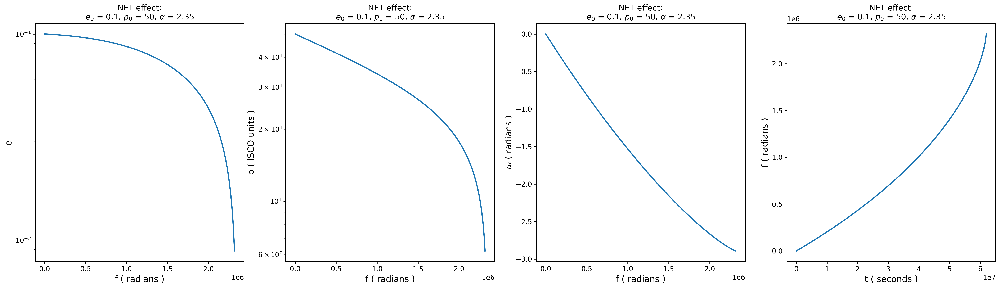

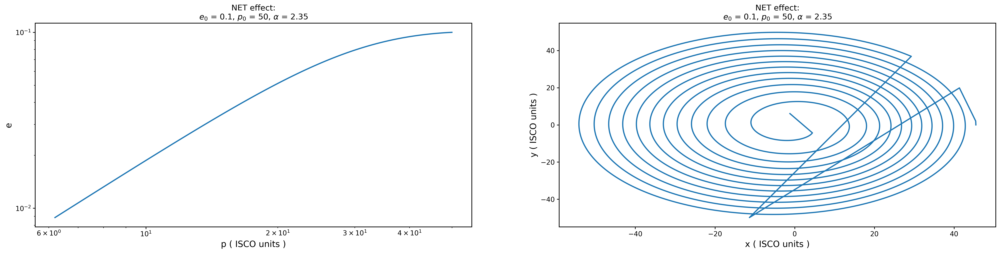

In [13]:
# NET : Relativistic DF + Accretion + DM minispike gravity + GW backrxn
plt.figure(figsize=(28,7))

plt.subplot(141)
plt.plot( f_NET, y_NET[0])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.yscale('log')
plt.title('NET effect:'+'\n'+rf'$e_0$ = {e_i}, $p_0$ = {p_i}, $\alpha$ = {alpha}')

plt.subplot(142)
plt.plot( f_NET, y_NET[1])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('p ( ISCO units )', fontsize =14)
plt.yscale('log')
plt.title('NET effect:'+'\n'+rf'$e_0$ = {e_i}, $p_0$ = {p_i}, $\alpha$ = {alpha}')

plt.subplot(143)
plt.plot( f_NET, y_NET[2])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel(r'$\omega$ ( radians )', fontsize =14)
plt.title('NET effect:'+'\n'+rf'$e_0$ = {e_i}, $p_0$ = {p_i}, $\alpha$ = {alpha}')

plt.subplot(144)
plt.plot( y_NET[3]*t_factor, f_NET)
plt.ylabel('f ( radians )', fontsize =14)
plt.xlabel('t ( seconds )', fontsize =14)
plt.title('NET effect:'+'\n'+rf'$e_0$ = {e_i}, $p_0$ = {p_i}, $\alpha$ = {alpha}')
plt.show()

#-----------'e' Vs 'p'
plt.figure(figsize=(28,6))

plt.subplot(121)
plt.plot( y_NET[1], y_NET[0])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('p ( ISCO units )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.title('NET effect:'+'\n'+rf'$e_0$ = {e_i}, $p_0$ = {p_i}, $\alpha$ = {alpha}')

plt.subplot(122)
r_NET = rel_distance(y_NET, f_NET)
plt.plot( r_NET*np.cos(f_NET), r_NET*np.sin(f_NET))
plt.xlabel('x ( ISCO units )', fontsize =14)
plt.ylabel('y ( ISCO units )', fontsize =14)
plt.title('NET effect:'+'\n'+rf'$e_0$ = {e_i}, $p_0$ = {p_i}, $\alpha$ = {alpha}')

plt.show()

#### Checking Inspiral time / No. of cycles for different configuration of initial orbital parameters

In [14]:
# Setting multiple initial orbital parameters configurations
e0_list = [0.1, 0.5, 0.9]
p0_list = [50, 70, 90, 100]
alpha_list = [2.25, 2.35, 2.5]

# Vacuum results
f_Vac = []
y_Vac = []
inspiral_time_Vac = np.zeros((len(e0_list), len(p0_list)))  # Array storing total inspiral time
num_cycles_Vac = np.zeros((len(e0_list), len(p0_list)))     # Array storing total number of cycles 
# DM results
f_DM = []
y_DM = []
inspiral_time_DM = np.zeros((len(e0_list), len(p0_list), len(alpha_list)))  # Array storing total inspiral time
num_cycles_DM = np.zeros((len(e0_list), len(p0_list), len(alpha_list)))                      # Array storing total number of cycles 

for i in range(len(e0_list)):
    for j in range(len(p0_list)):
        # Vacuum : Only GW backrxn
        sol_Vac = orbit_evolution_without_DM(e0_list[i], p0_list[j], omega_i, t_i, f_final)
        f_gw, y_gw = sol_Vac.orbit_evolution_gw_brxn() 
        f_Vac.append(f_gw)
        y_Vac.append(y_gw)
        inspiral_time_Vac[i,j] = round(y_gw[3,-1]*t_factor/(365*24*3600),1)      # Total inspiral time in years
        num_cycles_Vac[i,j] = round(f_gw[-1]/(2*np.pi),1)                        # Total number of cycles 
        for k in range(len(alpha_list)):
            # DM : NET Effect
            sol_DM = orbit_evolution_with_DM(e0_list[i], p0_list[j], omega_i, t_i, f_final, alpha_list[k])
            f_net, y_net = sol_DM.orbit_evolution_DM_effect_gw_brxn(3)
            f_DM.append(f_net)
            y_DM.append(y_net)
            inspiral_time_DM[i,j, k] = round(y_net[3,-1]*t_factor/(365*24*3600),1)  # Total inspiral time in years
            num_cycles_DM[i,j,k] = round(f_net[-1]/(2*np.pi),1)                     # Total number of cycles 

A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A terminat

In [15]:
# Plot results in tabular form using pandas library
import pandas as pd

# Vacuum case : Total Inspiral time
dataframe_Vac = pd.DataFrame(
    inspiral_time_Vac,
    index=e0_list,
    columns=p0_list
)
dataframe_Vac.index.name = "e₀ \\ p₀"
dataframe_Vac.columns.name = ""  # Remove column name for cleaner look

# Print the Vacuum results with borders
print("\nVacuum Case - Total Inspiral time (in years)")
print(dataframe_Vac.to_markdown(tablefmt="grid"))

# DM case : Total Inspiral time
dataframe_DM_tables = {}
for k, alphaa in enumerate(alpha_list):
    dataframe_DM = pd.DataFrame(
        inspiral_time_DM[:, :, k],
        index=e0_list,
        columns=p0_list
    )
    dataframe_DM.index.name = "e₀ \\ p₀"
    dataframe_DM.columns.name = ""  # Remove column name for cleaner look
    dataframe_DM_tables[alphaa] = dataframe_DM
    
    # Print the DM results with borders using Greek alpha symbol
    print(f"\nDM Case (α = {alphaa}) - Total Inspiral time (in years)")
    print(dataframe_DM.to_markdown(tablefmt="grid"))


Vacuum Case - Total Inspiral time (in years)
+-----------+------+------+------+-------+
|   e₀ \ p₀ |   50 |   70 |   90 |   100 |
+===========+======+======+======+=======+
|       0.1 |  1.2 |  4.7 | 12.9 |  19.7 |
+-----------+------+------+------+-------+
|       0.5 |  1.4 |  5.3 | 14.6 |  22.2 |
+-----------+------+------+------+-------+
|       0.9 |  3.2 | 12.3 | 33.7 |  51.3 |
+-----------+------+------+------+-------+

DM Case (α = 2.25) - Total Inspiral time (in years)
+-----------+------+------+------+-------+
|   e₀ \ p₀ |   50 |   70 |   90 |   100 |
+===========+======+======+======+=======+
|       0.1 |  3.8 | 10.6 | 19.8 |  24.8 |
+-----------+------+------+------+-------+
|       0.5 |  4.2 | 11.2 | 20.3 |  25.1 |
+-----------+------+------+------+-------+
|       0.9 |  6.9 | 14.6 | 22.5 |  26.3 |
+-----------+------+------+------+-------+

DM Case (α = 2.35) - Total Inspiral time (in years)
+-----------+------+------+------+-------+
|   e₀ \ p₀ |   50 |   70 |   9

In [16]:
# Vacuum case : Total number of cycles
dataframe_cycles_Vac = pd.DataFrame(
    num_cycles_Vac,
    index=e0_list,
    columns=p0_list
)
dataframe_cycles_Vac.index.name = "e₀ \\ p₀"
dataframe_cycles_Vac.columns.name = ""  # Remove column name for cleaner look

# Print the Vacuum results with borders
print("\nVacuum Case - Total number of cycles")
print(dataframe_cycles_Vac.to_markdown(tablefmt="grid"))

# DM case : Total number of cycles
dataframe_cycles_DM_tables = {}
for k, alphaa in enumerate(alpha_list):
    dataframe_cycles_DM = pd.DataFrame(
        num_cycles_DM[:, :, k],
        index=e0_list,
        columns=p0_list
    )
    dataframe_cycles_DM.index.name = "e₀ \\ p₀"
    dataframe_cycles_DM.columns.name = ""  # Remove column name for cleaner look
    dataframe_cycles_DM_tables[alphaa] = dataframe_cycles_DM
    
    # Print the DM results with borders using Greek alpha symbol
    print(f"\nDM Case (α = {alphaa}) - Total number of cycles")
    print(dataframe_cycles_DM.to_markdown(tablefmt="grid"))


Vacuum Case - Total number of cycles
+-----------+--------+-------------+-------------+-------------+
|   e₀ \ p₀ |     50 |          70 |          90 |         100 |
+===========+========+=============+=============+=============+
|       0.1 | 764315 | 1.77804e+06 | 3.33639e+06 | 4.34307e+06 |
+-----------+--------+-------------+-------------+-------------+
|       0.5 | 697967 | 1.62612e+06 | 3.05293e+06 | 3.97464e+06 |
+-----------+--------+-------------+-------------+-------------+
|       0.9 | 580715 | 1.3565e+06  | 2.5491e+06  | 3.3195e+06  |
+-----------+--------+-------------+-------------+-------------+

DM Case (α = 2.25) - Total number of cycles
+-----------+--------+------------------+------------------+------------------+
|   e₀ \ p₀ |     50 |               70 |               90 |              100 |
+===========+========+==================+==================+==================+
|       0.1 | 627709 |      1.13019e+06 |      1.57132e+06 |      1.75728e+06 |
+-----------

## Elliptical: Nonlinear GW memory

#### Perturbed kepler equation of motion (DM minispike gravity + Relativistic DF + Accretion + GW backrxn)

The perurbed Newtonian binary we are setting up is (or say perturbed Kepler e.o.m ) -

$ \ddot{r} = r \dot{\phi}^2 - \frac{m}{r^2} - \frac{F}{r^{\alpha -1}} - \frac{4\pi m_2 \rho_{DM} I_v \xi (v) }{v^3} \dot{r} - \frac{4\pi m_2 \rho_{DM} \lambda }{v^3} \dot{r} + \frac{M}{r^2} \frac{8 M \eta}{5r} \dot{r} \big[ \frac{8}{3} \frac{M}{r} + 2 v^2  \big] $

$ \ddot{\phi} = - \frac{2 \dot{r} \dot{\phi}}{r} - \frac{4\pi m_2 \rho_{DM} I_v \xi (v) }{v^3}\dot{\phi} - \frac{4\pi m_2 \rho_{DM} \lambda }{v^3} \dot{\phi} -\frac{M}{r^2} \frac{8 M \eta}{5r} \dot{\phi} \big[ 3 \frac{M}{r} + v^2  \big] $

And, 

$ \dot{r} = \sqrt{\frac{m}{p}} e \sin{f} $

$ \dot{f} = \dot{\phi} = \sqrt{\frac{m}{p^3}}(1 + e \cos{f} )^2 $

$ v = \sqrt{ {\dot{r}}^2 + r^2 {\dot{\phi}}^2}$

Relativitic DF factor : $ \xi (v) = \gamma^2 (1+ v^2)^2 $

$ \gamma = \sqrt{1-v^2}$

And,

$ F = \frac{4\pi \rho_{sp} {r_{sp}}^{\alpha} }{(3-\alpha)} $

$  m = M_{eff} = M - \frac{4\pi \rho_{sp} {r_{sp}}^{\alpha} {r_{min}}^{3-\alpha}}{(3-\alpha)}$

$ M = m_1 + m_2 $ 

Everything is in Geometrized units i.e, $ \boxed{ G = c = 1 }$

In [17]:
# SYMBOLIC CALCULATIONS

# Declare constants
m_, eta_, F_, alpha_, m2_, rho_sp_, r_sp_, Iv_, lamda_ = sp.symbols('m eta F alpha m2 rho_sp r_sp Iv lamda')

# Declare independent variable time as symbol
t_ = sp.symbols('t')

# Declare time-dependent functions
r_ = sp.Function('r')(t_)
phi_ = sp.Function('phi')(t_)
drdt_ = sp.Function('drdt')(t_) 
dphidt_ = sp.Function('dphidt')(t_)

# Declare time derivatives of 'r' and 'phi' as symbols 
r_dot_, r_dotdot_, r_dotdotdot_, phi_dot_, phi_dotdot_, phi_dotdotdot_ = sp.symbols('r_dot, r_dotdot, r_dotdotdot, phi_dot, phi_dotdot, phi_dotdotdot')

# Define expressions for velocity 'v'
v_ = sp.sqrt( drdt_**2 + (r_**2) * (dphidt_**2) )

# Define expression for DM minispike density
rho_dm_ = rho_sp_ * ((r_sp_/r_)**alpha_)

# Relativistic DF factor
xi_ = ( 1 - v_**2 ) * ( 1 + v_**2 )**2

# Elliptical : Perturbed Newtonian binary e.o.m
d2rdt2_ = ( (r_*(dphidt_**2)) - (m_/(r_**2)) - (F_/(r_**(alpha_-1))) - (4*sp.pi*m2_*rho_dm_* Iv_*xi_*drdt_/(v_**3)) 
           - (4*sp.pi*m2_*rho_dm_*lamda_*drdt_/(v_**3)) + (m_/r_**2)* (8*m_*eta_*drdt_/(5*r_))*( (8*m_/(3*r_)) + 2*v_**2 )   )

d2phidt2_ = ( -((2*drdt_*dphidt_)/r_) - (4*sp.pi*m2_*rho_dm_*Iv_*xi_*dphidt_/(v_**3)) 
              - (4*sp.pi*m2_*rho_dm_*lamda_*dphidt_/(v_**3)) - (m_/r_**2)* (8*m_*eta_*dphidt_/(5*r_))*( (3*m_/r_) + v_**2 )  )

# 3rd-time derivative of 'r' and 'phi'
d3rdt3_ = sp.simplify(sp.diff(d2rdt2_, t_))
d3phidt3_ = sp.simplify(sp.diff(d2phidt2_, t_))

# Substitute 'r' and 'phi' time derivatives as symbols
d3rdt3 = d3rdt3_.subs({
    sp.Derivative(r_, t_): r_dot_,
    drdt_ : r_dot_,
    sp.Derivative(drdt_, t_): r_dotdot_,
    sp.Derivative(phi_, t_): phi_dot_,
    dphidt_ : phi_dot_,
    sp.Derivative(dphidt_, t_): phi_dotdot_})

d3phidt3 = d3phidt3_.subs({
    sp.Derivative(r_, t_): r_dot_,
    drdt_ : r_dot_,
    sp.Derivative(drdt_, t_): r_dotdot_,
    sp.Derivative(phi_, t_): phi_dot_,
    dphidt_ : phi_dot_,
    sp.Derivative(dphidt_, t_): phi_dotdot_})

# Print to check derivatives were done correctly
# print(f'd3rdt3 = {sp.simplify(d3rdt3)}') 
# print(f'd3phidt3 = {sp.simplify(d3phidt3)}')
 
# Create numerical function of 3rd-time derivative of 'r' and 'phi'
r_dotdotdot_func = sp.lambdify((r_, r_dot_, r_dotdot_, phi_dot_, phi_dotdot_,
                                m_, F_, alpha_, m2_, rho_sp_, r_sp_, Iv_, lamda_, eta_), d3rdt3, modules='numpy')
phi_dotdotdot_func = sp.lambdify((r_, r_dot_, r_dotdot_, phi_dot_, phi_dotdot_,
                                  m_, F_, alpha_, m2_, rho_sp_, r_sp_, Iv_, lamda_, eta_), d3phidt3, modules='numpy')

i = 1j # complex number

# Define the expression for Mass-quadrupole moments
I20_ = -4 * sp.sqrt(sp.pi / 15) * eta_ * m_ * r_**2
I22P_ = 2 * sp.sqrt(2*sp.pi/5) * eta_ * m_ * r_**2 * sp.exp(-2*i*phi_)
I22M_ = 2 * sp.sqrt(2*sp.pi/5) * eta_ * m_ * r_**2 * sp.exp( 2*i*phi_)

# 2nd-time derivative of Mass-quadrupole moments
I20dd_  = sp.simplify(sp.diff(I20_, t_, 2))
I22Pdd_ = sp.simplify(sp.diff(I22P_, t_, 2))
I22Mdd_ = sp.simplify(sp.diff(I22M_, t_, 2))

# Substitute 'r' and 'phi' time derivatives as symbols
I20dd = I20dd_.subs({
    sp.Derivative(r_, t_): r_dot_,
    sp.Derivative(r_, t_, 2): r_dotdot_,
    sp.Derivative(phi_, t_): phi_dot_,
    sp.Derivative(phi_, t_, 2): phi_dotdot_})

I22Pdd = I22Pdd_.subs({
    sp.Derivative(r_, t_): r_dot_,
    sp.Derivative(r_, t_, 2): r_dotdot_,
    sp.Derivative(phi_, t_): phi_dot_,
    sp.Derivative(phi_, t_, 2): phi_dotdot_})

I22Mdd = I22Mdd_.subs({
    sp.Derivative(r_, t_): r_dot_,
    sp.Derivative(r_, t_, 2): r_dotdot_,
    sp.Derivative(phi_, t_): phi_dot_,
    sp.Derivative(phi_, t_, 2): phi_dotdot_})

# Create numerical function of 2nd-time derivative of quadrupole moments
I20dd_func  = sp.lambdify((r_, phi_, r_dot_, r_dotdot_, phi_dot_, phi_dotdot_, m_, eta_), 
                           I20dd, modules='numpy')
I22Pdd_func = sp.lambdify((r_, phi_, r_dot_, r_dotdot_, phi_dot_, phi_dotdot_, m_, eta_), 
                           I22Pdd, modules='numpy')
I22Mdd_func = sp.lambdify((r_, phi_, r_dot_, r_dotdot_, phi_dot_, phi_dotdot_, m_, eta_), 
                           I22Mdd, modules='numpy')

# 3rd-time derivative of Mass-qudrupole moments
I20ddd_  = sp.simplify(sp.diff(I20_, t_, 3))
I22Pddd_ = sp.simplify(sp.diff(I22P_, t_, 3))
I22Mddd_ = sp.simplify(sp.diff(I22M_, t_, 3))

# Substitute 'r' and 'phi' time derivatives as symbols
I20ddd = I20ddd_.subs({
    sp.Derivative(r_, t_): r_dot_,
    sp.Derivative(r_, t_, 2): r_dotdot_,
    sp.Derivative(r_, t_, 3): r_dotdotdot_,
    sp.Derivative(phi_, t_): phi_dot_,
    sp.Derivative(phi_, t_, 2): phi_dotdot_,
    sp.Derivative(phi_, t_, 3): phi_dotdotdot_})

I22Pddd = I22Pddd_.subs({
    sp.Derivative(r_, t_): r_dot_,
    sp.Derivative(r_, t_, 2): r_dotdot_,
    sp.Derivative(r_, t_, 3): r_dotdotdot_,
    sp.Derivative(phi_, t_): phi_dot_,
    sp.Derivative(phi_, t_, 2): phi_dotdot_,
    sp.Derivative(phi_, t_, 3): phi_dotdotdot_})

I22Mddd = I22Mddd_.subs({
    sp.Derivative(r_, t_): r_dot_,
    sp.Derivative(r_, t_, 2): r_dotdot_,
    sp.Derivative(r_, t_, 3): r_dotdotdot_,
    sp.Derivative(phi_, t_): phi_dot_,
    sp.Derivative(phi_, t_, 2): phi_dotdot_,
    sp.Derivative(phi_, t_, 3): phi_dotdotdot_})

# Print to check derivatives were done correctly
# print(f'I20ddd = {sp.simplify(I20ddd)}') 
# print(f'I22Pddd = {sp.simplify(I22Pddd)}') 
# print(f'I22Mddd = {sp.simplify(I22Mddd)}') 

# Create numerical function of 3rd-time derivative of quadrupole moments
I20ddd_func  = sp.lambdify((r_, phi_, r_dot_, r_dotdot_, r_dotdotdot_, phi_dot_, phi_dotdot_, phi_dotdotdot_, m_, eta_), 
                           I20ddd, modules='numpy')
I22Pddd_func = sp.lambdify((r_, phi_, r_dot_, r_dotdot_, r_dotdotdot_, phi_dot_, phi_dotdot_, phi_dotdotdot_, m_, eta_), 
                           I22Pddd, modules='numpy')
I22Mddd_func = sp.lambdify((r_, phi_, r_dot_, r_dotdot_, r_dotdotdot_, phi_dot_, phi_dotdot_, phi_dotdotdot_, m_, eta_), 
                           I22Mddd, modules='numpy')

In [18]:
def r_dot(y, f, alpha, combination):
    e, p, omega, t = y
    if combination==0 or combination==1 or combination==11:
        m = M
    else:
        m = M_eff(alpha)
    return np.sqrt(m/p) * e * np.sin(f)

def phi_dot(y, f, alpha, combination):
    e, p, omega, t = y
    if combination==0 or combination==1 or combination==11:
        m = M
    else:
        m = M_eff(alpha)
    return np.sqrt( (m)/(p**3) ) * ( 1 + e * np.cos(f) )**2 

# Define function for relative velocity
def v(y, f, alpha, combination):
    return np.sqrt( (r_dot(y, f, alpha, combination))**2 + ( rel_distance(y, f) * phi_dot(y, f, alpha, combination) )**2 )

# Relativistic DF factor
def xi(v):
    return (1 - v**2)*( 1 + v**2 )**2

# Define function for DM minispike density
def rho_dm(y, f, alpha):
    return rho_sp * (r_sp/rel_distance(y, f))**alpha

# Elliptical : Perturbed Newtonian binary 
def r_dotdot(y, f, alpha, F, combination): # Radial e.o.m
    r = rel_distance(y, f)
    rdot = r_dot(y, f, alpha, combination)
    phidot = phi_dot(y, f, alpha, combination)
    velocity = v(y, f, alpha, combination)
    if combination==0:
        rhodm = 0
        m = M
    else:
        rhodm = rho_dm(y, f, alpha)
        m = M_eff(alpha)
    return ( r * phidot**2 - (m)/(r**2) - (F)/(r**(alpha-1)) - 4 * np.pi * m2 * rhodm * I_v* xi(velocity) * rdot/velocity**3
             - 4 * np.pi * m2 * rhodm *lamda* rdot/velocity**3 + (m/r**2)* (8*m*eta*rdot/(5*r))*( (8*m/(3*r)) + 2*velocity**2 ) )
    
def phi_dotdot(y, f, alpha, F, combination): # Azimuthal angle e.o.m
    r = rel_distance(y, f)
    rdot = r_dot(y, f, alpha, combination)
    phidot = phi_dot(y, f, alpha, combination)
    velocity = v(y, f, alpha, combination)
    if combination==0:
        rhodm = 0
        m = M
    else:
        rhodm = rho_dm(y, f, alpha)
        m = M_eff(alpha)
    return ( -2*rdot*phidot/r - 4 * np.pi * m2 * rhodm * I_v*xi(velocity) * phidot/velocity**3 
             - 4 * np.pi * m2 * rhodm * lamda * phidot/velocity**3 - (m/r**2)* (8*m*eta*phidot/(5*r))*( (3*m/r) + velocity**2 ) )

def dh20dt_mem(y, f, R, alpha, F, combination):
    r = rel_distance(y, f)
    rdot = r_dot(y, f, alpha, combination)
    rdotdot = r_dotdot(y, f, alpha, F, combination)
    phidot = phi_dot(y, f, alpha, combination)
    phidotdot = phi_dotdot(y, f, alpha, F, combination)
    
    if combination==0: # Switch OFF all DM environment effects i.e we observe just GW backrxn effect
        F = 0
        rhosp = 0
        m = M
    if combination==1 or combination==11: # Switch OFF DM minispike gravity only i.e we observe (DF + GW backrxn)
        F = 0
        rhosp = rho_sp
        m = M
    else: # Switch ON all DM environment effects + GW backrxn
        F = FF(alpha)
        rhosp = rho_sp
        m = M_eff(alpha)

    rdotdotdot = r_dotdotdot_func(r, rdot, rdotdot, phidot, phidotdot, m, F, alpha, m2, rhosp, r_sp, I_v, lamda, eta)
    phidotdotdot = phi_dotdotdot_func(r, rdot, rdotdot, phidot, phidotdot, m, F, alpha, m2, rhosp, r_sp, I_v, lamda, eta)

    h20dotN =  I20ddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta )/(R * np.sqrt(2))
    h22PdotN = I22Pddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta)/(R * np.sqrt(2))
    h22MdotN = I22Mddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta)/(R * np.sqrt(2))
    h22dotN = (np.abs( h22PdotN * h22MdotN ))**(1/2)

    return (R/42)*(np.sqrt(15/(2*np.pi)))*( 2 * (h22dotN**2) - (h20dotN**2) )
    
def dh40dt_mem(y, f, R, alpha, F, combination):
    r = rel_distance(y, f)
    rdot = r_dot(y, f, alpha, combination)
    rdotdot = r_dotdot(y, f, alpha, F, combination)
    phidot = phi_dot(y, f, alpha, combination)
    phidotdot = phi_dotdot(y, f, alpha, F, combination)
    
    if combination==0: # Switch OFF all DM environment effects i.e we observe just GW backrxn effect
        F = 0
        rhosp = 0
        m = M
    if combination==1 or combination==11: # Switch OFF DM minispike gravity only i.e we observe (DF + GW backrxn)
        F = 0
        rhosp = rho_sp
        m = M
    else: # Switch ON all DM environment effects + GW backrxn
        F = FF(alpha)
        rhosp = rho_sp
        m = M_eff(alpha)

    rdotdotdot = r_dotdotdot_func(r, rdot, rdotdot, phidot, phidotdot, m, F, alpha, m2, rhosp, r_sp, I_v, lamda, eta)
    phidotdotdot = phi_dotdotdot_func(r, rdot, rdotdot, phidot, phidotdot, m, F, alpha, m2, rhosp, r_sp, I_v, lamda, eta)

    h20dotN =  I20ddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta )/(R * np.sqrt(2))
    h22PdotN = I22Pddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta)/(R * np.sqrt(2))
    h22MdotN = I22Mddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta)/(R * np.sqrt(2))
    h22dotN = (np.abs( h22PdotN * h22MdotN ))**(1/2)

    return (R/1260)*(np.sqrt(5/(2*np.pi)))*( (h22dotN**2) + 3 * (h20dotN**2) )

def dh22dt_mem(y, f, R, alpha, F, combination):
    r = rel_distance(y, f)
    rdot = r_dot(y, f, alpha, combination)
    rdotdot = r_dotdot(y, f, alpha, F, combination)
    phidot = phi_dot(y, f, alpha, combination)
    phidotdot = phi_dotdot(y, f, alpha, F, combination)
    
    if combination==0: # Switch OFF all DM environment effects i.e we observe just GW backrxn effect
        F = 0
        rhosp = 0
        m = M
    if combination==1 or combination==11: # Switch OFF DM minispike gravity only i.e we observe (DF + GW backrxn)
        F = 0
        rhosp = rho_sp
        m = M
    else: # Switch ON all DM environment effects + GW backrxn
        F = FF(alpha)
        rhosp = rho_sp
        m = M_eff(alpha)

    rdotdotdot = r_dotdotdot_func(r, rdot, rdotdot, phidot, phidotdot, m, F, alpha, m2, rhosp, r_sp, I_v, lamda, eta)
    phidotdotdot = phi_dotdotdot_func(r, rdot, rdotdot, phidot, phidotdot, m, F, alpha, m2, rhosp, r_sp, I_v, lamda, eta)

    h20dotN =  I20ddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta )/(R * np.sqrt(2))
    h22PdotN = I22Pddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta)/(R * np.sqrt(2))
    h22MdotN = I22Mddd_func(r, f, rdot, rdotdot, rdotdotdot, phidot, phidotdot, phidotdotdot, M, eta)/(R * np.sqrt(2))

    return (R/21)*(np.sqrt(15/(2*np.pi)))*( h22PdotN * h20dotN ), (R/21)*(np.sqrt(15/(2*np.pi)))*( h22MdotN * h20dotN )

# Averaging hlm mode of nonlinear memory over one time period
def integrand_hlm(y, f, R, alpha, F, combination):
    e, p, omega, t = y
    func_f_20 = (1/( 1 + e * np.cos(f) )**2) * dh20dt_mem(y, f, R, alpha, F, combination)
    func_f_22P, func_f_22M = (1/( 1 + e * np.cos(f) )**2) * dh22dt_mem(y, f, R, alpha, F, combination)
    func_f_40 = (1/( 1 + e * np.cos(f) )**2) * dh40dt_mem(y, f, R, alpha, F, combination)
    return func_f_20, func_f_22P, func_f_22M, func_f_40

# Calculating hlm (l, m = 20, 22+, 22-, 40) mode of Nonlinear memory
class calculate_nonlinear_memory(orbit_evolution_with_DM):
    # Initial parameters
    def __init__(self, e_i, p_i, omega_i, t_i, f_final, alpha, R):
        super().__init__(e_i, p_i, omega_i, t_i, f_final, alpha)
        self.R = R
        
    def cal_hl0(self, F, combination): 
        sol_without_DM = orbit_evolution_without_DM(self.e_i, self.p_i, self.omega_i, self.t_i, self.f_final)
        sol_with_DM = orbit_evolution_with_DM(self.e_i, self.p_i, self.omega_i, self.t_i, self.f_final, self.alpha)
        
        if combination==0: # GW backrxn only ( FAVATA result )
            f, y = sol_without_DM.orbit_evolution_gw_brxn()
        else: # NET : DF + Accretion + DM gravity + GW backrxn
            f, y = sol_with_DM.orbit_evolution_DM_effect_gw_brxn(3)

        e, p, omega, t = y
        num = len(e)

        avg_dh20de_mem = []
        avg_dh22Pde_mem = []
        avg_dh22Mde_mem = []
        avg_dh40de_mem = []

        # Calculating h20_mem, h22P_mem, h22M_mem and h40_mem as function of eccentricity using Euler's method
        h20_mem = np.zeros((np.shape(e))) 
        h22P_mem = np.zeros(shape=np.shape(e), dtype=complex) 
        h22M_mem = np.zeros(shape=np.shape(e), dtype=complex) 
        h40_mem = np.zeros((np.shape(e))) 
       
        for i in range(num):
            fdash = np.linspace(0,2*np.pi,1000) 
            
            g_e20, g_e22P, g_e22M, g_e40 = integrand_hlm(y[:,i], fdash, self.R, self.alpha, F, combination)

            if combination==0: # GW backrxn only ( FAVATA result )
                dedf, dpdf, domegadf, dtdf = osculating_eqn_gw_brxn(f[i], y[:,i], combination, self.alpha)
                avg_dh20de_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e20, fdash) * dtdf / dedf ) 
                avg_dh22Pde_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e22P, fdash) * dtdf / dedf )
                avg_dh22Mde_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e22M, fdash) * dtdf / dedf )
                avg_dh40de_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e40, fdash) * dtdf / dedf ) 
            else: # NET : Relativistic DF + Accretion + DM gravity + GW backrxn
                dedf, dpdf, domegadf, dtdf = np.add.reduce([osculating_eqn_gw_brxn(f[i],y[:,i],combination,self.alpha),
                                               osculating_eqn_DF(f[i], y[:,i], self.alpha, combination),
                                               osculating_eqn_accretion(f[i], y[:,i], self.alpha, combination),
                                               osculating_eqn_DM_gravity(f[i], y[:,i], self.alpha)])
                avg_dh20de_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e20, fdash) * dtdf / dedf )
                avg_dh22Pde_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e22P, fdash) * dtdf / dedf )
                avg_dh22Mde_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e22M, fdash) * dtdf / dedf )
                avg_dh40de_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e40, fdash) * dtdf / dedf )       

            if i<(num-1):
                # Euler method
                h20_mem[i+1] = h20_mem[i] + avg_dh20de_mem[i] * ( e[i+1] - e[i] ) 
                h22P_mem[i+1] = h22P_mem[i] + avg_dh22Pde_mem[i] * ( e[i+1] - e[i] ) 
                h22M_mem[i+1] = h22M_mem[i] + avg_dh22Mde_mem[i] * ( e[i+1] - e[i] ) 
                h40_mem[i+1] = h40_mem[i] + avg_dh40de_mem[i] * ( e[i+1] - e[i] ) 

        return f, y, h20_mem, h22P_mem, h22M_mem, h40_mem

In [19]:
# Calculating Nonlinear GW memory for given initial orbital parameters
nonlinear_memory = calculate_nonlinear_memory(e_i, p_i, omega_i, t_i, f_final, alpha, R)

# Only GW breaction ( FAVATA result )
fgw, ygw, h20_mem_gw, h22P_mem_gw, h22M_mem_gw, h40_mem_gw = nonlinear_memory.cal_hl0(F=0, combination=0)

print('h20_mem_gw = ',h20_mem_gw[-1])
print('h22P_mem_gw = ',h22P_mem_gw[-1])
print('h22M_mem_gw = ',h22M_mem_gw[-1])
print('h40_mem_gw = ',h40_mem_gw[-1])

# NET : DM gravity + Relativistic DF + Accretion + GW brxn
f_net, y_net, h20_mem_NET, h22P_mem_NET, h22M_mem_NET, h40_mem_NET = nonlinear_memory.cal_hl0(F=FF(alpha), combination=3)

print('h20_mem_NET = ',h20_mem_NET[-1])
print('h22P_mem_NET = ',h22P_mem_NET[-1])
print('h22M_mem_NET = ',h22M_mem_NET[-1])
print('h40_mem_NET = ',h40_mem_NET[-1])

A termination event occurred.
h20_mem_gw =  5.375273311995956e-22
h22P_mem_gw =  (5.764025346672016e-26+1.669604374110784e-31j)
h22M_mem_gw =  (5.764025346672016e-26-1.669604374110784e-31j)
h40_mem_gw =  5.17260310108976e-24
A termination event occurred.
h20_mem_NET =  1.9136131133510513e-21
h22P_mem_NET =  (3.8762188152664144e-25+2.723683259072448e-30j)
h22M_mem_NET =  (3.8762188152664144e-25-2.723683259072448e-30j)
h40_mem_NET =  1.841539130408524e-23


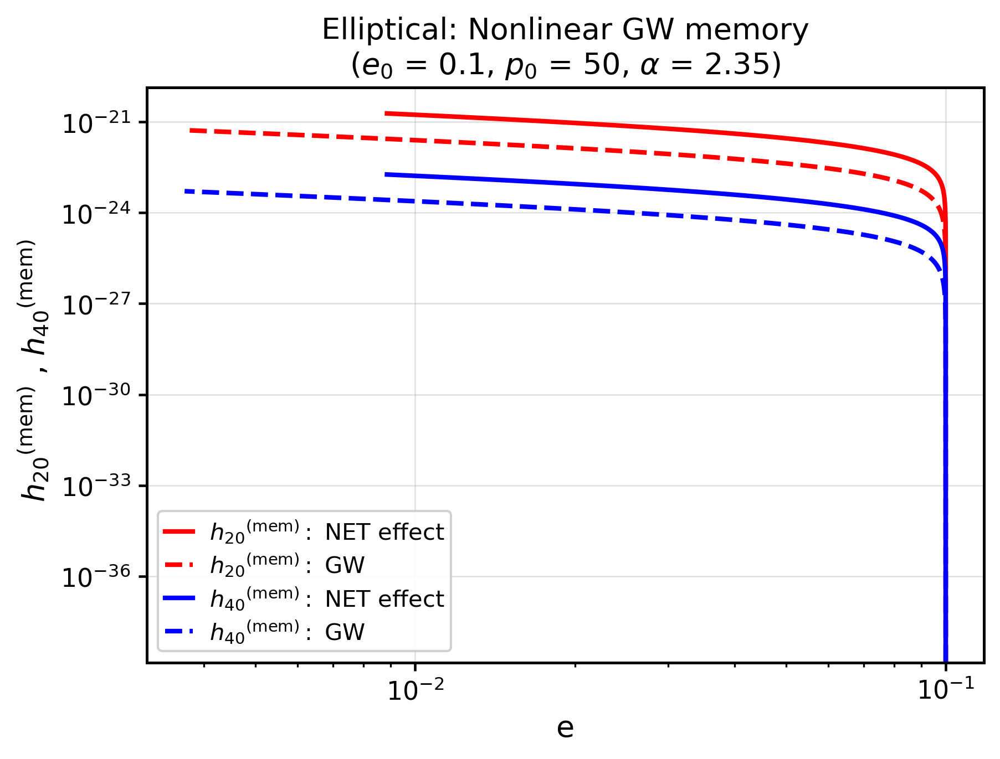

In [20]:
# Plotting
plt.figure()
plt.title('Elliptical: Nonlinear GW memory' + "\n" + rf'($e_0$ = {e_i}, $p_0$ = {p_i}, '+r'${{\alpha}}$' +f' = {alpha})')

plt.plot( y_net[0,:], h20_mem_NET, label = r' ${h_{20}}^{\text{(mem)}}:$' +' NET effect', linestyle='-', color='red' )
plt.plot( ygw[0,:], h20_mem_gw, label= r' ${h_{20}}^{\text{(mem)}}: $' + ' GW', linestyle='--', color='red')

plt.plot( y_net[0,:], h40_mem_NET, label = r' ${h_{40}}^{\text{(mem)}}:$' + ' NET effect', linestyle='-', color='blue' )
plt.plot( ygw[0,:], h40_mem_gw, label= r' ${h_{40}}^{\text{(mem)}}:$' + ' GW', linestyle='--', color='blue')

plt.xlabel('e')
plt.ylabel(r' ${h_{20}}^{\text{(mem)}}$ , ${h_{40}}^{\text{(mem)}}$')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.grid(True)

# Save as PDF
# plt.savefig("elliptical_spike_plot_1.pdf", format="pdf", bbox_inches="tight")

plt.show()

#### Elliptical : Nonlinear memory for different values of initial eccentricities ( $e_0$ )

A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.


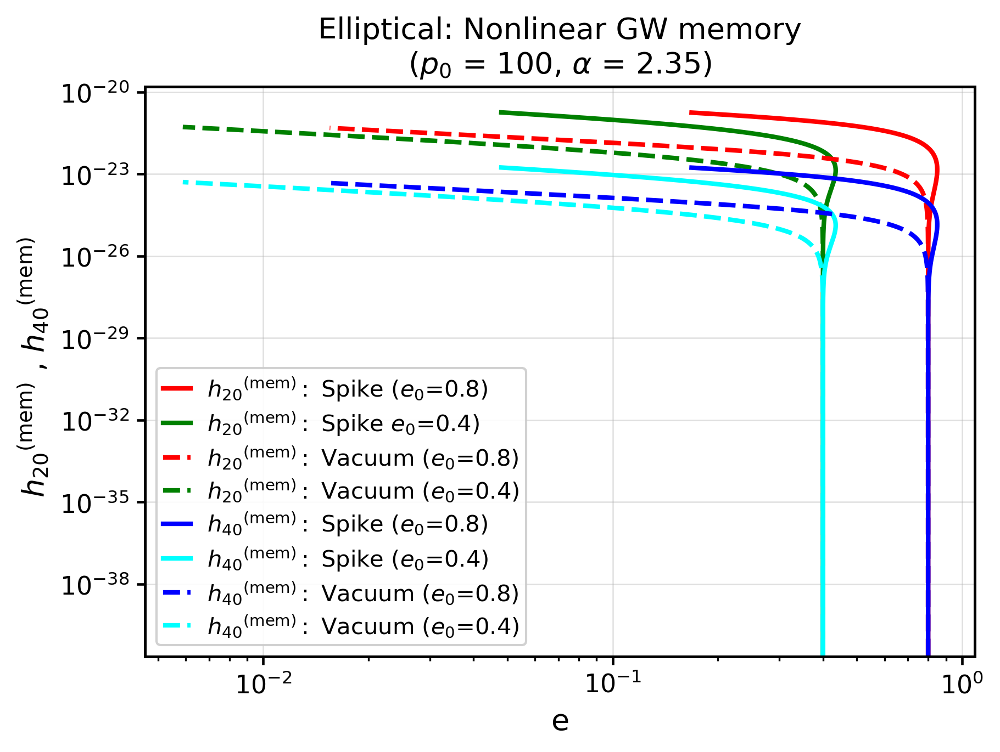

In [21]:
def elliptical_nonlinear_memo_diff_init_eccentricities(e_initials, p_0, omega_0, t_0, f_final, alpha, R):
    # initial eccentricities
    e0_1 = e_initials[0] 
    e0_2 = e_initials[1] 
    
    # Calculating Nonlinear GW memory for given initial orbital parameters
    nonlinear_memory1 = calculate_nonlinear_memory(e0_1, p_0, omega_0, t_0, f_final, alpha, R)
    nonlinear_memory2 = calculate_nonlinear_memory(e0_2, p_0, omega_0, t_0, f_final, alpha, R)
    
    # Only GW backreaction ( FAVATA result )
    fgw1, ygw1, h20_mem_gw1, h22P_mem_gw1, h22M_mem_gw1, h40_mem_gw1 = nonlinear_memory1.cal_hl0(F=0, combination=0)
    fgw2, ygw2, h20_mem_gw2, h22P_mem_gw2, h22M_mem_gw2, h40_mem_gw2 = nonlinear_memory2.cal_hl0(F=0, combination=0)
    
    # NET : DM gravity + Relativistic DF + Accretion + GW brxn
    f_net1, y_net1, h20_mem_NET1, h22P_mem_NET1, h22M_mem_NET1, h40_mem_NET1 = nonlinear_memory1.cal_hl0(F=FF(alpha), combination=3)
    f_net2, y_net2, h20_mem_NET2, h22P_mem_NET2, h22M_mem_NET2, h40_mem_NET2 = nonlinear_memory2.cal_hl0(F=FF(alpha), combination=3)
     
    # Plotting Nonlinear memory VS eccentrcity
    plt.figure()
    plt.title('Elliptical: Nonlinear GW memory' + "\n" + rf'($p_0$ = {p_0}, '+r'${{\alpha}}$' +f' = {alpha})')
    
    plt.plot( y_net1[0,:], h20_mem_NET1, label = r' ${h_{20}}^{\text{(mem)}}:$' +rf' Spike ($e_0$={e0_1})', linestyle='-', color='red' )
    plt.plot( y_net2[0,:], h20_mem_NET2, label = r' ${h_{20}}^{\text{(mem)}}:$' +rf' Spike $e_0$={e0_2})', linestyle='-', color='green' )
    
    plt.plot( ygw1[0,:], h20_mem_gw1, label= r' ${h_{20}}^{\text{(mem)}}: $' + rf' Vacuum ($e_0$={e0_1})', linestyle='--', color='red')
    plt.plot( ygw2[0,:], h20_mem_gw2, label= r' ${h_{20}}^{\text{(mem)}}: $' + rf' Vacuum ($e_0$={e0_2})', linestyle='--', color='green')
   
    plt.plot( y_net1[0,:], h40_mem_NET1, label = r' ${h_{40}}^{\text{(mem)}}:$' +rf' Spike ($e_0$={e0_1})', linestyle='-', color='blue' )
    plt.plot( y_net2[0,:], h40_mem_NET2, label = r' ${h_{40}}^{\text{(mem)}}:$' +rf' Spike ($e_0$={e0_2})', linestyle='-', color='cyan' )
     
    plt.plot( ygw1[0,:], h40_mem_gw1, label= r' ${h_{40}}^{\text{(mem)}}: $' + rf' Vacuum ($e_0$={e0_1})', linestyle='--', color='blue')
    plt.plot( ygw2[0,:], h40_mem_gw2, label= r' ${h_{40}}^{\text{(mem)}}: $' + rf' Vacuum ($e_0$={e0_2})', linestyle='--', color='cyan')
    
    plt.xlabel('e')
    plt.ylabel(r' ${h_{20}}^{\text{(mem)}}$ , ${h_{40}}^{\text{(mem)}}$')
    plt.xscale('log')
    plt.yscale('log')
    plt.legend()
    plt.grid(True)
    
    # Save as PDF
    plt.savefig("elliptical_spike_plot_3.pdf", format="pdf", bbox_inches="tight")
    
    plt.show()

# Initial orbital parameters
e_initials = [0.8, 0.4] # initial eccentrcities
p0, omega0, t0 = 100, 0.0, 0.0

# Plotting Nonlinear memory for different values of initial eccentricities
elliptical_nonlinear_memo_diff_init_eccentricities(e_initials, p0, omega0, t0, f_final, alpha, R)

#### Elliptical : Nonlinear memory for different values of initial semi-latus rectum ( $p_0$ )

A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.


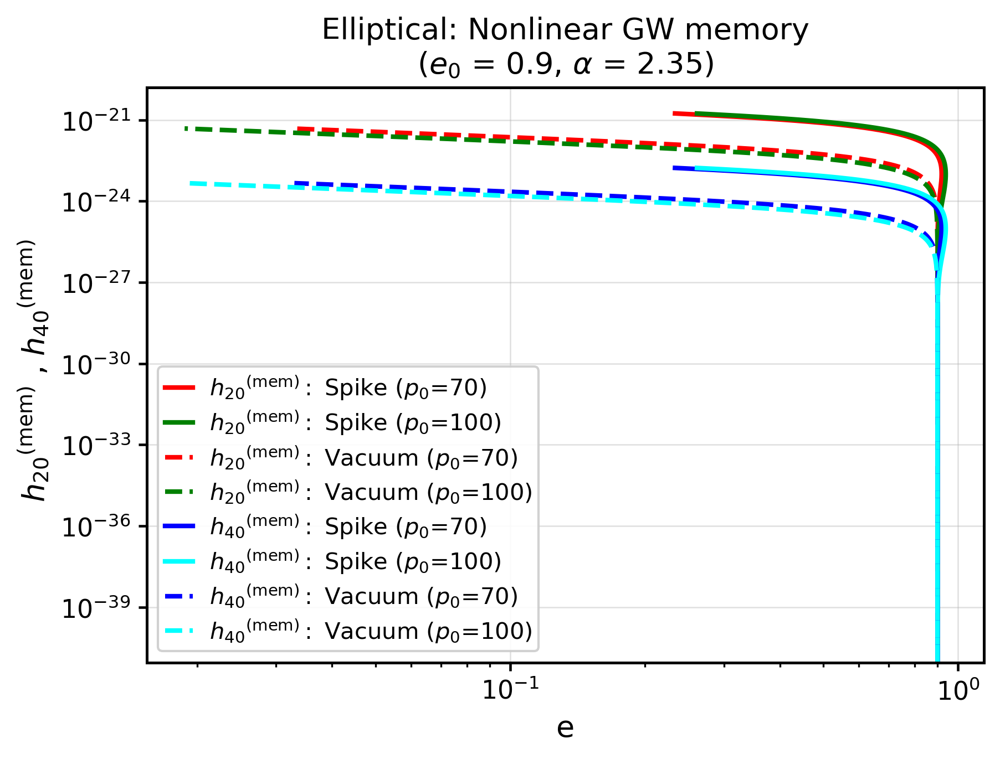

In [22]:
def elliptical_nonlinear_memo_diff_init_p(e_0, p_initials, omega_0, t_0, f_final, alpha, R):
    # initial semi-latus rectum values
    p0_1 = p_initials[0] 
    p0_2 = p_initials[1] 

    # Calculating Nonlinear GW memory for given initial orbital parameters
    nonlinear_memory1 = calculate_nonlinear_memory(e_0, p0_1, omega_0, t_0, f_final, alpha, R)
    nonlinear_memory2 = calculate_nonlinear_memory(e_0, p0_2, omega_0, t_0, f_final, alpha, R)
    
    # Only GW backreaction ( FAVATA result )
    fgw1, ygw1, h20_mem_gw1, h22P_mem_gw1, h22M_mem_gw1, h40_mem_gw1 = nonlinear_memory1.cal_hl0(F=0, combination=0)
    fgw2, ygw2, h20_mem_gw2, h22P_mem_gw2, h22M_mem_gw2, h40_mem_gw2 = nonlinear_memory2.cal_hl0(F=0, combination=0)
    
    # NET : DM gravity + Relativistic DF + Accretion + GW brxn
    f_net1, y_net1, h20_mem_NET1, h22P_mem_NET1, h22M_mem_NET1, h40_mem_NET1 = nonlinear_memory1.cal_hl0(F=FF(alpha), combination=3)
    f_net2, y_net2, h20_mem_NET2, h22P_mem_NET2, h22M_mem_NET2, h40_mem_NET2 = nonlinear_memory2.cal_hl0(F=FF(alpha), combination=3)
    
    # Plotting Nonlinear memory VS eccentrcity
    plt.figure()
    plt.title('Elliptical: Nonlinear GW memory' + "\n" + rf'($e_0$ = {e_0}, '+r'${{\alpha}}$' +f' = {alpha})')
    
    plt.plot( y_net1[0,:], h20_mem_NET1, label = r' ${h_{20}}^{\text{(mem)}}:$' +rf' Spike ($p_0$={p0_1})', linestyle='-', color='red' )
    plt.plot( y_net2[0,:], h20_mem_NET2, label = r' ${h_{20}}^{\text{(mem)}}:$' +rf' Spike ($p_0$={p0_2})', linestyle='-', color='green' )
    
    plt.plot( ygw1[0,:], h20_mem_gw1, label= r' ${h_{20}}^{\text{(mem)}}: $' + rf' Vacuum ($p_0$={p0_1})', linestyle='--', color='red')
    plt.plot( ygw2[0,:], h20_mem_gw2, label= r' ${h_{20}}^{\text{(mem)}}: $' + rf' Vacuum ($p_0$={p0_2})', linestyle='--', color='green')
   
    plt.plot( y_net1[0,:], h40_mem_NET1, label = r' ${h_{40}}^{\text{(mem)}}:$' +rf' Spike ($p_0$={p0_1})', linestyle='-', color='blue' )
    plt.plot( y_net2[0,:], h40_mem_NET2, label = r' ${h_{40}}^{\text{(mem)}}:$' +rf' Spike ($p_0$={p0_2})', linestyle='-', color='cyan' )
    
    plt.plot( ygw1[0,:], h40_mem_gw1, label= r' ${h_{40}}^{\text{(mem)}}: $' + rf' Vacuum ($p_0$={p0_1})', linestyle='--', color='blue')
    plt.plot( ygw2[0,:], h40_mem_gw2, label= r' ${h_{40}}^{\text{(mem)}}: $' + rf' Vacuum ($p_0$={p0_2})', linestyle='--', color='cyan')
    
    plt.xlabel('e')
    plt.ylabel(r' ${h_{20}}^{\text{(mem)}}$ , ${h_{40}}^{\text{(mem)}}$')
    plt.xscale('log')
    plt.yscale('log')
    plt.legend()
    plt.grid(True)

    # Save as PDF
    plt.savefig("elliptical_spike_plot_5.pdf", format="pdf", bbox_inches="tight")

    plt.show()

# Initial orbital parameters
p_initials = [70, 100] # initial semi-latus rectum values in ISCO units
e0, omega0, t0 = 0.9, 0.0, 0.0

# Plotting Nonlinear memory for three-different initial semi-latus rectum values
elliptical_nonlinear_memo_diff_init_p(e0, p_initials, omega0, t0, f_final, alpha, R)

#### Elliptical : Nonlinear memory for different values of Static DM exponent ($\alpha$) values

A termination event occurred.
A termination event occurred.
A termination event occurred.


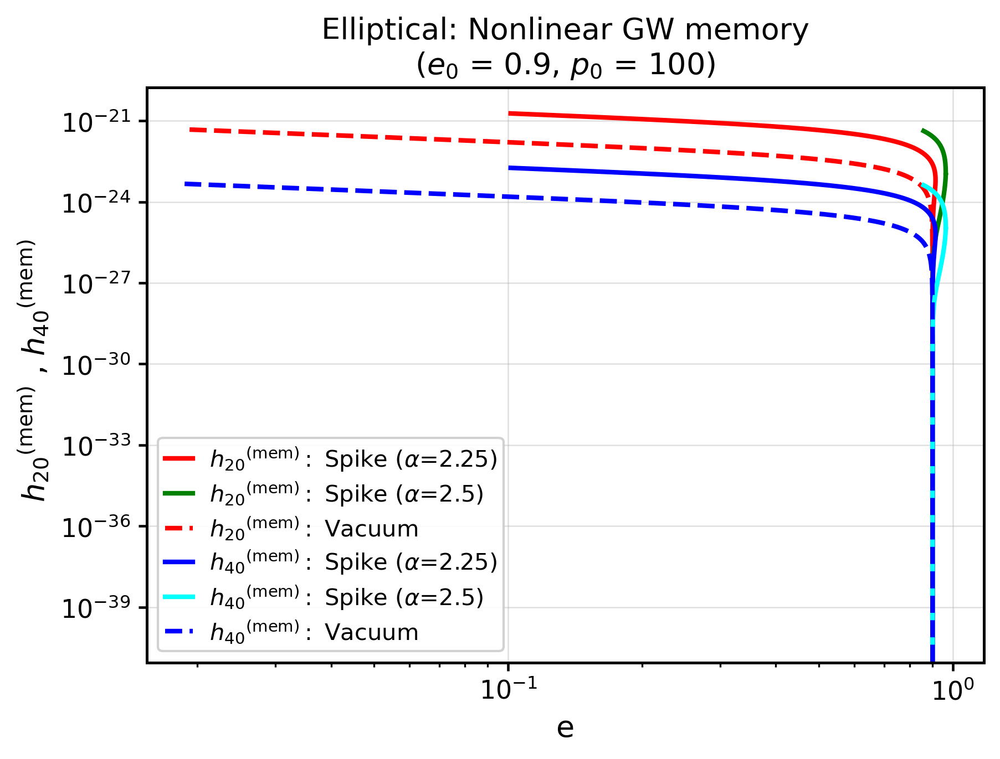

In [23]:
def elliptical_nonlinear_memo_diff_DM_exponent_vals(e_0, p_0, omega_0, t_0, f_final, alpha_vals, R):
    #  Static DM exponent values
    alpha_1 = alpha_vals[0] 
    alpha_2 = alpha_vals[1]
    
    # Calculating Nonlinear GW memory for given initial orbital parameters
    nonlinear_memory1 = calculate_nonlinear_memory(e_0, p_0, omega_0, t_0, f_final, alpha_1, R)
    nonlinear_memory2 = calculate_nonlinear_memory(e_0, p_0, omega_0, t_0, f_final, alpha_2, R)

    # Only GW backreaction ( FAVATA result )
    fgw1, ygw1, h20_mem_gw1, h22P_mem_gw1, h22M_mem_gw1, h40_mem_gw1 = nonlinear_memory1.cal_hl0(F=0, combination=0)

    # NET : DM gravity + Relativistic DF + Accretion + GW brxn
    f_net1, y_net1, h20_mem_NET1, h22P_mem_NET1, h22M_mem_NET1, h40_mem_NET1 = nonlinear_memory1.cal_hl0(F=FF(alpha_1), combination=3)
    f_net2, y_net2, h20_mem_NET2, h22P_mem_NET2, h22M_mem_NET2, h40_mem_NET2 = nonlinear_memory2.cal_hl0(F=FF(alpha_2), combination=3)

    # Plotting Nonlinear memory VS eccentrcity
    plt.figure()
    plt.title('Elliptical: Nonlinear GW memory' + "\n" + rf'($e_0$ = {e_0}, $p_0$ = {p_0})')
    
    plt.plot( y_net1[0,:], h20_mem_NET1, label = r' ${h_{20}}^{\text{(mem)}}:$' +rf' Spike ($\alpha$={alpha_1})', linestyle='-', color='red' )
    plt.plot( y_net2[0,:], h20_mem_NET2, label = r' ${h_{20}}^{\text{(mem)}}:$' +rf' Spike ($\alpha$={alpha_2})', linestyle='-', color='green' )
    
    plt.plot( ygw1[0,:], h20_mem_gw1, label= r' ${h_{20}}^{\text{(mem)}}: $' + rf' Vacuum', linestyle='--', color='red')
    
    plt.plot( y_net1[0,:], h40_mem_NET1, label = r' ${h_{40}}^{\text{(mem)}}:$' +rf' Spike ($\alpha$={alpha_1})', linestyle='-', color='blue' )
    plt.plot( y_net2[0,:], h40_mem_NET2, label = r' ${h_{40}}^{\text{(mem)}}:$' +rf' Spike ($\alpha$={alpha_2})', linestyle='-', color='cyan' )
    
    plt.plot( ygw1[0,:], h40_mem_gw1, label= r' ${h_{40}}^{\text{(mem)}}: $' + rf' Vacuum', linestyle='--', color='blue')
    
    plt.xlabel('e')
    plt.ylabel(r' ${h_{20}}^{\text{(mem)}}$ , ${h_{40}}^{\text{(mem)}}$')
    plt.xscale('log')
    plt.yscale('log')
    plt.legend()
    plt.grid(True)

    # Save as PDF
    plt.savefig("elliptical_spike_plot_7.pdf", format="pdf", bbox_inches="tight") 

    plt.show()

# Initial orbital parameters
e0, p0, omega0, t0 = 0.9, 100, 0.0, 0.0

alpha_vals = [2.25, 2.5] # Static DM exponent values

# Plotting Nonlinear memory for three-different Static DM exponent values
elliptical_nonlinear_memo_diff_DM_exponent_vals(e0, p0, omega0, t0, f_final, alpha_vals, R)

## Elliptical : Quadrupolar waveform With and Without memory

#### Mass quadrupole moment

Newtonian Mass-quadrupole moment of binaries :

$ {\mathcal{I}_{20}^{\text{N}}} = - 4 \sqrt{ \frac{\pi}{15} } \eta m {r(t)}^2  $

$ {\mathcal{I}_{2 \pm 2}^{\text{N}}} = 2 \sqrt{\frac{2\pi}{5}} \eta m {r(t)}^2 \exp{ (\mp \mathcal{i} \phi {t} )} $

#### Quadrupolar waveform $lm$ modes w/o memory

$ {h_{lm}^{\text{N}}} = \frac{{\mathcal{I}_{lm}^{(l)}}}{R \sqrt{2}}  $

#### Quadrupolar waveform $lm$ modes with memory

$ {h_{lm}} \approx \frac{{\mathcal{I}_{lm}^{(l)}}}{R \sqrt{2}} + h_{lm}^{(\text{mem})} $

#### GW polarizations upto l = 2 modes

$ h_{+} - i h_{\times} \approx \sum_{m=-2}^{m=2} H_{2m} Y_{2m} (\Theta, \Phi) = H_{20} Y_{20} + H_{2+2} Y_{2+2}+ H_{2-2} Y_{2-2}$

Replace $H_{lm} = {h_{lm}^{\text{N}}} $ or $ { h_{lm}} $ to get polarization without and with memory repectively.

$Y_{lm}$ is spin = 2 weighted spherical harmonics.

$ \Theta = \frac{\pi}{3}$ = Inclination angle.

$  \Phi $ =  Coalescence phase angle.

## GW Detectors Response [ArXiv](https://arxiv.org/pdf/1105.3567) 

The strain $h(t)$ that the waves produce in the interferometric detector is the following linear combination of $h_{+}(t)$ and $h_{\times}(t)$ :

$ \boxed{ h(t) = F_{+}(t) h_{+}(t) + F_{\times}(t) h_{\times}(t) }$

where $F_{+}$ and $F_{\times}$ are "detector beam-pattern" coefficients that depend in the following way on the source direction $(\Theta', \Phi')$ and on the polarization angle $\psi$:

$ F_{+} = \frac{1}{2} (1+ \cos^2 \Theta') \cos(2\Phi') \cos(2\Psi) - \cos \Theta' \sin (2\Phi') \sin (2\Psi)  $,

$ F_{\times} = \frac{1}{2} (1+ \cos^2 \Theta') \cos(2\Phi') \sin(2\Psi) + \cos \Theta' \sin (2\Phi') \cos (2\Psi)  $

where $(\Theta', \Phi') $ are source's sky location in a detector based coordinate system and $\Psi$ is polarization angle of the wavefront. These can be given in terms of fixed, ecliptic-based coordinate system as :


### $ \cos \Theta' (t) = \frac{1}{2} \cos \Theta'_S - \frac{\sqrt{3}}{2} \sin \Theta'_S \cos [ \bar{ \Phi'}_0  + 2 \pi (t/T) -\Phi'_S]$

### $ \Phi'(t)=\bar{\alpha}_0 + 2\pi (t/T) +\tan^{-1} \left( \frac{\sqrt{3}\cos\Theta'_S + \sin\Theta'_S\cos\!\big(\bar{\Phi'}_0 + 2\pi(t/T) - \Phi'_S\big)} {2\sin\Theta'_S\sin\!\big(\bar{\Phi'}_0 + 2\pi(t/T) - \Phi'_S\big)} \right) $

#### $ \tan \Psi (t) = \frac{ \left( \frac{1}{2} \cos \Theta'_K - \frac{\sqrt{3}}{2}\sin \Theta'_K \cos [ \bar{\Phi'}_0 + 2 \pi (t/T) -\Phi'_K ] - \cos \Theta' (t) [ \cos \Theta'_K \cos \Theta'_S + \sin \Theta'_K \sin \Theta'_S \cos ( \Phi'_K - \Phi'_S )] \right) }{ \left( \frac{1}{2} \sin \Theta'_K \sin \Theta'_S  \sin ( \Phi'_K - \Phi'_S ) - \frac{\sqrt{3}}{2} \cos ( \bar{\Phi'_0} + 2 \pi (t/T) ) ( \cos \Theta'_K \sin \Theta'_S \sin \Phi'_S - \cos \Theta'_S \sin \Theta'_K \sin \Phi'_K  ) - \frac{\sqrt{3}}{2} \sin( \bar{\Phi'_0} + 2 \pi (t/T) )  ( \cos \Theta'_S \sin \Theta'_K \cos \Phi'_K - \cos \Theta'_K \sin \Theta'_S \cos \Phi'_S )    \right) }$

where $\bar{\Phi'}_0 $ and $ \bar{\alpha}_0$ are constant angles which represent the orbital and rotational phase of the detector at t = 0. We will set both to zero in our analysis.

$ T = 1 $ year is LISA orbital period.

$ (\Theta'_S, \Phi'_S)  $ source co-latitude and azimuth angles in fixed ecliptic-based coordinate system.

$ (\Theta'_K, \Phi'_K ) $ direction of $\hat{a}$  in fixed ecliptic-based coordinate system.

We take:

$\Theta'_S = \frac{\pi}{4}$

$\Phi'_S = \frac{\pi}{4} $

$\Theta'_K = \frac{\pi}{8}$

$\Theta'_K = \frac{\pi}{8} $

#### LISA response ( for low frequencies $ f \leq 10 \, \text{mHz}$ )

$ \boxed{h_{\alpha} (t) = \frac{\sqrt{3}}{2R} \big[ F_{\alpha}^{+} (t) A^{+} (t) + F_{\alpha}^{\times} (t) A^{\times} (t)  \big]}$

where $\alpha = $ I, II refers to two independent Michelson-like detectors that constitute the LISa response at low frequencies.

$ A^{+, \times} (t) $ are polarization coefficients given as:

$ A^{+} (t) = R \, h_{+} (t) $

$ A^{\times} (t) = R \, h_{\times} (t) $

The antenna pattern functions $F_{\alpha}^{+,\times} $ are given as :

$ F_{I}^{+} = \frac{1}{2} (1+ \cos^2 \Theta') \cos(2\Phi') \cos(2\Psi) - \cos \Theta' \sin (2\Phi') \sin (2\Psi)  $,

$ F_{I}^{\times} = \frac{1}{2} (1+ \cos^2 \Theta') \cos(2\Phi') \sin(2\Psi) + \cos \Theta' \sin (2\Phi') \cos (2\Psi)  $,

$ F_{II}^{+} = \frac{1}{2} (1+ \cos^2 \Theta') \sin(2\Phi') \cos(2\Psi) + \cos \Theta' \cos (2\Phi') \sin (2\Psi)  $,

$ F_{II}^{\times} = \frac{1}{2} (1+ \cos^2 \Theta') \sin(2\Phi') \sin(2\Psi) - \cos \Theta' \cos (2\Phi') \cos (2\Psi)  $

In [24]:
class quadrupolar_waveform():
    # Initial parameters
    def __init__(self, y, f, alpha, R, h20_mem, h22P_mem, h22M_mem, h40_mem):
        self.y = y
        self.f = f
        self.alpha = alpha
        self.R = R
        self.h20_mem = h20_mem
        self.h22P_mem = h22P_mem
        self.h22M_mem = h22M_mem
        self.h40_mem = h40_mem
        
    def angles_in_source_frame(self):
        # For orbit in Equatorial plane
        Theta = np.pi/3
        # Coalescene phase
        e, p, phi, t = self.y
        Phi = phi[-1]
        return Theta, Phi
    
    # Source location in detector frame
    def source_location_and_polarization_angle(self):
        y = self.y
        t = y[3]
        T = 365*24*3600/t_factor
        
        phi_0 = 0.0
        alpha_0 = 0.0
        
        theta_s = np.pi/4
        phi_s = np.pi/4
        theta_k = np.pi/8
        phi_k = np.pi/8

        # Source location in dectector frame
        Theta_dash = np.arccos( (1/2)*np.cos(theta_s) - (np.sqrt(3)/2)*np.sin(theta_s)*np.cos(phi_0 + 2*np.pi*(t/T) - phi_s ) )
        Phi_dash = alpha_0 + 2*np.pi*t/T + np.arctan( ( np.sqrt(3)*np.cos(theta_s)+np.sin(theta_s)*np.cos(phi_0+ 2*np.pi*t/T -phi_s) ) / 
                                                 ( 2*np.sin(theta_s)*np.sin(phi_0 + 2*np.pi*t/T - phi_s)  )  )

        # Polarization angle
        Psi = (( (1/2)*np.cos(theta_k) - (np.sqrt(3)/2)*np.sin(theta_k)*np.cos(phi_0+ 2*np.pi*t/T -phi_s) 
                - np.cos(Theta_dash)*( np.cos(theta_k)*np.cos(theta_s) + np.sin(theta_k)*np.sin(theta_s)*np.cos(phi_k-phi_s) )  )/
               ( (1/2)*np.sin(theta_k)*np.sin(theta_s)*np.sin(phi_k-phi_s) -(np.sqrt(3)/2)*np.cos(phi_0+2*np.pi*t/T)*
                 ( np.cos(theta_k)*np.sin(theta_s)*np.sin(phi_s) - np.cos(theta_s)*np.sin(theta_k)*np.sin(phi_k) )
                 - (np.sqrt(3)/2)*np.sin(phi_0+2*np.pi*t/T)*( np.cos(theta_s)*np.sin(theta_k)*np.cos(phi_k) - 
                                                              np.cos(theta_k)*np.sin(theta_s)*np.cos(phi_s)  )   ) )

        return Theta_dash, Phi_dash, Psi

    def quad_modes(self, F, combination, memory):
        r = rel_distance(self.y, self.f)
        rdot = r_dot(self.y, self.f, self.alpha, combination)
        rdotdot = r_dotdot(self.y, self.f, self.alpha, F, combination)
        phidot = phi_dot(self.y, self.f, self.alpha, combination)
        phidotdot = phi_dotdot(self.y, self.f, self.alpha, F, combination)
        # Calculating 2nd derivative of mass-quadrupole moment
        I20dotdot = I20dd_func(r, self.f, rdot, rdotdot, phidot, phidotdot, M, eta)
        I22Pdotdot = I22Pdd_func(r, self.f, rdot, rdotdot, phidot, phidotdot, M, eta)
        I22Mdotdot = I22Mdd_func(r, self.f, rdot, rdotdot, phidot, phidotdot, M, eta)

        if memory == 0:  # Quadrupole modes Without nonlinear memory
            H20 = I20dotdot/(self.R * np.sqrt(2))
            H22P = I22Pdotdot/(self.R * np.sqrt(2))
            H22M = I22Mdotdot/(self.R * np.sqrt(2))
        else:
            H20 = I20dotdot/(self.R * np.sqrt(2)) + self.h20_mem
            H22P = I22Pdotdot/(self.R * np.sqrt(2)) + self.h22P_mem
            H22M = I22Mdotdot/(self.R * np.sqrt(2)) + self.h22M_mem
            
        return H20, H22P, H22M

    # GW polarization wrt time
    def GW_polarization(self, F, combination, memory):
        # Angles in source frame
        Theta, Phi = self.angles_in_source_frame()
        
        # Spin = 2 weighted spherical harmonics
        Y20 = (3/4)*np.sqrt(5/(6*np.pi))*(np.sin(Theta))**2
        Y22P = (1/8)*np.sqrt(5/np.pi)* (1 + np.cos(Theta))**2 * np.exp(2*1j*Phi)
        Y22M = (1/8)*np.sqrt(5/np.pi)* (1 - np.cos(Theta))**2 * np.exp(-2*1j*Phi)

        # h2m quadrupolar waveform modes
        H20, H22P, H22M = self.quad_modes(F, combination, memory)

        # GW polarizations
        h_plus = np.real( H20*Y20 + H22P*Y22P + H22M*Y22M )
        h_cross = - np.imag( H20*Y20 + H22P*Y22P + H22M*Y22M )
        
        return h_plus, h_cross

    # GW detector response of Strain signal wrt time
    def detector_response(self, F, combination, memory):
        # Source location and polarization angle
        Theta, Phi, Psi = self.source_location_and_polarization_angle()
        
        # GW polarization
        h_plus, h_cross = self.GW_polarization(F, combination, memory)

        # Detectors Antenna-Pattern function
        F_plus = (1/2)*(1+(np.cos(Theta))**2)*np.cos(2*Phi)*np.cos(2*Psi) - np.cos(Theta)*np.sin(2*Phi)*np.sin(2*Psi)
        F_cross = (1/2)*(1+(np.cos(Theta))**2)*np.cos(2*Phi)*np.sin(2*Psi) + np.cos(Theta)*np.sin(2*Phi)*np.cos(2*Psi)

        return ( F_plus * h_plus + F_cross * h_cross )

    # LISA response of Strain signal wrt time
    def lisa_detector_response(self, F, combination, memory):
        # Source location and polarization angle
        Theta, Phi, Psi = self.source_location_and_polarization_angle()
        
        # GW polarization
        h_plus, h_cross = self.GW_polarization(F, combination, memory)

        # LISA Detectors Antenna-Pattern function
        F_plus1 = (1/2)*(1+(np.cos(Theta))**2)*np.cos(2*Phi)*np.cos(2*Psi) - np.cos(Theta)*np.sin(2*Phi)*np.sin(2*Psi)
        F_cross1 = (1/2)*(1+(np.cos(Theta))**2)*np.cos(2*Phi)*np.sin(2*Psi) + np.cos(Theta)*np.sin(2*Phi)*np.cos(2*Psi)
        F_plus2 = (1/2)*(1+(np.cos(Theta))**2)*np.sin(2*Phi)*np.cos(2*Psi) + np.cos(Theta)*np.cos(2*Phi)*np.sin(2*Psi)
        F_cross2 = (1/2)*(1+(np.cos(Theta))**2)*np.sin(2*Phi)*np.sin(2*Psi) - np.cos(Theta)*np.cos(2*Phi)*np.cos(2*Psi)

        return (np.sqrt(3)/2)*(F_plus1 * h_plus + F_cross1 * h_cross), (np.sqrt(3)/2)*(F_plus2 * h_plus + F_cross2 * h_cross)

     # GW Memory polarization wrt time
    def GW_memory_polarization(self):
        # Angles in source frame
        Theta, Phi = self.angles_in_source_frame()
        
        # Spin = 2 weighted spherical harmonics - 20 and 40 are dominant memory modes
        Y20 = (3/4)*np.sqrt(5/(6*np.pi))*(np.sin(Theta))**2
        Y40 = (3/8)*np.sqrt(5/(2*np.pi))*(np.sin(Theta))**2 * (7*(np.cos(Theta))**2 -1)

        # GW Memory polarizations
        h_plus_mem = np.real(self.h20_mem*Y20 + self.h40_mem*Y40)
        h_cross_mem = - np.imag(self.h20_mem*Y20 + self.h40_mem*Y40)
        
        return h_plus_mem, h_cross_mem

    # LISA response of Memory Strain signal wrt time
    def lisa_detector_memory_response(self):
        # Source location and polarization angle
        Theta, Phi, Psi = self.source_location_and_polarization_angle()
        
        # GW Memory polarization
        h_plus_mem, h_cross_mem = self.GW_memory_polarization()

        # LISA Detectors Antenna-Pattern function
        F_plus1 = (1/2)*(1+(np.cos(Theta))**2)*np.cos(2*Phi)*np.cos(2*Psi) - np.cos(Theta)*np.sin(2*Phi)*np.sin(2*Psi)
        F_cross1 = (1/2)*(1+(np.cos(Theta))**2)*np.cos(2*Phi)*np.sin(2*Psi) + np.cos(Theta)*np.sin(2*Phi)*np.cos(2*Psi)
        F_plus2 = (1/2)*(1+(np.cos(Theta))**2)*np.sin(2*Phi)*np.cos(2*Psi) + np.cos(Theta)*np.cos(2*Phi)*np.sin(2*Psi)
        F_cross2 = (1/2)*(1+(np.cos(Theta))**2)*np.sin(2*Phi)*np.sin(2*Psi) - np.cos(Theta)*np.cos(2*Phi)*np.cos(2*Psi)

        return (np.sqrt(3)/2)*(F_plus1 * h_plus_mem + F_cross1 * h_cross_mem), (np.sqrt(3)/2)*(F_plus2 * h_plus_mem + F_cross2 * h_cross_mem)

In [25]:
# Quadrupolar waveform without memory and without DM 
quadrupolar_waveform_gw = quadrupolar_waveform(ygw, fgw, alpha, R, h20_mem_gw, h22P_mem_gw, h22M_mem_gw, h40_mem_gw)
h20_gw, h22P_gw, h22M_gw = quadrupolar_waveform_gw.quad_modes(F=0, combination=0, memory=0)

# Quadrupolar waveform without memory and with DM ( NET effects )
quadrupolar_waveform_NET = quadrupolar_waveform(y_net, f_net, alpha, R, h20_mem_NET, h22P_mem_NET, h22M_mem_NET, h40_mem_NET)
h20_NET, h22P_NET, h22M_NET = quadrupolar_waveform_NET.quad_modes(F=FF(alpha), combination=3, memory=0)

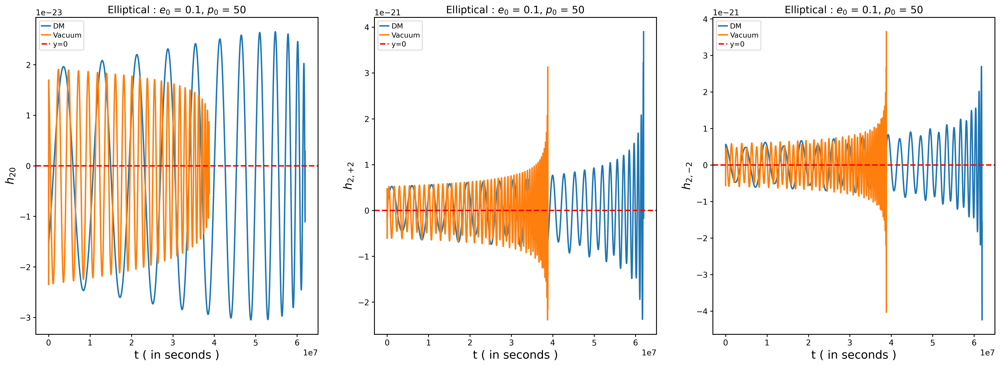

In [26]:
# Plotting
plt.figure(figsize=(24,8))

plt.subplot(131)
plt.plot( y_net[3,:]*t_factor, h20_NET, label='DM' )
plt.plot( ygw[3,:]*t_factor, h20_gw, label='Vacuum' )
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--', label='y=0')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{20} $', fontsize =16)
plt.title(rf'Elliptical : $e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.subplot(132)
plt.plot( y_net[3,:]*t_factor, np.real(h22P_NET), label='DM' )
plt.plot( ygw[3,:]*t_factor, np.real(h22P_gw), label='Vacuum' )
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--', label='y=0')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{2,\plus 2 } $', fontsize =16)
plt.title(rf'Elliptical : $e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.subplot(133)
plt.plot( y_net[3,:]*t_factor, np.imag(h22P_NET), label='DM' )
plt.plot( ygw[3,:]*t_factor, np.imag(h22P_gw), label='Vacuum' )
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--', label='y=0')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{2,\minus 2} $', fontsize =16)
plt.title(rf'Elliptical : $e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.show()

In [27]:
# Quadrupolar waveform with memory and without DM 
h20_gw_with_memory, h22P_gw_with_memory, h22M_gw_with_memory = quadrupolar_waveform_gw.quad_modes(F=0, combination=0, memory=1)

# Quadrupolar waveform with both memory and DM ( NET effects )
h20_NET_with_memory, h22P_NET_with_memory, h22M_NET_with_memory = quadrupolar_waveform_NET.quad_modes(F=FF(alpha), combination=3, memory=1)

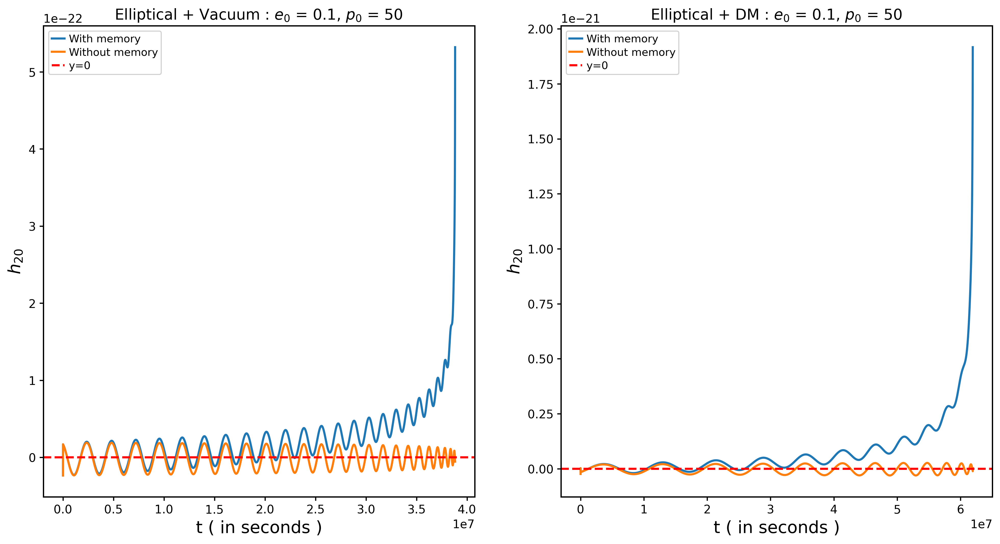

In [28]:
# Plotting
plt.figure(figsize=(16,8))

plt.subplot(121)
plt.plot( ygw[3,:]*t_factor, h20_gw_with_memory, label='With memory' )
plt.plot( ygw[3,:]*t_factor, h20_gw, label='Without memory' )
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--', label='y=0')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{20} $', fontsize =16)
plt.title(rf'Elliptical + Vacuum : $e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.subplot(122)
plt.plot( y_net[3,:]*t_factor, h20_NET_with_memory, label='With memory' )
plt.plot( y_net[3,:]*t_factor, h20_NET, label='Without memory' )
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--', label='y=0')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{20} $', fontsize =16)
plt.title(rf'Elliptical + DM : $e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.show()

In [29]:
# GW polarizations without memory and without DM 
hplus_gw_without_memory, hcross_gw_without_memory = quadrupolar_waveform_gw.GW_polarization(F=0, combination=0, memory=0)

# GW polarizations without memory and with DM 
hplus_NET_without_memory, hcross_NET_without_memory = quadrupolar_waveform_NET.GW_polarization(F=FF(alpha), combination=3, memory=0)

# GW polarizations with memory and without DM 
hplus_gw_with_memory, hcross_gw_with_memory = quadrupolar_waveform_gw.GW_polarization(F=0, combination=0, memory=1)

# GW polarizations with memory and with DM 
hplus_NET_with_memory, hcross_NET_with_memory = quadrupolar_waveform_NET.GW_polarization(F=FF(alpha), combination=3, memory=1)

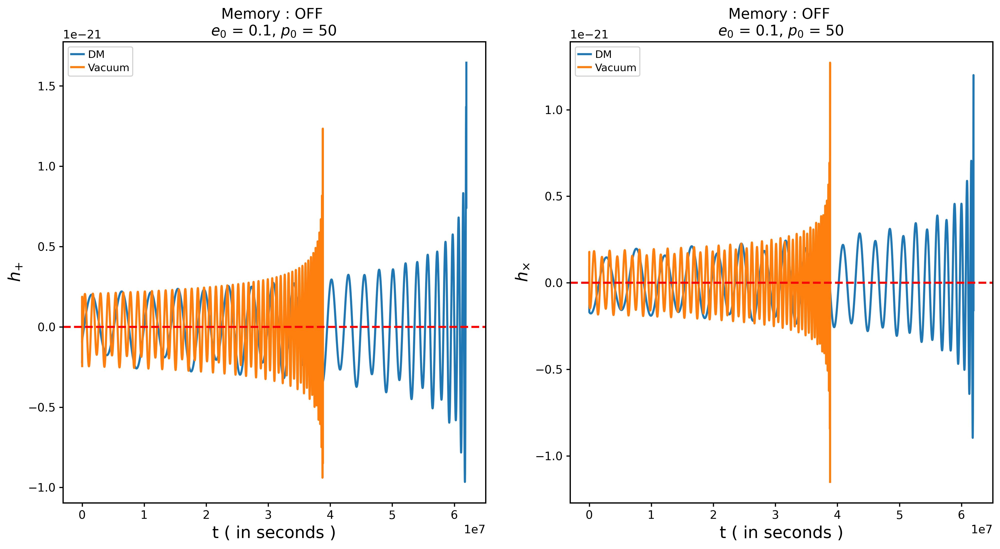

In [30]:
# Plotting
plt.figure(figsize=(16,8))

plt.subplot(121)
plt.plot( y_net[3,:]*t_factor, hplus_NET_without_memory, label='DM' )
plt.plot( ygw[3,:]*t_factor, hplus_gw_without_memory, label='Vacuum' )
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{+} $', fontsize =16)
plt.title('Memory : OFF \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.subplot(122)
plt.plot( y_net[3,:]*t_factor, hcross_NET_without_memory, label='DM' )
plt.plot( ygw[3,:]*t_factor, hcross_gw_without_memory, label='Vacuum' )
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{\times} $', fontsize =16)
plt.title('Memory : OFF \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.show()

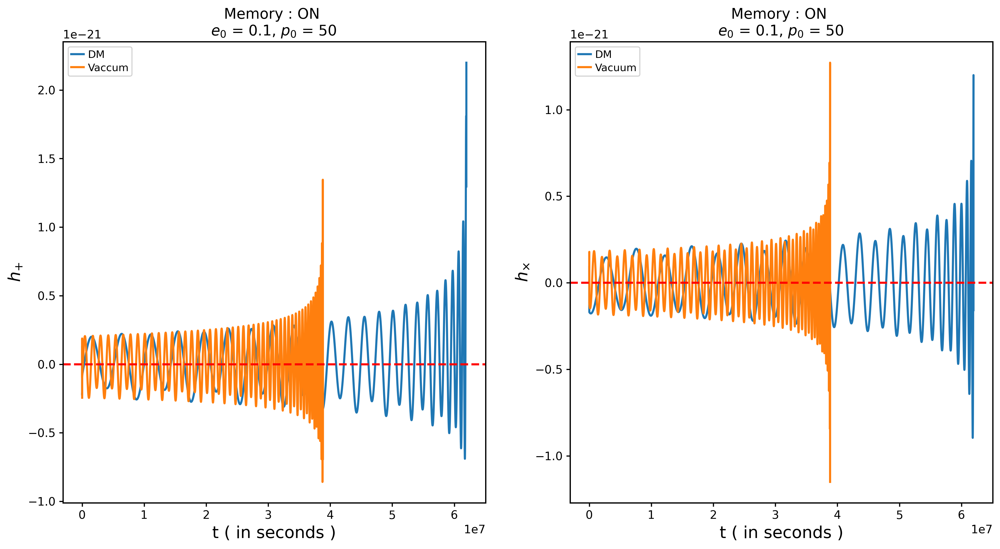

In [31]:
# Plotting
plt.figure(figsize=(16,8))

plt.subplot(121)
plt.plot( y_net[3,:]*t_factor, hplus_NET_with_memory, label='DM' )
plt.plot( ygw[3,:]*t_factor, hplus_gw_with_memory, label='Vaccum' )
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{+} $', fontsize =16)
plt.title('Memory : ON \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.subplot(122)
plt.plot( y_net[3,:]*t_factor, hcross_NET_with_memory, label='DM' )
plt.plot( ygw[3,:]*t_factor, hcross_gw_with_memory, label='Vacuum')
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{\times} $', fontsize =16)
plt.title('Memory : ON \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.show()

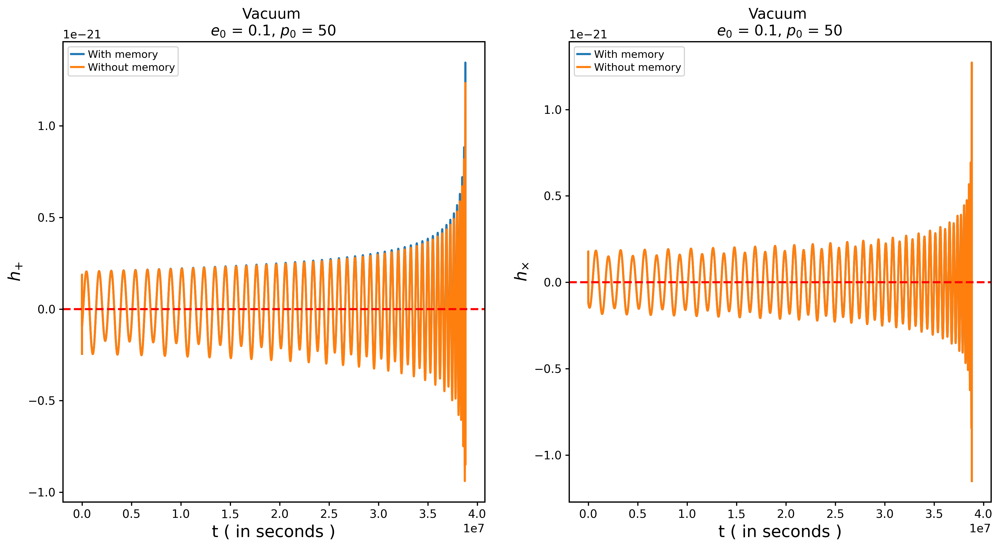

In [32]:
# Plotting
plt.figure(figsize=(16,8))

plt.subplot(121)
plt.plot( ygw[3,:]*t_factor, hplus_gw_with_memory, label='With memory')
plt.plot( ygw[3,:]*t_factor, hplus_gw_without_memory, label='Without memory')
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{+} $', fontsize =16)
plt.title('Vacuum \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.subplot(122)
plt.plot( ygw[3,:]*t_factor, hcross_gw_with_memory, label='With memory')
plt.plot( ygw[3,:]*t_factor, hcross_gw_without_memory, label='Without memory')
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{\times} $', fontsize =16)
plt.title('Vacuum \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.show()

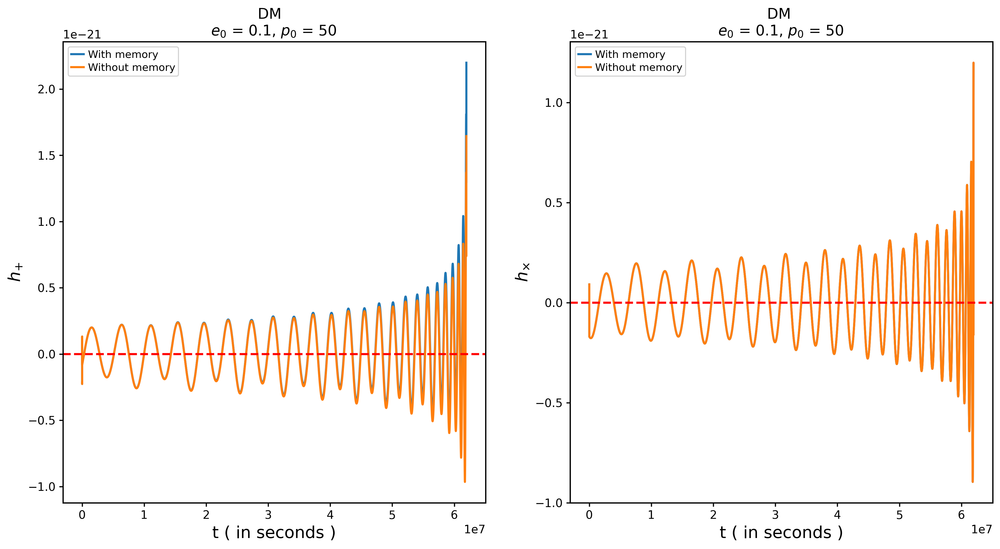

In [33]:
# Plotting
plt.figure(figsize=(16,8))

plt.subplot(121)
plt.plot( y_net[3,:]*t_factor, hplus_NET_with_memory, label='With memory')
plt.plot( y_net[3,:]*t_factor, hplus_NET_without_memory, label='Without memory')
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{+} $', fontsize =16)
plt.title('DM  \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.subplot(122)
plt.plot( y_net[3,:]*t_factor, hcross_NET_with_memory, label='With memory')
plt.plot( y_net[3,:]*t_factor, hcross_NET_without_memory, label='Without memory')
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{\times} $', fontsize =16)
plt.title('DM \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.show()

In [34]:
# GW Detector response in time
ht_response_gw_without_memory = quadrupolar_waveform_gw.detector_response(F=0, combination=0, memory=0)
ht_response_gw_with_memory = quadrupolar_waveform_gw.detector_response(F=0, combination=0, memory=1)

ht_response_NET_without_memory = quadrupolar_waveform_NET.detector_response(F=FF(alpha), combination=3, memory=0)
ht_response_NET_with_memory = quadrupolar_waveform_NET.detector_response(F=FF(alpha), combination=3, memory=1)

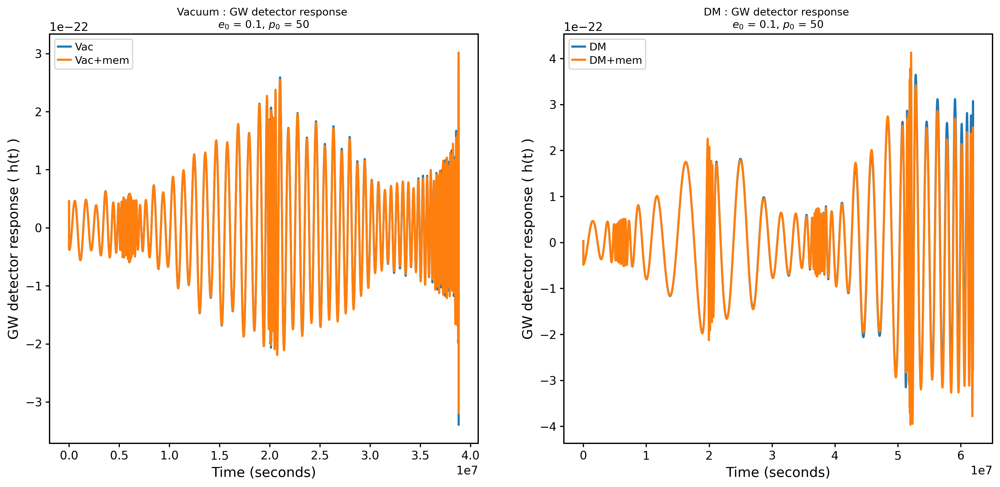

In [35]:
plt.figure(figsize=(16,7))
plt.subplot(121)
plt.plot(ygw[3]*t_factor, ht_response_gw_without_memory, label='Vac')
plt.plot(ygw[3]*t_factor, ht_response_gw_with_memory, label='Vac+mem')
plt.xlabel('Time (seconds)')
plt.ylabel('GW detector response ( h(t) )')
plt.title('Vacuum : GW detector response \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =10)
plt.legend(loc='upper left')

plt.subplot(122)
plt.plot(y_net[3]*t_factor, ht_response_NET_without_memory, label='DM')
plt.plot(y_net[3]*t_factor, ht_response_NET_with_memory, label='DM+mem')
plt.xlabel('Time (seconds)')
plt.ylabel('GW detector response ( h(t) )')
plt.title('DM : GW detector response \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =10)
plt.legend(loc='upper left')
plt.show()

In [36]:
# LISA GW Detector response of Interferrometer-I and II in time
ht1_lisa_response_gw_without_memory, ht2_lisa_response_gw_without_memory = quadrupolar_waveform_gw.lisa_detector_response(F=0, combination=0, memory=0)
ht1_lisa_response_gw_with_memory, ht2_lisa_response_gw_with_memory = quadrupolar_waveform_gw.lisa_detector_response(F=0, combination=0, memory=1)

ht1_lisa_response_NET_without_memory, ht2_lisa_response_NET_without_memory = quadrupolar_waveform_NET.lisa_detector_response(F=FF(alpha), combination=3, memory=0)
ht1_lisa_response_NET_with_memory, ht2_lisa_response_NET_with_memory = quadrupolar_waveform_NET.lisa_detector_response(F=FF(alpha), combination=3, memory=1)

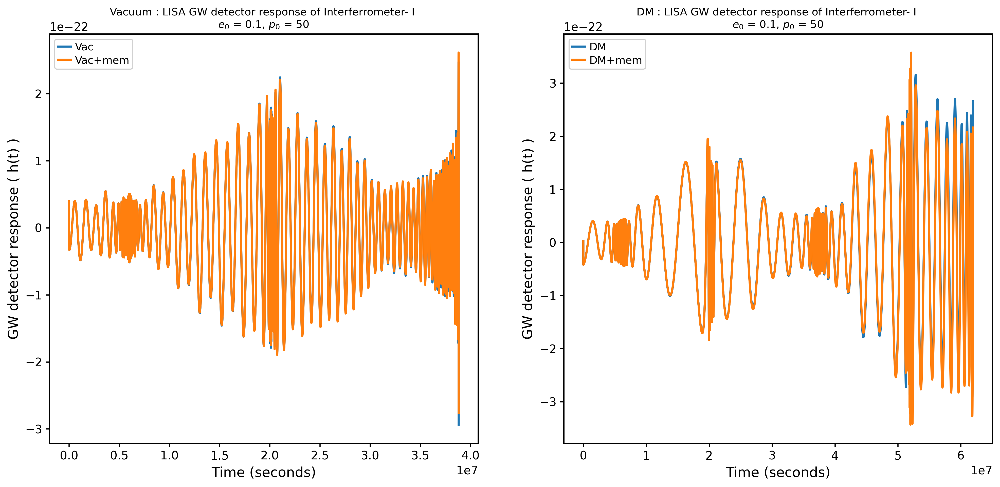

In [37]:
plt.figure(figsize=(16,7))
plt.subplot(121)
plt.plot(ygw[3]*t_factor, ht1_lisa_response_gw_without_memory, label='Vac')
plt.plot(ygw[3]*t_factor, ht1_lisa_response_gw_with_memory, label='Vac+mem')
plt.xlabel('Time (seconds)')
plt.ylabel('GW detector response ( h(t) )')
plt.title('Vacuum : LISA GW detector response of Interferrometer- I \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =10)
plt.legend(loc='upper left')

plt.subplot(122)
plt.plot(y_net[3]*t_factor, ht1_lisa_response_NET_without_memory, label='DM')
plt.plot(y_net[3]*t_factor, ht1_lisa_response_NET_with_memory, label='DM+mem')
plt.xlabel('Time (seconds)')
plt.ylabel('GW detector response ( h(t) )')
plt.title('DM : LISA GW detector response of Interferrometer- I \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =10)
plt.legend(loc='upper left')
plt.show()

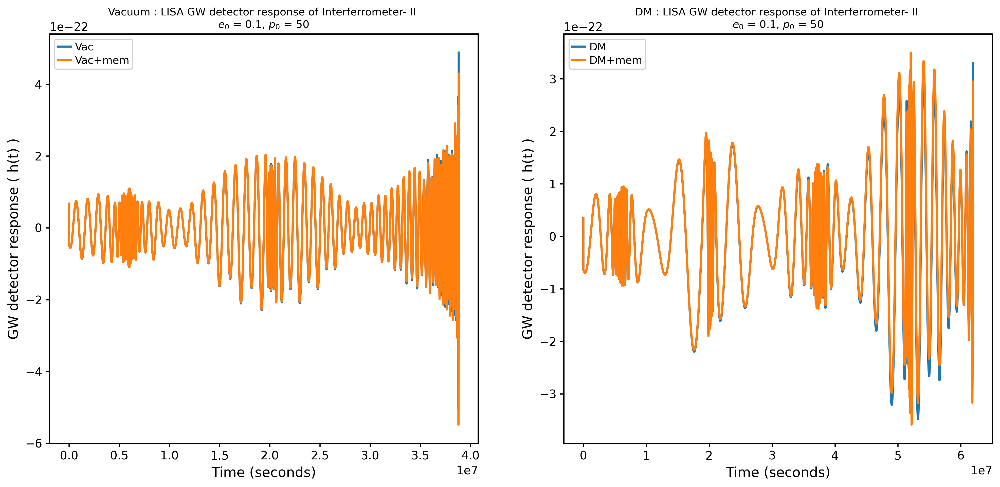

In [38]:
plt.figure(figsize=(16,7))
plt.subplot(121)
plt.plot(ygw[3]*t_factor, ht2_lisa_response_gw_without_memory, label='Vac')
plt.plot(ygw[3]*t_factor, ht2_lisa_response_gw_with_memory, label='Vac+mem')
plt.xlabel('Time (seconds)')
plt.ylabel('GW detector response ( h(t) )')
plt.title('Vacuum : LISA GW detector response of Interferrometer- II \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =10)
plt.legend(loc='upper left')

plt.subplot(122)
plt.plot(y_net[3]*t_factor, ht2_lisa_response_NET_without_memory, label='DM')
plt.plot(y_net[3]*t_factor, ht2_lisa_response_NET_with_memory, label='DM+mem')
plt.xlabel('Time (seconds)')
plt.ylabel('GW detector response ( h(t) )')
plt.title('DM : LISA GW detector response of Interferrometer- II \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =10)
plt.legend(loc='upper left')
plt.show()

#### Plotting GW nonlinear memory polarizations

In [39]:
# Vacuum : GW Memory polarizations 
hplus_gw_memory, hcross_gw_memory = quadrupolar_waveform_gw.GW_memory_polarization()

# DM : GW Memory polarizations 
hplus_NET_memory, hcross_NET_memory = quadrupolar_waveform_NET.GW_memory_polarization()

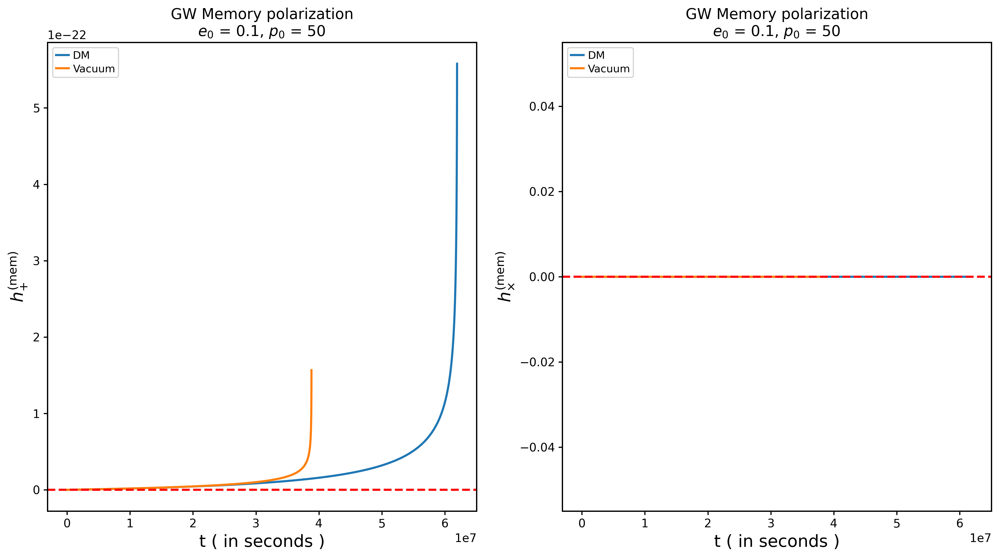

In [40]:
# Plotting
plt.figure(figsize=(16,8))

plt.subplot(121)
plt.plot( y_net[3,:]*t_factor, hplus_NET_memory, label='DM' )
plt.plot( ygw[3,:]*t_factor, hplus_gw_memory, label='Vacuum' )
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{+}^{\text{(mem)}} $', fontsize =16)
plt.title('GW Memory polarization\n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.subplot(122)
plt.plot( y_net[3,:]*t_factor, hcross_NET_memory, label='DM' )
plt.plot( ygw[3,:]*t_factor, hcross_gw_memory, label='Vacuum' )
# Add a horizontal line at y=0
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('t ( in seconds )', fontsize =16)
plt.ylabel(r'$ h_{\times}^{\text{(mem)}} $', fontsize =16)
plt.title('GW Memory polarization\n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =14)
plt.legend(fontsize=10, loc='upper left')

plt.show()

In [41]:
# Vacuum : LISA GW Detector Memory response of Interferrometer-I and II in time
ht1_lisa_response_gw_memory, ht2_lisa_response_gw_memory = quadrupolar_waveform_gw.lisa_detector_memory_response()
# DM : LISA GW Detector Memory response of Interferrometer-I and II in time
ht1_lisa_response_NET_memory, ht2_lisa_response_NET_memory = quadrupolar_waveform_NET.lisa_detector_memory_response()

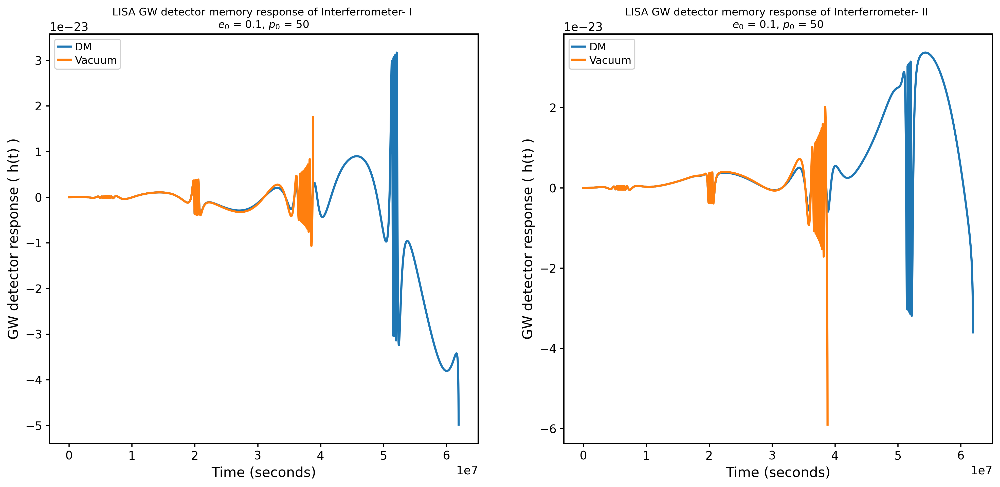

In [42]:
plt.figure(figsize=(16,7))
plt.subplot(121)
plt.plot(y_net[3]*t_factor, ht1_lisa_response_NET_memory, label='DM')
plt.plot(ygw[3]*t_factor, ht1_lisa_response_gw_memory, label='Vacuum')
plt.xlabel('Time (seconds)')
plt.ylabel('GW detector response ( h(t) )')
plt.title('LISA GW detector memory response of Interferrometer- I \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =10)
plt.legend(loc='upper left')

plt.subplot(122)
plt.plot(y_net[3]*t_factor, ht2_lisa_response_NET_memory, label='DM')
plt.plot(ygw[3]*t_factor, ht2_lisa_response_gw_memory, label='Vacuum')
plt.xlabel('Time (seconds)')
plt.ylabel('GW detector response ( h(t) )')
plt.title('LISA GW detector memory response of Interferrometer- II \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ', fontsize =10)
plt.legend(loc='upper left')
plt.show()

## Stationary Phase Approximation : For small eccentricity

In [43]:
import scipy
from scipy.interpolate import interp1d

# Computing Signal and Fourier frequency using Stationary Phase Approximation (SPA) to calculate overlap
def SPA_treatment(y, f, hp, hc, combination, alpha):
    e, p, omega, t = y
    # Orbital phase = true anomaly (f)
    phi_orb = f + omega
    # Fourier frequency
    if combination == 0:
        dedf, dpdf, domegadf, dtdf = osculating_eqn_gw_brxn(f, y, combination, alpha)
        fourier_frequency = ( (1/dtdf) + (domegadf/dtdf) )*(1/(2*np.pi))
    else:
        fourier_frequency = []
        for i in range(len(f)):
            dedf, dpdf, domegadf, dtdf = np.add.reduce([osculating_eqn_gw_brxn(f[i],y[:,i],combination,alpha),
                                                   osculating_eqn_DF(f[i], y[:,i], alpha, combination),
                                                   osculating_eqn_accretion(f[i], y[:,i], alpha, combination),
                                                   osculating_eqn_DM_gravity(f[i], y[:,i], alpha)])
            fourier_frequency.append(( (1/dtdf) + (domegadf/dtdf) )*(1/(2*np.pi)))
            
    fourier_frequency = np.array(fourier_frequency).reshape(t.shape)
    
    A1 =  hp * np.exp(2*1j*phi_orb)
    A2 = -hc * np.exp(2*1j*phi_orb)
    
    plus_FD_wave =  A1*np.exp(1j*(2*np.pi*fourier_frequency*t - phi_orb - np.pi/4))
    cross_FD_wave = A2*np.exp(1j*(2*np.pi*fourier_frequency*t - phi_orb - np.pi/4))
    
    signal = plus_FD_wave - 1j * cross_FD_wave

    # Interpolation Scheme
    dt = np.mean(np.diff(t))
    time  = np.arange(t[0], t[-1], dt)
    signal_ = interp1d(t, signal, kind='cubic', bounds_error=False)
    fourier_frequency_ = interp1d(t, fourier_frequency, kind='cubic', bounds_error=False)
    # To avoid Extrapolation outside the valid domain because np.arange accumulates floating error
    mask = (time >= t[0]) & (time <= t[-1])
    time_series = time[mask]
    final_signal = signal_(time_series)
    final_fourier_frequency = fourier_frequency_(time_series)
    
    return final_signal, final_fourier_frequency/t_factor, time_series*t_factor

In [44]:
signal1, fourier_frequency1, time_series1 =  SPA_treatment(ygw, fgw, hplus_gw_without_memory, hcross_gw_without_memory, combination=0, alpha=0)
signal2, fourier_frequency2, time_series2 =  SPA_treatment(ygw, fgw, hplus_gw_with_memory, hcross_gw_with_memory, combination=0, alpha=0)
signal3, fourier_frequency3, time_series3 =  SPA_treatment(y_net, f_net, hplus_NET_without_memory, hcross_NET_without_memory, combination=3, alpha=2.25)
signal4, fourier_frequency4, time_series4 =  SPA_treatment(y_net, f_net, hplus_NET_with_memory, hcross_NET_with_memory, combination=3, alpha=2.25)

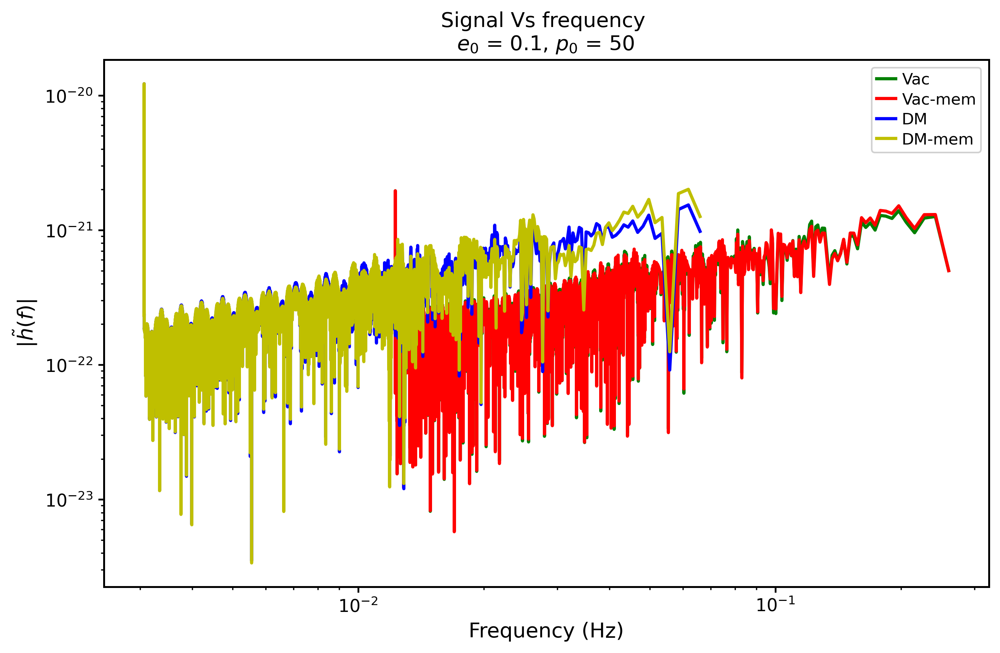

In [45]:
plt.figure(figsize=(10,6))
plt.plot(fourier_frequency1, np.abs(signal1), label='Vac', color='g')
plt.plot(fourier_frequency2, np.abs(signal2), label='Vac-mem', color='r')
plt.plot(fourier_frequency3, np.abs(signal3), label='DM', color='b')
plt.plot(fourier_frequency4, np.abs(signal4), label='DM-mem', color='y')
plt.xlabel('Frequency (Hz)')
plt.ylabel(r'$| \tilde{h} (f)|$')
plt.title('Signal Vs frequency \n'+ rf'$e_0$ = {e_i}, $p_0$ = {p_i} ')
plt.legend()
plt.xscale('log')
plt.yscale('log')
plt.show()

## Mismatch 

## $\boxed{\mathcal{M} = 1 - \mathcal{O} (h_1, h_2)}$

where

### $ \mathcal{O} (h_1, h_2) = \frac{(h_1, h_2)}{\sqrt{(h_1, h_1) (h_2, h_2)}}$

### $ (h_1, h_2) =  4 \mathcal{R} \text{e} \int_{f_{\text{initial}}}^{f_{\text{final}}} \frac{\tilde{h}_1(f) \tilde{h}_2^{*}(f)  }{S_n (f)} \, df $

#### LISA Noise model

Total LISA noise PSD is given as ([arXiv](https://arxiv.org/pdf/1105.3567)) :

$ \boxed{S_h (f(t)) = \text{min} \big[ \frac{S_h^{\text{inst}} (f)}{\text{exp}(-\kappa T^{-1}_{\text{mission}} dN/df)} + S_h^{\text{exgal}} (f), S_h^{\text{inst}} (f) + S_h^{\text{gal}} (f) + S_h^{\text{exgal}} (f) \big] }  $

$ S_h^{\text{inst}} (f) = 9.18 \times 10^{-52} f^{-4} + 1.59 \times 10^{-42} + 9.18 \times 10^{-38} f^2 \text{Hz}^{-1} $

$ S_h^{\text{gal}} (f) = 2.1 \times 10^{-45} \big( \frac{f}{1Hz} \big)^{-7/3} \text{Hz}^{-1} $

$ S_h^{\text{exgal}} (f) = 4.2 \times 10^{-47} \big( \frac{f}{1Hz}  \big)^{-7/3} \text{Hz}^{-1} $

where,

$ \frac{dN}{df} = $ No. density of galactic white dwarf binaries per unit GW frequency.

$ \kappa = $ Average no. of frequency bins that are lost when each galactic binary if fitted out.

We have taken

$ \frac{dN}{df} = 2 \times 10^{-3} \big( \frac{1 \text{Hz}}{f} \big)^{11/3} $

$ \kappa T^{-1}_{\text{mission}} = 1.5 / \text{yr}$

#### GWSat Noise model

Total GWSat noise PSD is given as (arXiv: ) :

$ \boxed{ S_h (f(t)) = ( 10^{-25} f^{-2} + 10^{-23} + 10^{-24} f^{-1} )^2 \, \text{Hz}^{-1}    } $

In [46]:
# Noise spectral density of LISA
def LISA_noise_psd(frq):
    Sh_inst = 9.18e-52 * frq**(-4) + 1.59e-41 + 9.18e-38 * (frq**2)
    Sh_gal = 2.1e-45 * (frq**(-7/3))
    Sh_exgal = 4.2e-47 * (frq**(-7/3))
    mission = 1.5/(3600*24*365) # taken 1.5 per year
    dNdf = 2e-3 * (frq**(-11/3))
    
    deno = np.exp(-mission*dNdf)
    # Get the smallest positive number that can be differentiated from zero
    epsilon = 1e-16
    if np.any(deno==0):
        deno[ deno == 0 ] = epsilon
    
    return np.minimum(( Sh_inst/deno ) + Sh_exgal, Sh_inst + Sh_gal + Sh_exgal)

# Noise spectral density of GWSat
def GWSat_noise_psd(frq):
    return ( 1e-25 * frq**(-2) + 1e-23 + 1e-24 * frq**(-1))**2 

In [47]:
# Overlap between two signals in frequency domain
def overlap(h1, frq1, h2, frq2):
    frq_start = max(frq1[0], frq2[0])
    frq_end   = min(frq1[-1], frq2[-1])
    if frq_start >= frq_end:
        raise ValueError("No overlapping frequency interval")
    dfrq1 = np.mean(np.diff(frq1))
    dfrq2 = np.mean(np.diff(frq2))
    dfrq_common = min(dfrq1, dfrq2)
    # Common frequency interval
    frq_common = np.arange(frq_start, frq_end, dfrq_common)
    
    # Interpolation
    H1 = interp1d(frq1, h1, kind='cubic', bounds_error=False)
    H2 = interp1d(frq2, h2, kind='cubic', bounds_error=False)

    # To avoid Extrapolation outside the valid domain because np.arange accumulates floating error
    mask = (frq_common >= frq_start) & (frq_common <= frq_end)
    H1_common = H1(frq_common[mask])
    H2_common = H2(frq_common[mask])

    Snf_lisa = LISA_noise_psd(frq_common[mask])
    overlap_integration = 4*np.real(simpson((H1_common.conjugate()*H2_common)/Snf_lisa, frq_common[mask]))
    # print(f'overlap_integration = {overlap_integration }')
    n1 = 4*np.real(simpson((H1_common.conjugate()*H1_common)/Snf_lisa, frq_common[mask]))
    n2 = 4*np.real(simpson((H2_common.conjugate()*H2_common)/Snf_lisa, frq_common[mask]))
    normalized_factor = np.sqrt(n1*n2)
    return overlap_integration/normalized_factor

In [48]:
def mismatch_wrt_time(h1, t1, frq1, h2, t2, frq2):
    one_year = 365*24*3600  # 1-year in seconds
    if t1[-1] < one_year or t2[-1] < one_year:
        raise ValueError('One of the input signal has less time evolution than 1-year')

    idx1 = np.where(t1 >= (t1[-1] - one_year))[0][0]
    t1_last_one_year = t1[idx1:]
    frq1_last_one_year = frq1[idx1:]
    h1_last_one_year = h1[idx1:]

    idx2 = np.where(t2 >= (t2[-1] - one_year))[0][0]
    t2_last_one_year = t2[idx2:]
    frq2_last_one_year = frq2[idx2:]
    h2_last_one_year = h2[idx2:]
        
    one_month = 30*24*3600  # 1-month in seconds

    mismatch = []
    time = []

    # Calculating Mismatch wrt time month by month for the last 1-year of orbital evolution
    for i in range(12):
        # 1st Signal
        index_1 = np.where(t1_last_one_year >= (t1_last_one_year[-1] - (11-i)*one_month))[0][0]
        T1 = t1_last_one_year[:index_1]
        Frq1 = frq1_last_one_year[:index_1]
        H1 = h1_last_one_year[:index_1]

        # 2nd Signal
        index_2 = np.where(t2_last_one_year >= (t2_last_one_year[-1] - (11-i)*one_month))[0][0]
        T2 = t2_last_one_year[:index_2]
        Frq2 = frq2_last_one_year[:index_2]
        H2 = h2_last_one_year[:index_2]

        # Mismatch
        mismatch.append(1 - overlap(H1, Frq1, H2, Frq2))

        # Time in months
        time.append((i+1))

    return time, mismatch

In [49]:
time1, mismatch1 = mismatch_wrt_time(signal1, time_series1, fourier_frequency1, signal2, time_series2, fourier_frequency2)
time4, mismatch4 = mismatch_wrt_time(signal3, time_series3, fourier_frequency3, signal4, time_series4, fourier_frequency4)

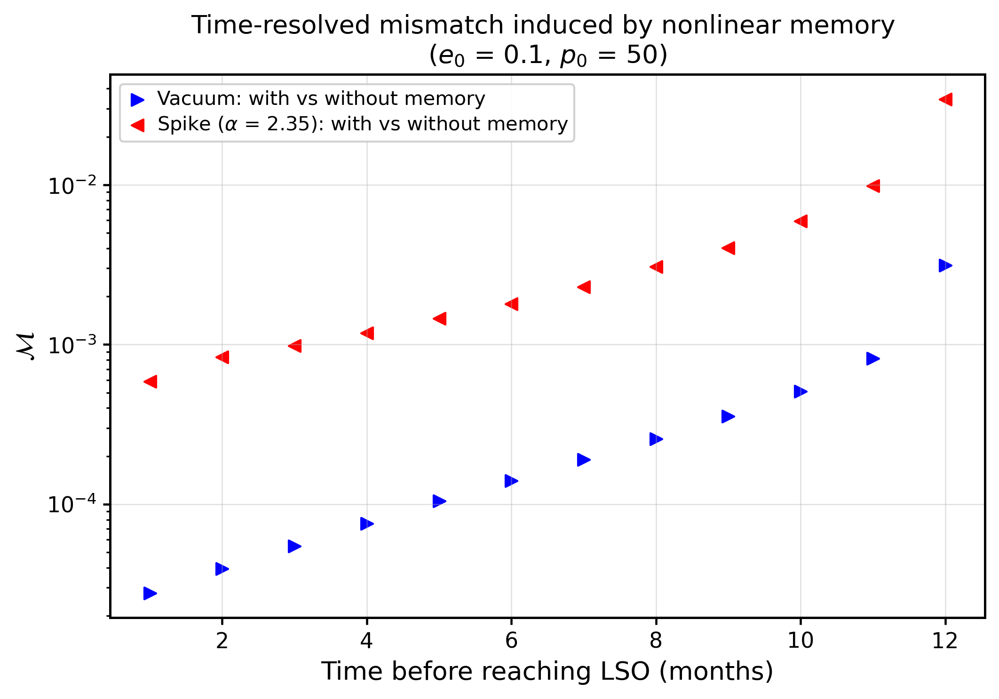

In [50]:
# Plotting Mismatch wrt time
plt.figure(figsize=(8,5))
plt.scatter(time1, mismatch1, marker='>', color='b', label='Vacuum: with vs without memory')
plt.scatter(time4, mismatch4, marker='<', color='r', label=rf'Spike ($\alpha$ = {alpha}): with vs without memory')
plt.xlabel('Time before reaching LSO (months)')
plt.ylabel(r'$\mathcal{M}$')
plt.title('Time-resolved mismatch induced by nonlinear memory \n'+ rf'($e_0$ = {e_i}, $p_0$ = {p_i})')
plt.legend()
plt.yscale('log')
plt.grid()

# Save as PDF
plt.savefig("elliptical_mismatch_plot_1.pdf", format="pdf", bbox_inches="tight") 

plt.show()

In [51]:
def mismatch_whole_signal_in_DM_with_and_Without_memory_for_diff_alpha(e_i, p_i, omega_i, t_i, f_final, alpha_list):
    mismatch_DM = []
    for i in range(len(alpha_list)):
        # NET Effect 
        f_net, y_net, h20_mem_net, h22P_mem_net, h22M_mem_net, h40_mem_net = nonlinear_memory.cal_hl0(F=FF(alpha_list[i]), combination=3)
        quadrupolar_waveform_net = quadrupolar_waveform(y_net, f_net, alpha_list[i], R, h20_mem_net, h22P_mem_net, h22M_mem_net, h40_mem_net)
        hplus_net_without_memory, hcross_net_without_memory = quadrupolar_waveform_net.GW_polarization(F=FF(alpha_list[i]), combination=3, memory=0)
        hplus_net_with_memory, hcross_net_with_memory = quadrupolar_waveform_net.GW_polarization(F=FF(alpha_list[i]), combination=3, memory=1)
        signal_net_without_memory, fourier_frequency_net_without_memory, time_series_net_without_memory =  SPA_treatment(y_net, f_net, hplus_net_without_memory, hcross_net_without_memory, combination=3, alpha=alpha_list[i])
        signal_net_with_memory, fourier_frequency_net_with_memory, time_series_net_with_memory =  SPA_treatment(y_net, f_net, hplus_net_with_memory, hcross_net_with_memory, combination=3, alpha=alpha_list[i])
        # Mismatch between signal in DM environment with and without memory
        mismatch_DM.append(1-overlap(signal_net_without_memory, fourier_frequency_net_without_memory,signal_net_with_memory, fourier_frequency_net_with_memory))
    return mismatch_DM

In [52]:
alpha_list = [2.25, 2.3, 2.35, 2.4, 2.45, 2.5]
mismatch_DM = mismatch_whole_signal_in_DM_with_and_Without_memory_for_diff_alpha(e_i, p_i, omega_i, t_i, f_final, alpha_list)

A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.


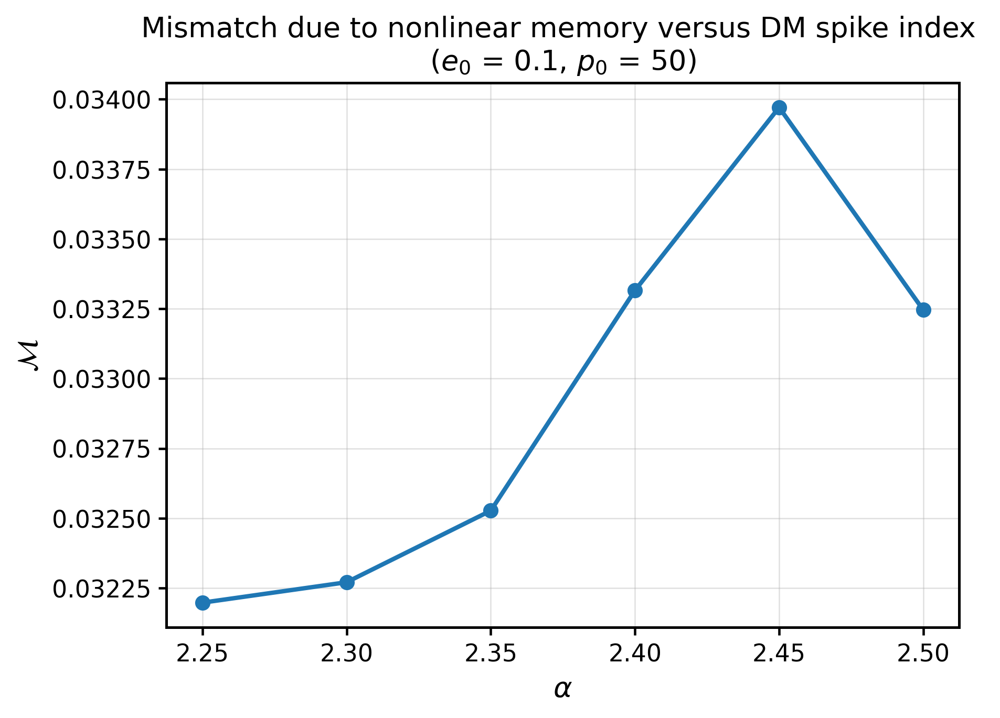

In [53]:
# Plotting
plt.figure()
plt.plot(alpha_list, mismatch_DM, '-o', label=rf'Spike ($\alpha$ = {alpha}): with vs without memory')
plt.xlabel(r'$\alpha$')
plt.ylabel(r'$\mathcal{M}$')
plt.title('Mismatch due to nonlinear memory versus DM spike index \n'+ rf'($e_0$ = {e_i}, $p_0$ = {p_i})')
plt.grid()

# Save as PDF
plt.savefig("elliptical_mismatch_plot_2.pdf", format="pdf", bbox_inches="tight") 

plt.show()

## Signal-to-noise ratio

#### SNR formula 

$ \boxed{\rho_{\text{signal}}  = \sqrt{ 2 \int_{t_{\text{init}}}^{t_{\text{LSO}}} \frac{h^2 (t)}{S_h (f(t))} dt  }}$

For qusicircular orbit or small eccentricity, we can write $ f_{GW}(t) = \frac{1}{\pi} \frac{d\phi}{dt} $


#### LISA SNR calculation

$ \boxed{\rho_{\text{signal}}^{\text{LISA}}  = \sqrt{ 2 \sum_{\alpha = I, II} \int_{t_{\text{init}}}^{t_{\text{LSO}}} \frac{h_{\alpha}^2 (t)}{S_{h}^{\text{LISA}} (f(t))} dt  }}$

where I and II are two different Interferrometer of LISA.

#### GWSat SNR calculation

$ \boxed{\rho_{\text{signal}}^{\text{GWSat}} = \sqrt{ 2 \int_{t_{\text{init}}}^{t_{\text{LSO}}} \frac{h^2 (t)}{S_{h}^{\text{GWSat}} (f(t))} dt  }}$

here $h(t) = h_{\text{I}} (t)$, i.e, LISA - I response is normal GW detector response.

#### Senstivity distance of detector to detect a GW binary source

$ \boxed{D = R \frac{\rho_{\text{signal}}}{ \rho_{\text{threshould}} }} $

where

$ R $ is distance between source and detector.

$ \rho_{\text{threshould}} = $ thresould value of SNR for given detector to detect the GW signal.

In [54]:
def SNR(y, f, ht1_response, ht2_response, combination, alpha):
    e, p, omega, t = y
    # Orbital phase = true anomaly (f)
    phi_orb = f + omega
    # Frequency
    if combination == 0:
        dedf, dpdf, domegadf, dtdf = osculating_eqn_gw_brxn(f, y, combination, alpha)
        frequency = ( (1/dtdf) + (domegadf/dtdf) )*(1/np.pi)
    else:
        frequency = []
        for i in range(len(f)):
            dedf, dpdf, domegadf, dtdf = np.add.reduce([osculating_eqn_gw_brxn(f[i],y[:,i],combination,alpha),
                                                   osculating_eqn_DF(f[i], y[:,i], alpha, combination),
                                                   osculating_eqn_accretion(f[i], y[:,i], alpha, combination),
                                                   osculating_eqn_DM_gravity(f[i], y[:,i], alpha)])
            frequency.append(( (1/dtdf) + (domegadf/dtdf) )*(1/np.pi))
            
    frequency = np.array(frequency).reshape(t.shape)

    dt = np.mean(np.diff(t))
    # Uniform time array
    time = np.arange(t[0], t[-1], dt)
    # Interpolation
    H1_ = interp1d(t, ht1_response, kind='cubic', bounds_error=False)
    H2_ = interp1d(t, ht2_response, kind='cubic', bounds_error=False)
    Freq_ = interp1d(t, frequency, kind='cubic', bounds_error=False)
    # To avoid Extrapolation outside the valid domain because np.arange accumulates floating error
    mask = (time >= t[0]) & (time <= t[-1])
    time_series = time[mask]
    Ht1_response = H1_(time_series)
    Ht2_response = H2_(time_series)
    Freq = Freq_(time_series)
    # LISA Noise PSD
    Snf_lisa = LISA_noise_psd(Freq)
    SNR_lisa = np.sqrt(2*simpson((Ht1_response**2 + Ht2_response**2)/Snf_lisa, time_series))
    # GWSat Noise PSD
    Snf_gwsat = GWSat_noise_psd(Freq)
    SNR_gwsat = np.sqrt(2*simpson((Ht1_response**2)/Snf_gwsat, time_series))
    
    return SNR_lisa, SNR_gwsat

#### For different $\alpha$ values

In [55]:
def SNR_for_diff_alphas(e_i, p_i, omega_i, t_i, f_final, alphas, R):
    # Calculating Nonlinear GW memory for given initial orbital parameters for GW backrxn only
    nonlinear_memory = calculate_nonlinear_memory(e_i, p_i, omega_i, t_i, f_final, 0.0, R)
    # Only GW backreaction ( FAVATA result )
    fgw, ygw, h20_mem_gw, h22P_mem_gw, h22M_mem_gw, h40_mem_gw = nonlinear_memory.cal_hl0(F=0, combination=0)
    # Vaccum 
    quadrupolar_waveform_gw = quadrupolar_waveform(ygw, fgw, 0, R, h20_mem_gw, h22P_mem_gw, h22M_mem_gw, h40_mem_gw)
    # GW Detector response in time
    ht1_response_gw_without_memory, ht2_response_gw_without_memory = quadrupolar_waveform_gw.lisa_detector_response(F=0, combination=0, memory=0)
    ht1_response_gw_with_memory, ht2_response_gw_with_memory = quadrupolar_waveform_gw.lisa_detector_response(F=0, combination=0, memory=1)

    # SNR for Vacuum signal
    SNR_lisa_for_Vac_without_memo, SNR_gwsat_for_Vac_without_memo = SNR(ygw, fgw, ht1_response_gw_without_memory, ht2_response_gw_without_memory, combination=0, alpha=0)
    # SNR for (Vacuum + memory) signal
    SNR_lisa_for_Vac_with_memo, SNR_gwsat_for_Vac_with_memo = SNR(ygw, fgw, ht1_response_gw_with_memory, ht2_response_gw_with_memory, combination=0, alpha=0)

    SNR_lisa_for_DM_without_memo = np.zeros((len(alphas),))
    SNR_lisa_for_DM_with_memo = np.zeros((len(alphas),))
    SNR_gwsat_for_DM_without_memo = np.zeros((len(alphas),))
    SNR_gwsat_for_DM_with_memo = np.zeros((len(alphas),))
    
    for i in range(len(alphas)):
        exponent = alphas[i]
        
        # Calculating Nonlinear GW memory for given initial orbital parameters
        nonlinear_memory = calculate_nonlinear_memory(e_i, p_i, omega_i, t_i, f_final, exponent, R)
        # NET : DM gravity + Relativistic DF + Accretion + GW brxn
        f_net, y_net, h20_mem_NET, h22P_mem_NET, h22M_mem_NET, h40_mem_NET = nonlinear_memory.cal_hl0(F=FF(exponent), combination=3)
        # DM : Quadrupolar waveform without memory and with DM ( NET effects )
        quadrupolar_waveform_NET = quadrupolar_waveform(y_net, f_net, exponent, R, h20_mem_NET, h22P_mem_NET, h22M_mem_NET, h40_mem_NET)
        # GW Detector response in time
        ht1_response_NET_without_memory, ht2_response_NET_without_memory = quadrupolar_waveform_NET.lisa_detector_response(F=FF(exponent), combination=3, memory=0)
        ht1_response_NET_with_memory, ht2_response_NET_with_memory = quadrupolar_waveform_NET.lisa_detector_response(F=FF(exponent), combination=3, memory=1)
 
        # SNR calculation
        SNR_lisa_for_DM_without_memo[i], SNR_gwsat_for_DM_without_memo[i] = SNR(y_net, f_net, ht1_response_NET_without_memory, 
                                                                                ht2_response_NET_without_memory, combination=3, 
                                                                                alpha=exponent)
        SNR_lisa_for_DM_with_memo[i], SNR_gwsat_for_DM_with_memo[i] = SNR(y_net, f_net, ht1_response_NET_with_memory, 
                                                                          ht2_response_NET_with_memory, combination=3, alpha=exponent)
        
    return SNR_lisa_for_Vac_without_memo, SNR_lisa_for_Vac_with_memo, SNR_lisa_for_DM_without_memo, SNR_lisa_for_DM_with_memo, SNR_gwsat_for_Vac_without_memo, SNR_gwsat_for_Vac_with_memo, SNR_gwsat_for_DM_without_memo, SNR_gwsat_for_DM_with_memo

In [56]:
new_e_i = 0.1 
new_p_i = 70
alphas = [2.25, 2.30, 2.35, 2.40, 2.45, 2.50]

In [57]:
SNR_lisa_for_Vac_without_memo, SNR_lisa_for_Vac_with_memo, SNR_lisa_for_DM_alpha_without_memo, SNR_lisa_for_DM_alpha_with_memo, SNR_gwsat_for_Vac_without_memo, SNR_gwsat_for_Vac_with_memo, SNR_gwsat_for_DM_alpha_without_memo, SNR_gwsat_for_DM_alpha_with_memo = SNR_for_diff_alphas(new_e_i, new_p_i, omega_i, t_i, f_final, alphas, R)

A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.


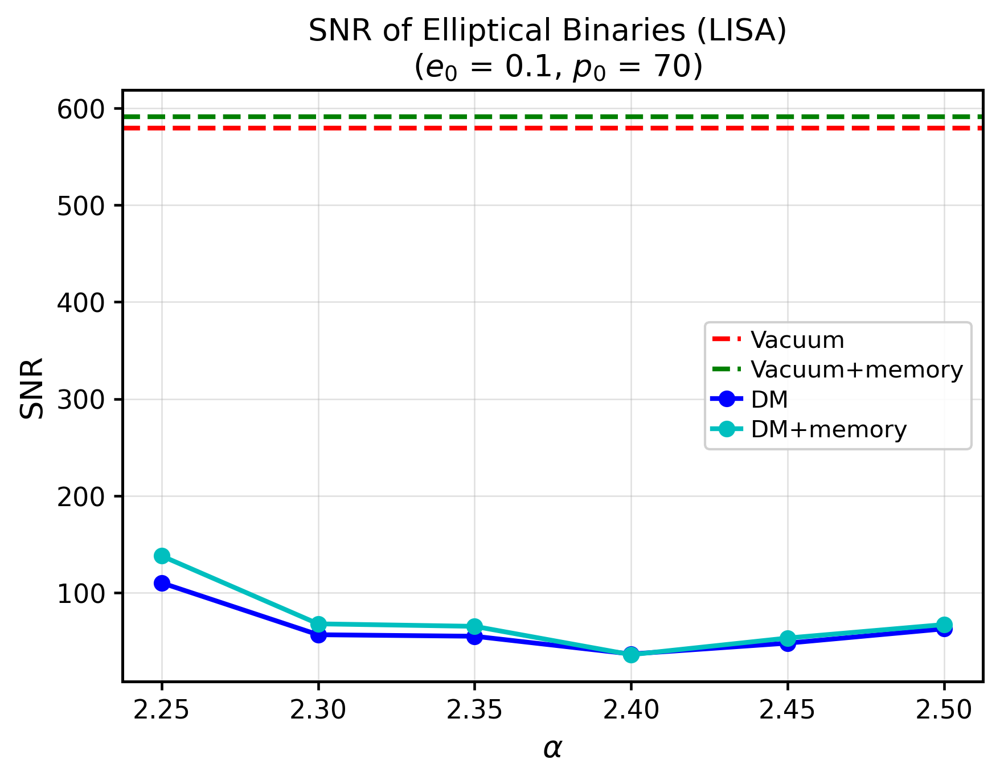

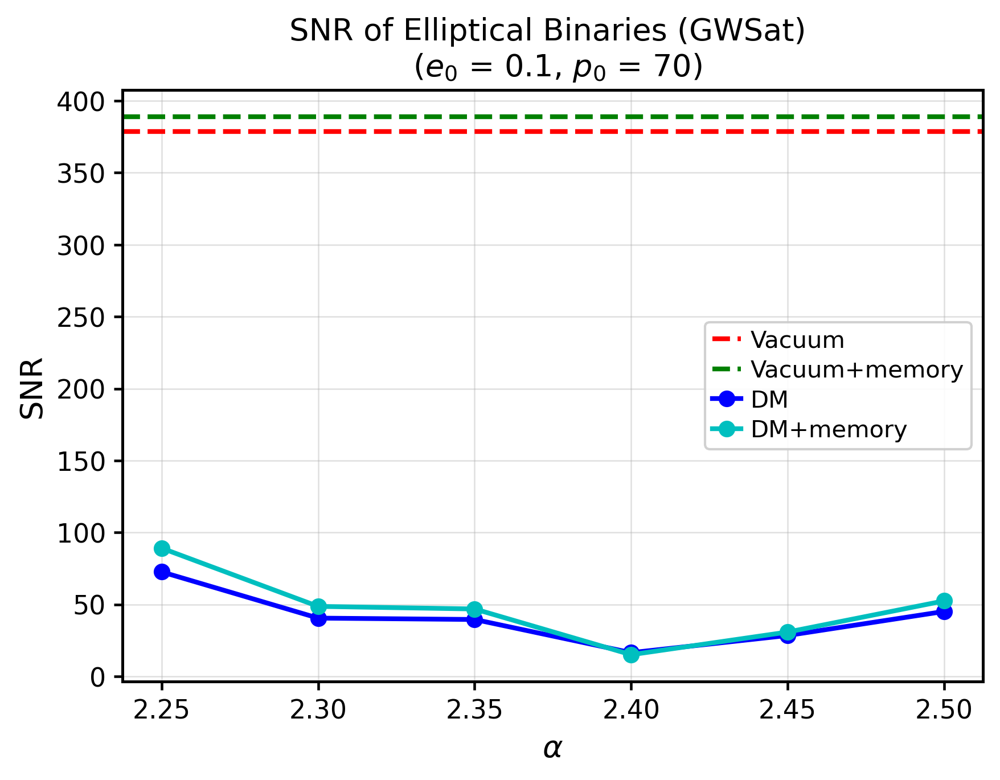

In [58]:
# Plot SNR for different alpha's
plt.figure()
plt.title('SNR of Elliptical Binaries (LISA) \n'+rf' ($e_0$ = {new_e_i}, $p_0$ = {new_p_i})')
plt.axhline(y=SNR_lisa_for_Vac_without_memo, linestyle='--', color='r', label="Vacuum")
plt.axhline(y=SNR_lisa_for_Vac_with_memo, linestyle='--', color='g', label="Vacuum+memory")
plt.plot(alphas, SNR_lisa_for_DM_alpha_without_memo, '-o', color='b', label="DM")
plt.plot(alphas, SNR_lisa_for_DM_alpha_with_memo, '-o', color='c', label="DM+memory")
plt.xlabel(r'$\alpha$')
plt.ylabel('SNR')
plt.legend()
plt.grid(True)

# Save as PDF
plt.savefig("elliptical_SNR_plot_1.pdf", format="pdf", bbox_inches="tight") 

plt.show()

plt.figure()
plt.title('SNR of Elliptical Binaries (GWSat) \n'+rf' ($e_0$ = {new_e_i}, $p_0$ = {new_p_i})')
plt.axhline(y=SNR_gwsat_for_Vac_without_memo, linestyle='--', color='r', label="Vacuum")
plt.axhline(y=SNR_gwsat_for_Vac_with_memo, linestyle='--', color='g', label="Vacuum+memory")
plt.plot(alphas, SNR_gwsat_for_DM_alpha_without_memo, '-o', color='b', label="DM")
plt.plot(alphas, SNR_gwsat_for_DM_alpha_with_memo, '-o', color='c', label="DM+memory")
plt.xlabel(r'$\alpha$')
plt.ylabel('SNR')
plt.legend()
plt.grid(True)

# Save as PDF
plt.savefig("elliptical_SNR_plot_2.pdf", format="pdf", bbox_inches="tight") 

plt.show()

#### For different $p_0$ values

In [59]:
def SNR_for_diff_p0_s(e_i, p0_s, omega_i, t_i, f_final, alpha, R):
    SNR_lisa_for_Vac_without_memo = np.zeros((len(p0_s),))  # For LISA
    SNR_lisa_for_Vac_with_memo = np.zeros((len(p0_s),))
    SNR_lisa_for_DM_without_memo = np.zeros((len(p0_s),))
    SNR_lisa_for_DM_with_memo = np.zeros((len(p0_s),))

    SNR_gwsat_for_Vac_without_memo = np.zeros((len(p0_s),))  # For GWSat
    SNR_gwsat_for_Vac_with_memo = np.zeros((len(p0_s),))
    SNR_gwsat_for_DM_without_memo = np.zeros((len(p0_s),))
    SNR_gwsat_for_DM_with_memo = np.zeros((len(p0_s),))
    
    for i in range(len(p0_s)):
        p_i = p0_s[i]

         # Calculating Nonlinear GW memory for given initial orbital parameters for GW backrxn only
        nonlinear_memory_gw = calculate_nonlinear_memory(e_i, p_i, omega_i, t_i, f_final, 0.0, R)
        # Only GW backreaction ( FAVATA result )
        fgw, ygw, h20_mem_gw, h22P_mem_gw, h22M_mem_gw, h40_mem_gw = nonlinear_memory_gw.cal_hl0(F=0, combination=0)
        # Vaccum 
        quadrupolar_waveform_gw = quadrupolar_waveform(ygw, fgw, 0, R, h20_mem_gw, h22P_mem_gw, h22M_mem_gw, h40_mem_gw)
        # GW Detector response in time
        ht1_response_gw_without_memory, ht2_response_gw_without_memory = quadrupolar_waveform_gw.lisa_detector_response(F=0, combination=0, memory=0)
        ht1_response_gw_with_memory, ht2_response_gw_with_memory = quadrupolar_waveform_gw.lisa_detector_response(F=0, combination=0, memory=1)
    
        # SNR for Vacuum signal
        SNR_lisa_for_Vac_without_memo[i], SNR_gwsat_for_Vac_without_memo[i] = SNR(ygw, fgw, ht1_response_gw_without_memory, 
                                                                                  ht2_response_gw_without_memory, combination=0, alpha=0)
        # SNR for (Vacuum + memory) signal
        SNR_lisa_for_Vac_with_memo[i], SNR_gwsat_for_Vac_with_memo[i] = SNR(ygw, fgw, ht1_response_gw_with_memory, 
                                                                            ht2_response_gw_with_memory, combination=0, alpha=0)

        # Calculating Nonlinear GW memory for given initial orbital parameters
        nonlinear_memory_NET = calculate_nonlinear_memory(e_i, p_i, omega_i, t_i, f_final, alpha, R)
        # NET : DM gravity + Relativistic DF + Accretion + GW brxn
        f_net, y_net, h20_mem_NET, h22P_mem_NET, h22M_mem_NET, h40_mem_NET = nonlinear_memory_NET.cal_hl0(F=FF(alpha), combination=3)
        # DM : Quadrupolar waveform without memory and with DM ( NET effects )
        quadrupolar_waveform_NET = quadrupolar_waveform(y_net, f_net, alpha, R, h20_mem_NET, h22P_mem_NET, h22M_mem_NET, h40_mem_NET)
        # GW Detector response in time
        ht1_response_NET_without_memory, ht2_response_NET_without_memory = quadrupolar_waveform_NET.lisa_detector_response(F=FF(alpha), combination=3, memory=0)
        ht1_response_NET_with_memory, ht2_response_NET_with_memory = quadrupolar_waveform_NET.lisa_detector_response(F=FF(alpha), combination=3, memory=1)
 
        # SNR calculation
        SNR_lisa_for_DM_without_memo[i], SNR_gwsat_for_DM_without_memo[i] = SNR(y_net, f_net, ht1_response_NET_without_memory, 
                                                                                ht2_response_NET_without_memory, combination=3, 
                                                                                alpha=alpha)
        SNR_lisa_for_DM_with_memo[i], SNR_gwsat_for_DM_with_memo[i] = SNR(y_net, f_net, ht1_response_NET_with_memory, 
                                                                          ht2_response_NET_with_memory, combination=3, alpha=alpha)
        
    return SNR_lisa_for_Vac_without_memo, SNR_lisa_for_Vac_with_memo, SNR_lisa_for_DM_without_memo, SNR_lisa_for_DM_with_memo, SNR_gwsat_for_Vac_without_memo, SNR_gwsat_for_Vac_with_memo, SNR_gwsat_for_DM_without_memo, SNR_gwsat_for_DM_with_memo

In [60]:
p0_s = [70, 80, 90, 100]
SNR_lisa_for_Vac_p0_without_memo, SNR_lisa_for_Vac_p0_with_memo, SNR_lisa_for_DM_p0_without_memo, SNR_lisa_for_DM_p0_with_memo, SNR_gwsat_for_Vac_p0_without_memo, SNR_gwsat_for_Vac_p0_with_memo, SNR_gwsat_for_DM_p0_without_memo, SNR_gwsat_for_DM_p0_with_memo = SNR_for_diff_p0_s(new_e_i, p0_s, omega_i, t_i, f_final, alpha, R)

A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.


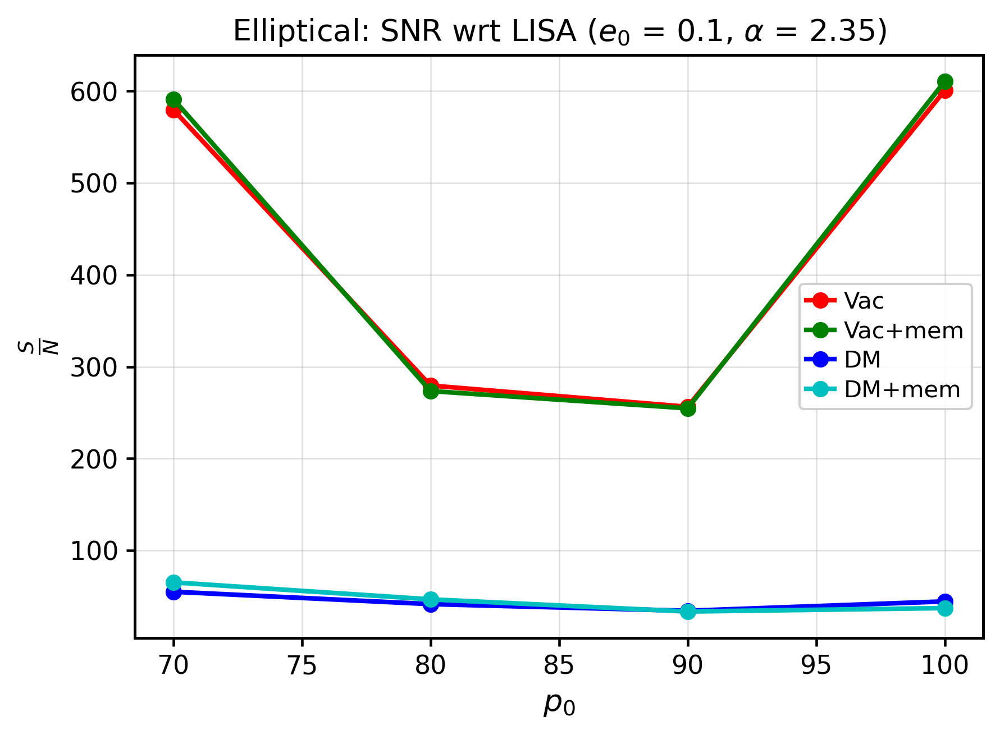

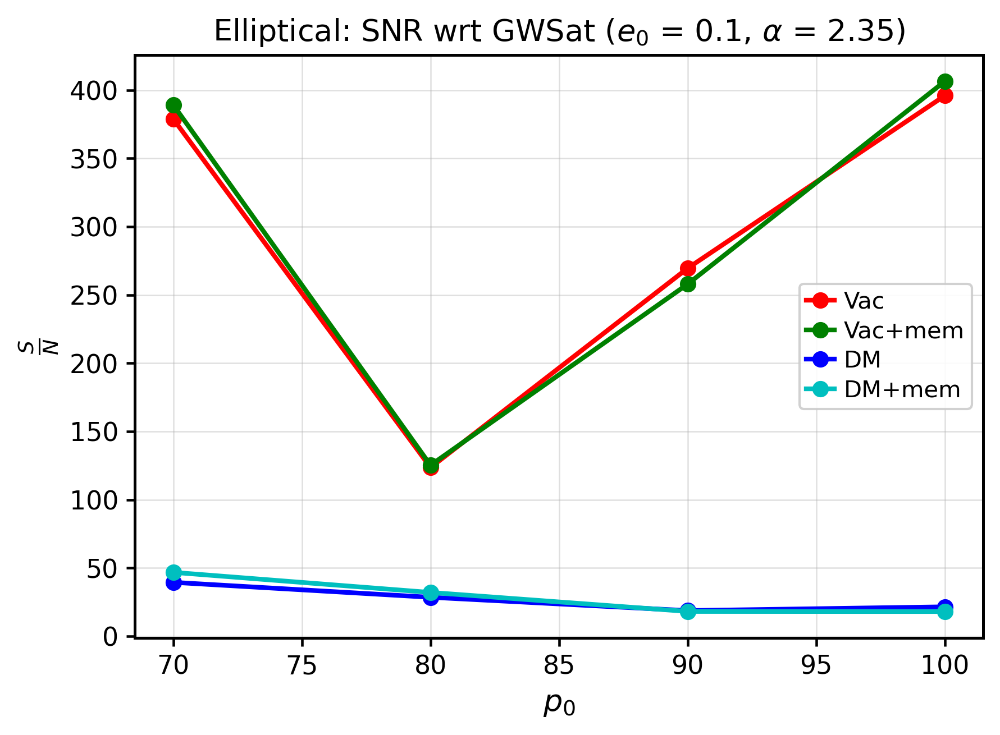

In [61]:
# Plot SNR for different p0's
plt.figure()
plt.title('Elliptical: SNR wrt LISA'+rf' ($e_0$ = {new_e_i}, $\alpha$ = {alpha})')
plt.plot(p0_s, SNR_lisa_for_Vac_p0_without_memo, '-o', color='r', label="Vac")
plt.plot(p0_s, SNR_lisa_for_Vac_p0_with_memo, '-o', color='g', label="Vac+mem")
plt.plot(p0_s, SNR_lisa_for_DM_p0_without_memo, '-o', color='b', label="DM")
plt.plot(p0_s, SNR_lisa_for_DM_p0_with_memo, '-o', color='c', label="DM+mem")
plt.xlabel(r'$p_0$')
plt.ylabel(r'$\frac{S}{N}$')
plt.legend()
plt.grid(True)
plt.show()

plt.figure()
plt.title('Elliptical: SNR wrt GWSat'+rf' ($e_0$ = {new_e_i}, $\alpha$ = {alpha})')
plt.plot(p0_s, SNR_gwsat_for_Vac_p0_without_memo, '-o', color='r', label="Vac")
plt.plot(p0_s, SNR_gwsat_for_Vac_p0_with_memo, '-o', color='g', label="Vac+mem")
plt.plot(p0_s, SNR_gwsat_for_DM_p0_without_memo, '-o', color='b', label="DM")
plt.plot(p0_s, SNR_gwsat_for_DM_p0_with_memo, '-o', color='c', label="DM+mem")
plt.xlabel(r'$p_0$')
plt.ylabel(r'$\frac{S}{N}$')
plt.legend()
plt.grid(True)
plt.show()

#### For different $e_0$ values

In [62]:
def SNR_for_diff_e0_s(e0_s, p_i, omega_i, t_i, f_final, alpha, R):
    SNR_lisa_for_Vac_without_memo = np.zeros((len(e0_s),))  # For LISA
    SNR_lisa_for_Vac_with_memo = np.zeros((len(e0_s),))
    SNR_lisa_for_DM_without_memo = np.zeros((len(e0_s),))
    SNR_lisa_for_DM_with_memo = np.zeros((len(e0_s),))

    SNR_gwsat_for_Vac_without_memo = np.zeros((len(e0_s),))  # For GWSat
    SNR_gwsat_for_Vac_with_memo = np.zeros((len(e0_s),))
    SNR_gwsat_for_DM_without_memo = np.zeros((len(e0_s),))
    SNR_gwsat_for_DM_with_memo = np.zeros((len(e0_s),))
    
    for i in range(len(e0_s)):
        e_i = e0_s[i]

         # Calculating Nonlinear GW memory for given initial orbital parameters for GW backrxn only
        nonlinear_memory_gw = calculate_nonlinear_memory(e_i, p_i, omega_i, t_i, f_final, 0.0, R)
        # Only GW backreaction ( FAVATA result )
        fgw, ygw, h20_mem_gw, h22P_mem_gw, h22M_mem_gw, h40_mem_gw = nonlinear_memory_gw.cal_hl0(F=0, combination=0)
        # Vaccum 
        quadrupolar_waveform_gw = quadrupolar_waveform(ygw, fgw, 0, R, h20_mem_gw, h22P_mem_gw, h22M_mem_gw, h40_mem_gw)
        # GW Detector response in time
        ht1_response_gw_without_memory, ht2_response_gw_without_memory = quadrupolar_waveform_gw.lisa_detector_response(F=0, combination=0, memory=0)
        ht1_response_gw_with_memory, ht2_response_gw_with_memory = quadrupolar_waveform_gw.lisa_detector_response(F=0, combination=0, memory=1)

        # SNR for Vacuum signal
        SNR_lisa_for_Vac_without_memo[i], SNR_gwsat_for_Vac_without_memo[i] = SNR(ygw, fgw, ht1_response_gw_without_memory, 
                                                                                  ht2_response_gw_without_memory, combination=0, alpha=0)
        # SNR for (Vacuum + memory) signal
        SNR_lisa_for_Vac_with_memo[i], SNR_gwsat_for_Vac_with_memo[i] = SNR(ygw, fgw, ht1_response_gw_with_memory, 
                                                                            ht2_response_gw_with_memory, combination=0, alpha=0)
    
        # Calculating Nonlinear GW memory for given initial orbital parameters
        nonlinear_memory_NET = calculate_nonlinear_memory(e_i, p_i, omega_i, t_i, f_final, alpha, R)
        # NET : DM gravity + Relativistic DF + Accretion + GW brxn
        f_net, y_net, h20_mem_NET, h22P_mem_NET, h22M_mem_NET, h40_mem_NET = nonlinear_memory_NET.cal_hl0(F=FF(alpha), combination=3)
        # DM : Quadrupolar waveform without memory and with DM ( NET effects )
        quadrupolar_waveform_NET = quadrupolar_waveform(y_net, f_net, alpha, R, h20_mem_NET, h22P_mem_NET, h22M_mem_NET, h40_mem_NET)
        # GW Detector response in time
        ht1_response_NET_without_memory, ht2_response_NET_without_memory = quadrupolar_waveform_NET.lisa_detector_response(F=FF(alpha), combination=3, memory=0)
        ht1_response_NET_with_memory, ht2_response_NET_with_memory = quadrupolar_waveform_NET.lisa_detector_response(F=FF(alpha), combination=3, memory=1)
 
        # SNR calculation
        SNR_lisa_for_DM_without_memo[i], SNR_gwsat_for_DM_without_memo[i] = SNR(y_net, f_net, ht1_response_NET_without_memory, 
                                                                                ht2_response_NET_without_memory, combination=3, 
                                                                                alpha=alpha)
        SNR_lisa_for_DM_with_memo[i], SNR_gwsat_for_DM_with_memo[i] = SNR(y_net, f_net, ht1_response_NET_with_memory, 
                                                                          ht2_response_NET_with_memory, combination=3, alpha=alpha)

    return SNR_lisa_for_Vac_without_memo, SNR_lisa_for_Vac_with_memo, SNR_lisa_for_DM_without_memo, SNR_lisa_for_DM_with_memo, SNR_gwsat_for_Vac_without_memo, SNR_gwsat_for_Vac_with_memo, SNR_gwsat_for_DM_without_memo, SNR_gwsat_for_DM_with_memo

In [63]:
e0_s = [0.1, 0.01, 0.001, 0.0001]
SNR_lisa_for_Vac_e0_without_memo, SNR_lisa_for_Vac_e0_with_memo, SNR_lisa_for_DM_e0_without_memo, SNR_lisa_for_DM_e0_with_memo, SNR_gwsat_for_Vac_e0_without_memo, SNR_gwsat_for_Vac_e0_with_memo, SNR_gwsat_for_DM_e0_without_memo, SNR_gwsat_for_DM_e0_with_memo = SNR_for_diff_e0_s(e0_s, new_p_i, omega_i, t_i, f_final, alpha, R)

A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.


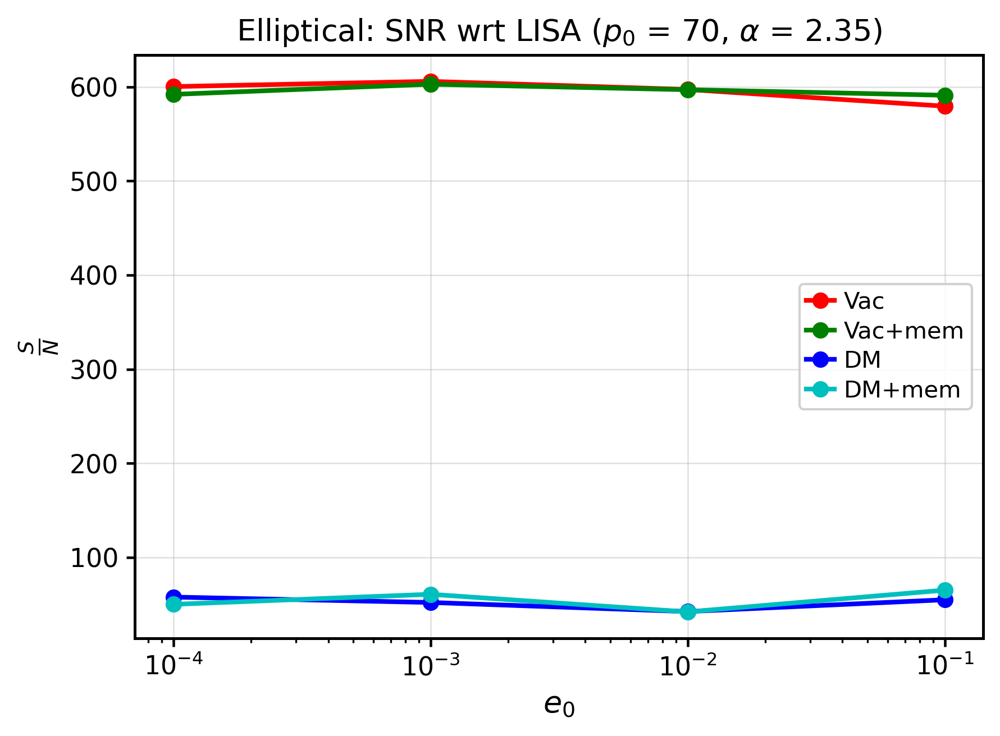

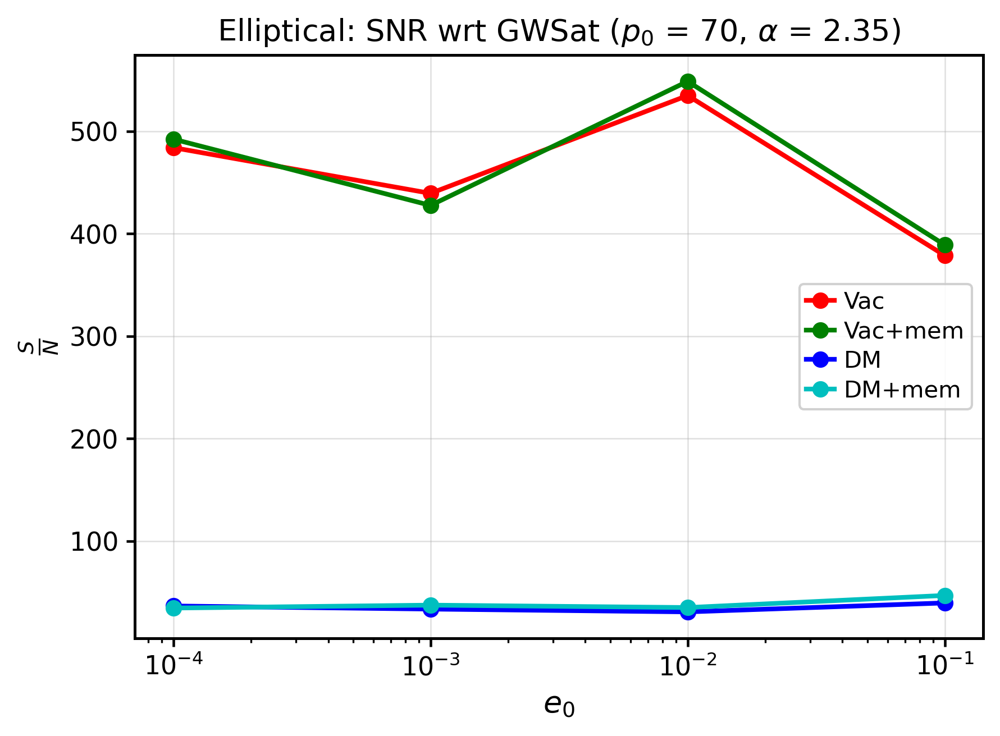

In [64]:
# Plot SNR for different e0's
plt.figure()
plt.title('Elliptical: SNR wrt LISA'+rf' ($p_0$ = {new_p_i}, $\alpha$ = {alpha})')
plt.plot(e0_s, SNR_lisa_for_Vac_e0_without_memo, '-o', color='r', label="Vac")
plt.plot(e0_s, SNR_lisa_for_Vac_e0_with_memo, '-o', color='g', label="Vac+mem")
plt.plot(e0_s, SNR_lisa_for_DM_e0_without_memo, '-o', color='b', label="DM")
plt.plot(e0_s, SNR_lisa_for_DM_e0_with_memo, '-o', color='c', label="DM+mem")
plt.xlabel(r'$e_0$')
plt.ylabel(r'$\frac{S}{N}$')
plt.legend()
plt.grid(True)
plt.xscale('log')
plt.show()

plt.figure()
plt.title('Elliptical: SNR wrt GWSat'+rf' ($p_0$ = {new_p_i}, $\alpha$ = {alpha})')
plt.plot(e0_s, SNR_gwsat_for_Vac_e0_without_memo, '-o', color='r', label="Vac")
plt.plot(e0_s, SNR_gwsat_for_Vac_e0_with_memo, '-o', color='g', label="Vac+mem")
plt.plot(e0_s, SNR_gwsat_for_DM_e0_without_memo, '-o', color='b', label="DM")
plt.plot(e0_s, SNR_gwsat_for_DM_e0_with_memo, '-o', color='c', label="DM+mem")
plt.xlabel(r'$e_0$')
plt.ylabel(r'$\frac{S}{N}$')
plt.legend()
plt.grid(True)
plt.xscale('log')
plt.show()

#### Computing SNR by just taking Memory signal (no quandrupolar waveform): To directly quantify effect of DM on nonlinear memory

In [65]:
def SNR_for_diff_alphas_just_mem_signal(e_i, p_i, omega_i, t_i, f_final, alphas, R):
    # Calculating Nonlinear GW memory for given initial orbital parameters for GW backrxn only
    nonlinear_memory = calculate_nonlinear_memory(e_i, p_i, omega_i, t_i, f_final, 0.0, R)
    # Only GW backreaction ( FAVATA result )
    fgw, ygw, h20_mem_gw, h22P_mem_gw, h22M_mem_gw, h40_mem_gw = nonlinear_memory.cal_hl0(F=0, combination=0)
    # Vaccum 
    quadrupolar_waveform_gw = quadrupolar_waveform(ygw, fgw, 0, R, h20_mem_gw, h22P_mem_gw, h22M_mem_gw, h40_mem_gw)
    # GW Detector response in time
    ht1_response_gw_memory, ht2_response_gw_memory = quadrupolar_waveform_gw.lisa_detector_memory_response()
    
    # SNR for Vacuum Memory signal
    SNR_lisa_for_Vac_memo, SNR_gwsat_for_Vac_memo = SNR(ygw, fgw, ht1_response_gw_memory, ht2_response_gw_memory, combination=0, alpha=0)
    
    SNR_lisa_for_DM_memo = np.zeros((len(alphas),))
    SNR_gwsat_for_DM_memo = np.zeros((len(alphas),))
    
    for i in range(len(alphas)):
        exponent = alphas[i]
        
        # Calculating Nonlinear GW memory for given initial orbital parameters
        nonlinear_memory = calculate_nonlinear_memory(e_i, p_i, omega_i, t_i, f_final, exponent, R)
        # NET : DM gravity + Relativistic DF + Accretion + GW brxn
        f_net, y_net, h20_mem_NET, h22P_mem_NET, h22M_mem_NET, h40_mem_NET = nonlinear_memory.cal_hl0(F=FF(exponent), combination=3)
        # DM : Quadrupolar waveform without memory and with DM ( NET effects )
        quadrupolar_waveform_NET = quadrupolar_waveform(y_net, f_net, exponent, R, h20_mem_NET, h22P_mem_NET, h22M_mem_NET, h40_mem_NET)
        # GW Detector response in time
        ht1_response_NET_memory, ht2_response_NET_memory = quadrupolar_waveform_NET.lisa_detector_memory_response()
       
        # SNR calculation
        SNR_lisa_for_DM_memo[i], SNR_gwsat_for_DM_memo[i] = SNR(y_net, f_net, ht1_response_NET_memory, 
                                                                ht2_response_NET_memory, combination=3, alpha=exponent)
    
    return SNR_lisa_for_Vac_memo, SNR_lisa_for_DM_memo, SNR_gwsat_for_Vac_memo, SNR_gwsat_for_DM_memo

In [66]:
new_e_i = 0.1 
new_p_i = 50
alphas = [2.25, 2.30, 2.35, 2.40, 2.45, 2.50]

SNR_lisa_for_Vac_memo, SNR_lisa_for_DM_memo, SNR_gwsat_for_Vac_memo, SNR_gwsat_for_DM_memo = SNR_for_diff_alphas_just_mem_signal(new_e_i, new_p_i, omega_i, 
                                                                                                                                 t_i, f_final, alphas, R)

A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.


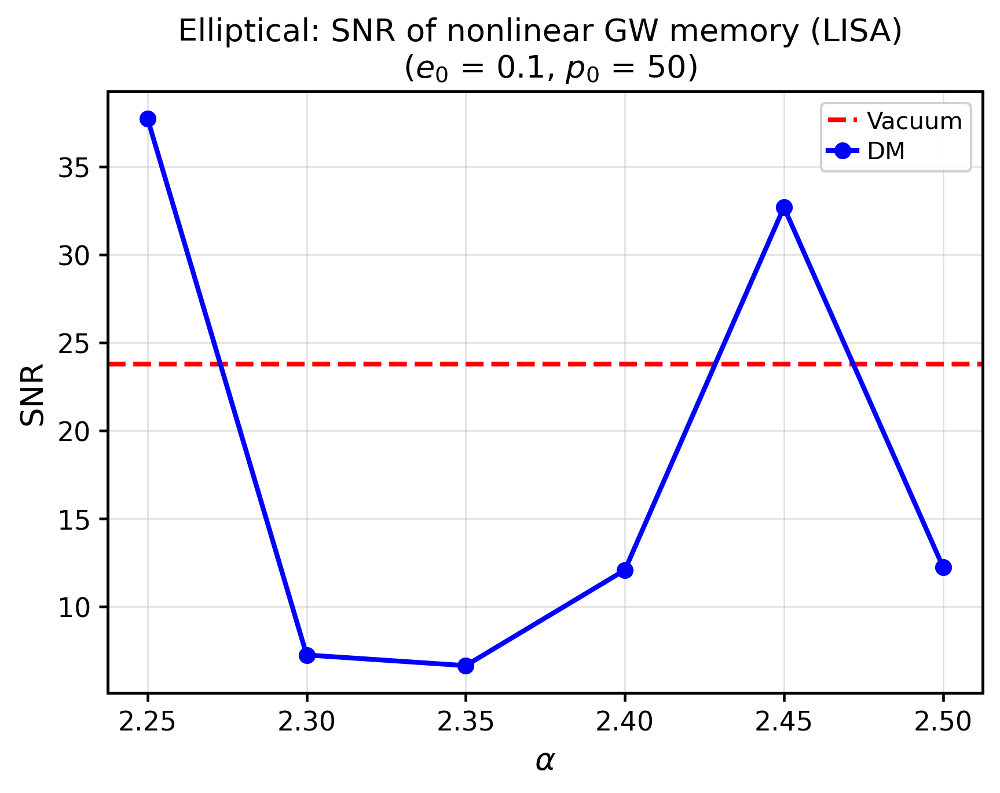

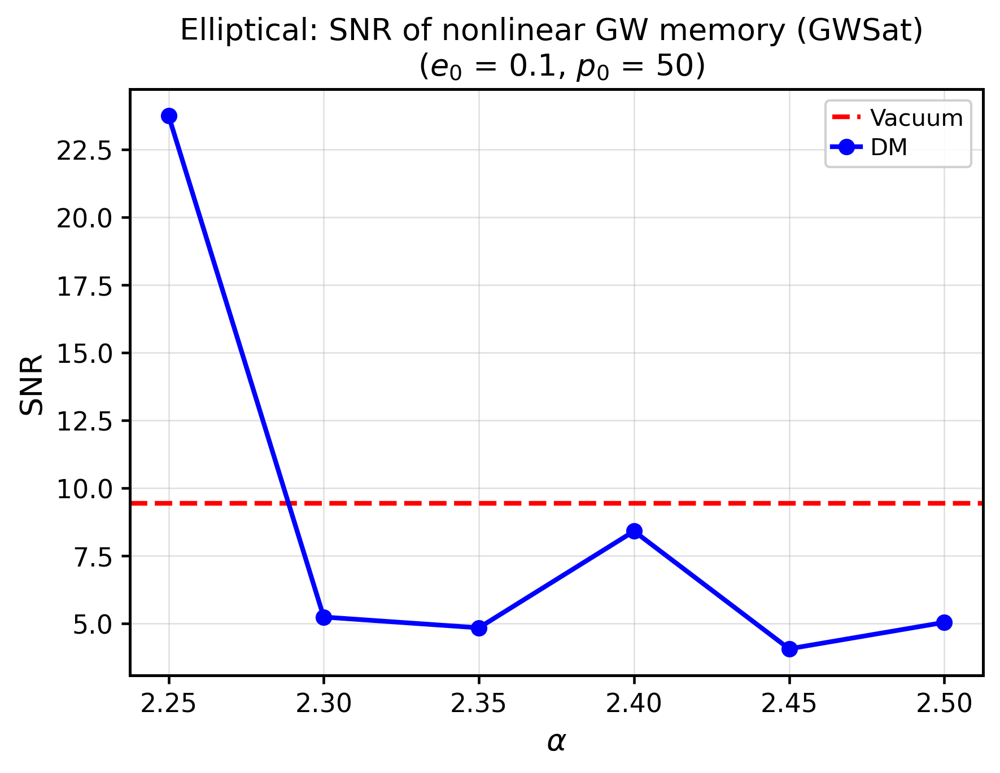

In [67]:
# Plot SNR for different alpha's
plt.figure()
plt.title('Elliptical: SNR of nonlinear GW memory (LISA) \n'+rf' ($e_0$ = {new_e_i}, $p_0$ = {new_p_i})')
plt.axhline(y=SNR_lisa_for_Vac_memo, linestyle='--', color='r', label="Vacuum")
plt.plot(alphas, SNR_lisa_for_DM_memo, '-o', color='b', label="DM")
plt.xlabel(r'$\alpha$')
plt.ylabel('SNR')
plt.legend()
plt.grid(True)

# Save as PDF
plt.savefig("elliptical_SNR_plot_3.pdf", format="pdf", bbox_inches="tight") 

plt.show()

plt.figure()
plt.title('Elliptical: SNR of nonlinear GW memory (GWSat) \n'+rf' ($e_0$ = {new_e_i}, $p_0$ = {new_p_i})')
plt.axhline(y=SNR_gwsat_for_Vac_memo, linestyle='--', color='r', label="Vacuum")
plt.plot(alphas, SNR_gwsat_for_DM_memo, '-o', color='b', label="DM")
plt.xlabel(r'$\alpha$')
plt.ylabel('SNR')
plt.legend()
plt.grid(True)

# Save as PDF
plt.savefig("elliptical_SNR_plot_4.pdf", format="pdf", bbox_inches="tight") 

plt.show()

## Saving results : To compare Nonlinear memory build-up due to DM spike with NFW and Vacuum

In [68]:
# Initial orbital parameters
e_i_ = 0.9
p_i_ = 100
omega_i_ = 0
t_i_ = 0 
f_final_ = 1e15
alpha_ = 2.25 
R_ = R

# Calculating Nonlinear GW memory for below initial orbital parameters
nonlinear_memory_ = calculate_nonlinear_memory(e_i_, p_i_, omega_i_, t_i_, f_final_, alpha_, R_)

# Only GW breaction ( FAVATA result )
fgw_, ygw_, h20_mem_gw_, h22P_mem_gw_, h22M_mem_gw_, h40_mem_gw_ = nonlinear_memory_.cal_hl0(F=0, combination=0)

print('h20_mem_gw = ',h20_mem_gw_[-1])
print('h22P_mem_gw = ',h22P_mem_gw_[-1])
print('h22M_mem_gw = ',h22M_mem_gw_[-1])
print('h40_mem_gw = ',h40_mem_gw_[-1])

# NET : DM gravity + Relativistic DF + Accretion + GW brxn
f_net_, y_net_, h20_mem_NET_, h22P_mem_NET_, h22M_mem_NET_, h40_mem_NET_ = nonlinear_memory_.cal_hl0(F=FF(alpha_), combination=3)

print('h20_mem_NET = ',h20_mem_NET_[-1])
print('h22P_mem_NET = ',h22P_mem_NET_[-1])
print('h22M_mem_NET = ',h22M_mem_NET_[-1])
print('h40_mem_NET = ',h40_mem_NET_[-1])

# FOR - Only GW backreaction ( FAVATA result ) : Save the array
np.save("ellip_fgw.npy", fgw_)
np.save("ellip_ygw.npy", ygw_)
np.save("ellip_h20_mem_gw.npy", h20_mem_gw_)
np.save("ellip_h40_mem_gw.npy", h40_mem_gw_)

# FOR - Spike NET effect : Save the array
np.save("ellip_spike_f_net.npy", f_net_)
np.save("ellip_spike_y_net.npy", y_net_)
np.save("ellip_spike_h20_mem_NET.npy", h20_mem_NET_)
np.save("ellip_spike_h40_mem_NET.npy", h40_mem_NET_)
%store alpha_

A termination event occurred.
h20_mem_gw =  4.798588656035165e-22
h22P_mem_gw =  (2.330990266597608e-24+2.2130250607641943e-30j)
h22M_mem_gw =  (2.330990266597608e-24-2.2130250607641943e-30j)
h40_mem_gw =  4.627580017521704e-24
A termination event occurred.
h20_mem_NET =  1.861340664502372e-21
h22P_mem_NET =  (2.6571302078506783e-23+1.6794417387641222e-28j)
h22M_mem_NET =  (2.6571302078506783e-23-1.6794417387641222e-28j)
h40_mem_NET =  1.802663447629888e-23
Stored 'alpha_' (float)


## Quasicircular binaries in Static DM environment 

In [69]:
# Averaged osculating equations considering only ( GW brxn ) for Quasi-circular orbit
def osculating_eqn_quasi_circ_gw_brxn(y):
    e, p, omega, t = y
    dedf = -(8/5)*eta*(((M)**(5/2))/((p**(5/2))))*( (304/24)*e + (121/24)*(e**3) )
    dpdf = -(8/5)*eta*(((M)**(5/2))/((p**(3/2))))*( 8 + 7*(e**2) ) 
    domegadf = 0.0
    dtdf = (1/np.sqrt(8*M))*(p**(3/2))*( 8 + 12 * e**2 + 15 * e**4 )
    return [dedf, dpdf, domegadf, dtdf]
        
# Averaged osculating equations considering only ( relativistic DF ) for Quasi-circular orbit
def osculating_eqn_quasi_circ_DF(y, alpha, I_v):
    e, p, omega, t = y
    dedf = (I_v*m2*np.pi*(r_sp/p)**alpha *rho_sp/(48*M**2))*( e*(-192*p**3 *(alpha-3) -192*M*p**2 *(alpha-1) + 192*M**2 * p*(alpha+1)
                                                                +192*M**3 *(alpha+3) ) +
                                                              e**3 *(-24*p**3 *(alpha-3)*(27-11*alpha+alpha**2)-24*M*p**2 *(alpha-1)*
                                                                    (11-7*alpha+alpha**2) + 24*M**2 * p*(alpha+1)*(3-3*alpha+alpha**2)
                                                                     + 24*M**3 * (alpha+3)*(3+alpha+alpha**2) ) )
    dpdf = (I_v*m2*np.pi*(r_sp/p)**alpha *rho_sp*p/(8*M**2))*( 64*(M**3 +M**2 *p-M*p**2-p**3)+e**2 *( -16*p**3 *(27-11*alpha+alpha**2)
                                                                                                      -16*M*p**2 *(11-7*alpha+alpha**2)
                                                                                                      +16*M**2 *p*(3-alpha+alpha**2)
                                                                                                      +16*M**3 *(3+alpha+alpha**2) ) + 
                                                                e**4 *( -p**3 *(1389+alpha*(-976+alpha*(245-26*alpha+alpha**2)))  
                                                                        -M*p**2 *(309+alpha*(-320+alpha*(117-18*alpha+alpha**2)))
                                                                        +M**2 *p*(45+alpha*(-64+alpha*(37-10*alpha+alpha**2))) 
                                                                        +M**3 * (21+alpha*(-16+alpha*(5-2*alpha+alpha**2)))  )  )    
    domegadf = 0.0
    dtdf = (1/np.sqrt(8*M))*(p**(3/2))*( 8 + 12 * e**2 + 15 * e**4 )
    return [dedf, dpdf, domegadf, dtdf]

class quasi_circ_orbit_evolution_static_DM():
    # Initial parameters
    def __init__(self, e_i, p_i, omega_i, t_i, f_final, alpha, I_v):
        self.e_i = e_i
        self.p_i = p_i
        self.omega_i = omega_i
        self.t_i = t_i
        self.f_final = f_final
        self.alpha = alpha
        self.I_v = I_v
        
    # Quasicircular orbit evolution
    def quasi_circ_orbit_evolution_DF_gw_brxn(self, combination):
        # Define the event function
        def stopping_condition(f, y):
            e, p, omega, t = y
            # Final value of semi-latus rectum ( at LSO )
            p_end = ( 6 + 2*self.e_i )*r_min/l0
            return p - p_end  # Integration stops when 'p' reaches Last Stable orbit

        # Make the event terminal and specify the direction
        stopping_condition.terminal = True    # ensures that the solver stops integration when the event is detected.
        stopping_condition.direction = 0      # allows the detection of zero crossings in any direction (i.e., both increasing and decreasing)
        
        # Initial conditions
        initial_conditions = [self.e_i, self.p_i, self.omega_i, self.t_i]

        f_span = (0,self.f_final)   # True anomaly 'f'
        
        if combination == 0:
            # Coupled osculating equations for ( GW brxn )
            def coupled_osculating_eqns(f, y):
                return osculating_eqn_quasi_circ_gw_brxn(y)

        if combination == 1:
            # STATIC DM minispike profile : Coupled osculating equations for ( DF + GW brxn )
            def coupled_osculating_eqns(f, y):
                return np.add(osculating_eqn_quasi_circ_gw_brxn(y), osculating_eqn_quasi_circ_DF(y, self.alpha, self.I_v))

        # Solve the system using solve_ivp
        solution = solve_ivp(coupled_osculating_eqns, f_span, initial_conditions, events=stopping_condition, method='RK45', 
                             atol=1e-12, rtol=1e-8, max_step=100*(np.pi) + 1e-2) 

        # print(solution.success)
        # print(solution.status)
        print(solution.message)
        
        return solution.t, solution.y

In [70]:
# Initial eccentricity for Quasi-circular case
quasi_e_i = 0.01
# Initial value of semi-latus rectum in ISCO units
quasi_p_i = 500 
# Initial value of omega in radians
quasi_omega_i = 0.0  
# Staring time
quasi_t_i = 0.0

# Final value of 'f' 
quasi_f_final = 1e15*(np.pi)

# Static DM spike exponent
alpha_static = 2.25

In [71]:
# For STATIC DM profile
sol_quasi_circ_static = quasi_circ_orbit_evolution_static_DM(quasi_e_i, quasi_p_i, quasi_omega_i, quasi_t_i, quasi_f_final, alpha_static, I_v)

# For GW brxn only
f_quasi_circ_gw, y_quasi_circ_gw = sol_quasi_circ_static.quasi_circ_orbit_evolution_DF_gw_brxn(combination=0)

# For DF + GW brxn 
f_quasi_circ_df_gw_static, y_quasi_circ_df_gw_static = sol_quasi_circ_static.quasi_circ_orbit_evolution_DF_gw_brxn(combination=1)

A termination event occurred.
A termination event occurred.


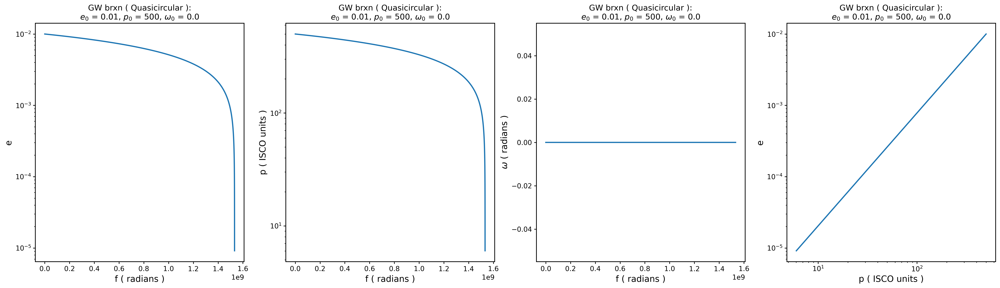

In [72]:
#----For GW BACKREACTION ( Quasicircular orbit )
plt.figure(figsize=(28,7))

plt.subplot(141)
plt.plot( f_quasi_circ_gw, y_quasi_circ_gw[0])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.yscale('log')
plt.title('GW brxn ( Quasicircular ):'+'\n'+ rf'$e_0$ = {quasi_e_i}, $p_0$ = {quasi_p_i}, $\omega_0$ = {quasi_omega_i}')

plt.subplot(142)
plt.plot( f_quasi_circ_gw, y_quasi_circ_gw[1])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('p ( ISCO units )', fontsize =14)
plt.yscale('log')
plt.title('GW brxn ( Quasicircular ):'+'\n'+ rf'$e_0$ = {quasi_e_i}, $p_0$ = {quasi_p_i}, $\omega_0$ = {quasi_omega_i}')

plt.subplot(143)
plt.plot( f_quasi_circ_gw, y_quasi_circ_gw[2])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel(r'$\omega$ ( radians )', fontsize =14)
plt.title('GW brxn ( Quasicircular ):'+'\n'+ rf'$e_0$ = {quasi_e_i}, $p_0$ = {quasi_p_i}, $\omega_0$ = {quasi_omega_i}')

#----'e' Vs 'p'
plt.subplot(144)
plt.plot( y_quasi_circ_gw[1], y_quasi_circ_gw[0])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('p ( ISCO units )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.title('GW brxn ( Quasicircular ):'+'\n'+ rf'$e_0$ = {quasi_e_i}, $p_0$ = {quasi_p_i}, $\omega_0$ = {quasi_omega_i}')

plt.show()

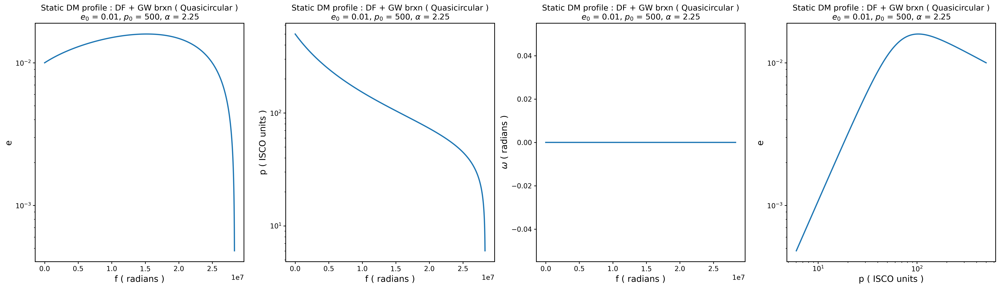

In [73]:
#----STATIC DM minispike profile : For ( relativistic DF + GW BACKREACTION ) ( Quasicircular orbit )
plt.figure(figsize=(28,7))

plt.subplot(141)
plt.plot( f_quasi_circ_df_gw_static, y_quasi_circ_df_gw_static[0])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.yscale('log')
plt.title('Static DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_0$ = {quasi_e_i}, $p_0$ = {quasi_p_i}, $\alpha$ = {alpha_static}')

plt.subplot(142)
plt.plot( f_quasi_circ_df_gw_static, y_quasi_circ_df_gw_static[1])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('p ( ISCO units )', fontsize =14)
plt.yscale('log')
plt.title('Static DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_0$ = {quasi_e_i}, $p_0$ = {quasi_p_i}, $\alpha$ = {alpha_static}')

plt.subplot(143)
plt.plot( f_quasi_circ_df_gw_static, y_quasi_circ_df_gw_static[2])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel(r'$\omega$ ( radians )', fontsize =14)
plt.title('Static DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_0$ = {quasi_e_i}, $p_0$ = {quasi_p_i}, $\alpha$ = {alpha_static}')

#----'e' Vs 'p'
plt.subplot(144)
plt.plot( y_quasi_circ_df_gw_static[1], y_quasi_circ_df_gw_static[0])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('p ( ISCO units )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.title('Static DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_0$ = {quasi_e_i}, $p_0$ = {quasi_p_i}, $\alpha$ = {alpha_static}')

plt.show()

## Quasicircular binaries in Dynamic DM environment ( Empirically )

<center>    
$ \rho_{DM} (r) = 
\begin{cases} 
\rho_{sp} \big( \frac{r_{sp}}{r} \big)^{\alpha} &  r = r_{init} \\
\rho_{sp} \big( \frac{r_{sp}}{r} \big)^{\alpha + \gamma (\kappa)} &  r >> r_b \\
\rho_{sp} \big( \frac{r_{sp}}{r} \big)^{\alpha} & r << r_b \\
\end{cases} $
</center>    

where $\alpha = 2.25 $ (taken)

<center>
$\gamma ( \kappa ) = (2.5-\alpha) \times e^{-( \kappa (r) - \kappa_{max} )^2}$
</center>


$(2.5-\alpha)$ factor is there to restrict DM minispike exponent in between $[2.25, 2.5]$. 

And

<center>
$\kappa ( r ) = \frac{ \kappa_f }{(r_{ISCO} - r_{init})} ( r - r_{init} )$
</center>

$$ $$

$\kappa_{max}$ correspond to $ r = r_b $ ( we approximate break distance as distance where $\big( \frac{de}{df} \big)_{GW} = \big( \frac{de}{df} \big)_{DF}$ )

Set $\boxed{\kappa_f = 10} $ such that $\gamma (\kappa_f)$ becomes very small (nearly zero) when binaries at small separations (LSO distance) thus $\rho_{DM} \propto r^{-\alpha}$ for $ r << r_b$.

#### NOTE : This analysis is only possible when there is competition of eccentricity growth by dynamical friction and eccentricity decay by GW backreaction, that will occur when binaries start from sufficiently large separations such that initially dynamical friction is dominant and later GW backreaction effect is dominant.

In [74]:
def imp_distance_pts(y, f):
    r = rel_distance(y, f)
    r_init = r[0]                             # Initial distance between binaries
    break_index = np.where(y[0,:]==np.max(y[0,:]))[0]  
    rb = r[break_index]                       # break distance where DF loss = GW loss, input from orbital evolution in static DM 
    return r_init, rb
    
def kappa(r, r_init, kf):
    r_isco = r_min/l0 # distances are in ISCO units
    return kf*(r-r_init)/(r_isco-r_init)

def gamma_kappa(y, f, r_init, rb, kf, alpha):
    r = rel_distance(y, f)             
    k = kappa(r, r_init, kf)
    k_max = kappa(rb, r_init, kf)
    return (2.5 - alpha)*np.exp(-(k-k_max)**2), k, k_max

def static_rho_dm_minispike(y, f, alpha): 
    r = rel_distance(y, f)
    return rho_sp*(r_sp/r)**alpha

def dynamic_rho_dm_minispike(y, f, alpha, r_init, rb, kf): 
    r = rel_distance(y, f)
    g_e, k, k_max = gamma_kappa(y, f, r_init, rb, kf, alpha)
    return rho_sp*(r_sp/r)**(alpha+g_e)

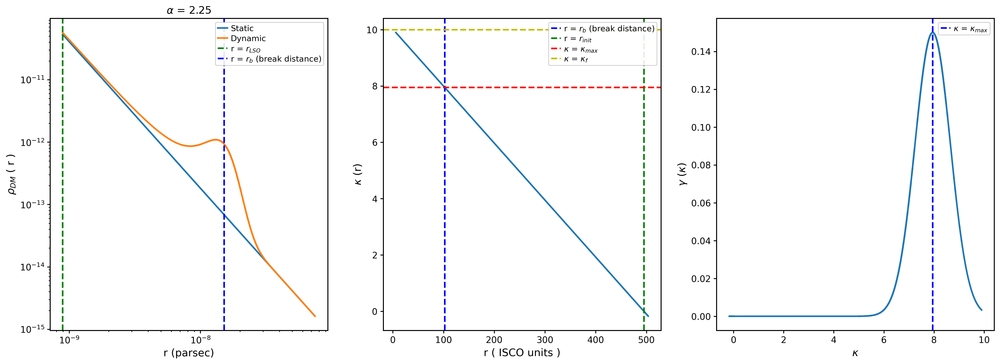

In [75]:
r = rel_distance(y_quasi_circ_df_gw_static, f_quasi_circ_df_gw_static)
r_init, rb = imp_distance_pts(y_quasi_circ_df_gw_static, f_quasi_circ_df_gw_static)
kf = 10.0              # some large value s.t gamma_e is approximately almost zero
gamma_k, k, k_max = gamma_kappa(y_quasi_circ_df_gw_static, f_quasi_circ_df_gw_static, r_init, rb, kf, alpha)

# Plotting Static VS Dynamic DM density profile
plt.figure(figsize=(21,7))

plt.subplot(131)
plt.title(rf'$\alpha$ = {alpha_static}')
plt.plot(r*l0/pc, static_rho_dm_minispike(y_quasi_circ_df_gw_static, f_quasi_circ_df_gw_static, alpha), label='Static')
plt.plot(r*l0/pc, dynamic_rho_dm_minispike(y_quasi_circ_df_gw_static, f_quasi_circ_df_gw_static, alpha, r_init, rb, kf), label='Dynamic')
plt.axvline(x=(6+2*quasi_e_i)*l0/pc, color='g', linestyle='--', label=r'r = $r_{LSO}$')
plt.axvline(x=rb*l0/pc, color='b', linestyle='--', label=r'r = $r_{b}$ (break distance)')
plt.xlabel('r (parsec)')
plt.ylabel(r'$\rho_{DM} $ ( r )')
plt.xscale('log')
plt.yscale('log')
plt.legend(loc="upper right")

plt.subplot(132)
plt.plot(r,k)
plt.xlabel('r ( ISCO units )')
plt.ylabel(r'$\kappa$ (r)')
plt.axvline(x=rb, color='b', linestyle='--', label=r'r = $r_{b}$ (break distance)')
plt.axvline(x=r_init, color='g', linestyle='--', label=r'r = $r_{init}$')
plt.axhline(y=k_max, color='r', linestyle='--', label=r'$\kappa$ = $\kappa_{max}$')
plt.axhline(y=kf, color='y', linestyle='--', label=r'$\kappa$ = $\kappa_{f}$')
plt.legend(loc="upper right")

plt.subplot(133)
plt.plot(k, gamma_k)
plt.ylabel(r'$\gamma$ ($\kappa$)')
plt.xlabel(r'$\kappa$')
plt.axvline(x=k_max, color='b', linestyle='--', label=r'$\kappa$ = $\kappa_{max}$')
plt.legend(loc="upper right")

plt.show()

In [76]:
class quasi_circ_orbit_evolution_dynamic_DM(quasi_circ_orbit_evolution_static_DM):
    # Initial parameters
    def __init__(self, e_i, p_i, omega_i, t_i, f_final, alpha, I_v, r_init, rb, kf):
        super().__init__(e_i, p_i, omega_i, t_i, f_final, alpha, I_v)
        self.r_init = r_init
        self.rb = rb
        self.kf = kf
        
    # Quasicircular orbit evolution
    def quasi_circ_orbit_evolution_DF_gw_brxn_dynamic_DM(self):
        # Define the event function
        def stopping_condition(f, y):
            e, p, omega, t = y
            # Final value of semi-latus rectum ( at LSO )
            p_end = ( 6 + 2*self.e_i )*r_min/l0
            return p - p_end  # Integration stops when 'p' reaches Last Stable orbit

        # Make the event terminal and specify the direction
        stopping_condition.terminal = True    # ensures that the solver stops integration when the event is detected.
        stopping_condition.direction = 0      # allows the detection of zero crossings in any direction (i.e., both increasing and decreasing)
        
        # Initial conditions
        initial_conditions = [self.e_i, self.p_i, self.omega_i, self.t_i]

        f_span = (0,self.f_final)   # True anomaly 'f'

        # DYNAMIC DM minispike profile : Coupled osculating equations for ( DF + GW brxn )
        def coupled_osculating_eqns(f, y):
            gamma_k, k, k_max = gamma_kappa(y, f, self.r_init, self.rb, self.kf, self.alpha)
            return np.add(osculating_eqn_quasi_circ_gw_brxn(y), osculating_eqn_quasi_circ_DF(y, (self.alpha + gamma_k).item(), self.I_v))

        # Solve the system using solve_ivp
        solution = solve_ivp(coupled_osculating_eqns, f_span, initial_conditions, events=stopping_condition, method='RK45', 
                            atol=1e-12, rtol=1e-8, max_step=100*(np.pi) + 1e-2) 

        # print(solution.success)
        # print(solution.status)
        print(solution.message)
        
        return solution.t, solution.y

In [77]:
# For DYNAMIC DM profile ( Empirical )
sol_quasi_circ_dynamic = quasi_circ_orbit_evolution_dynamic_DM(quasi_e_i, quasi_p_i, quasi_omega_i, quasi_t_i, quasi_f_final, alpha_static, I_v,
                                                               r_init, rb, kf)
# For DF + GW brxn 
f_quasi_circ_df_gw_dynamic, y_quasi_circ_df_gw_dynamic = sol_quasi_circ_dynamic.quasi_circ_orbit_evolution_DF_gw_brxn_dynamic_DM()

A termination event occurred.


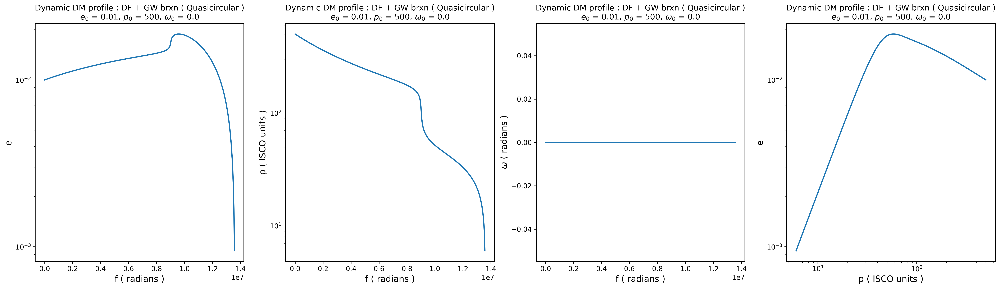

In [78]:
#----DYNAMIC DM minispike profile : For ( Relativistic DF + GW BACKREACTION ) ( Quasicircular orbit )
plt.figure(figsize=(28,7))

plt.subplot(141)
plt.plot( f_quasi_circ_df_gw_dynamic, y_quasi_circ_df_gw_dynamic[0])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.yscale('log')
plt.title('Dynamic DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_0$ = {quasi_e_i}, $p_0$ = {quasi_p_i}, $\omega_0$ = {quasi_omega_i}')
plt.subplot(142)
plt.plot( f_quasi_circ_df_gw_dynamic, y_quasi_circ_df_gw_dynamic[1])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel('p ( ISCO units )', fontsize =14)
plt.yscale('log')
plt.title('Dynamic DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_0$ = {quasi_e_i}, $p_0$ = {quasi_p_i}, $\omega_0$ = {quasi_omega_i}')
plt.subplot(143)
plt.plot( f_quasi_circ_df_gw_dynamic, y_quasi_circ_df_gw_dynamic[2])
plt.xlabel('f ( radians )', fontsize =14)
plt.ylabel(r'$\omega$ ( radians )', fontsize =14)
plt.title('Dynamic DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_0$ = {quasi_e_i}, $p_0$ = {quasi_p_i}, $\omega_0$ = {quasi_omega_i}')
#----'e' Vs 'p'
plt.subplot(144)
plt.plot( y_quasi_circ_df_gw_dynamic[1], y_quasi_circ_df_gw_dynamic[0])
plt.xscale('log')
plt.yscale('log')
plt.xlabel('p ( ISCO units )', fontsize =14)
plt.ylabel('e', fontsize =14)
plt.title('Dynamic DM profile : DF + GW brxn ( Quasicircular )'+'\n'+ rf'$e_0$ = {quasi_e_i}, $p_0$ = {quasi_p_i}, $\omega_0$ = {quasi_omega_i}')
plt.show()

## Quasicircular: Nonlinear GW memory

In [79]:
# Quasicircular orbit : Calculating hl0 (l = 2, 4) mode of Nonlinear memory
class quasi_circ_calculate_nonlinear_memory(quasi_circ_orbit_evolution_static_DM):
    # Initial parameters
    def __init__(self, e_i, p_i, omega_i, t_i, f_final, alpha, I_v, R, kf):
        super().__init__(e_i, p_i, omega_i, t_i, f_final, alpha, I_v)
        self.R = R
        self.kf = kf
        
    def quasi_circ_cal_hl0(self, combination): 
        sol_quasi_circ_static = quasi_circ_orbit_evolution_static_DM(self.e_i, self.p_i, self.omega_i, self.t_i, self.f_final, 
                                                                         self.alpha, self.I_v)

        if combination==0: # GW backrxn only 
            f, y = sol_quasi_circ_static.quasi_circ_orbit_evolution_DF_gw_brxn(0)
        if combination==1: # For STATIC DM profile : relativistic DF + GW brxn
            f, y = sol_quasi_circ_static.quasi_circ_orbit_evolution_DF_gw_brxn(1)
        if combination==11: # For DYNAMIC DM profile ( Empirical ) : relativistic DF + GW brxn
            # Since rb decides from orbital evoultion in static DM, so first we do orbital evolution in static DM (relativistic DF + GW brxn)
            f_quasi_circ_df_gw_static, y_quasi_circ_df_gw_static = sol_quasi_circ_static.quasi_circ_orbit_evolution_DF_gw_brxn(1)
            r_init, rb = imp_distance_pts(y_quasi_circ_df_gw_static, f_quasi_circ_df_gw_static)
            
            # For DYNAMIC DM profile ( Empirical ) : relativistic DF + GW brxn
            sol_quasi_circ_dynamic = quasi_circ_orbit_evolution_dynamic_DM(self.e_i, self.p_i, self.omega_i, self.t_i, self.f_final, 
                                                                           self.alpha, self.I_v, r_init, rb, self.kf)
            f, y = sol_quasi_circ_dynamic.quasi_circ_orbit_evolution_DF_gw_brxn_dynamic_DM()
            
        e, p, omega, t = y
        num = len(e)

        F = 0   # F=0 means DM gravity effect is OFF

        avg_dh20de_mem = []
        avg_dh22Pde_mem = []
        avg_dh22Mde_mem = []
        avg_dh40de_mem = []

        # Calculating h20_mem, h22P_mem, h22M_mem and h40_mem as function of eccentricity using Euler's method
        h20_mem = np.zeros((np.shape(e))) 
        h22P_mem = np.zeros(shape=np.shape(e), dtype=complex) 
        h22M_mem = np.zeros(shape=np.shape(e), dtype=complex) 
        h40_mem = np.zeros((np.shape(e)))

        for i in range(num):
            fdash = np.linspace(0,2*np.pi,1000) 
            
            g_e20, g_e22P, g_e22M, g_e40 = integrand_hlm(y[:,i], fdash, self.R, self.alpha, F, combination)
        
            if combination==0: # GW backrxn only 
                dedf, dpdf, domegadf, dtdf = osculating_eqn_quasi_circ_gw_brxn(y[:,i])
                avg_dh20de_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e20, fdash) * dtdf / dedf ) 
                avg_dh22Pde_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e22P, fdash) * dtdf / dedf )
                avg_dh22Mde_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e22M, fdash) * dtdf / dedf )
                avg_dh40de_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e40, fdash) * dtdf / dedf ) 
            if combination==1: # For STATIC DM profile : DF + GW brxn
                dedf, dpdf, domegadf, dtdf = np.add(osculating_eqn_quasi_circ_gw_brxn(y[:,i]), 
                                               osculating_eqn_quasi_circ_DF(y[:,i], self.alpha, self.I_v) )
                avg_dh20de_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e20, fdash) * dtdf / dedf ) 
                avg_dh22Pde_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e22P, fdash)* dtdf / dedf )
                avg_dh22Mde_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e22M, fdash) * dtdf / dedf )
                avg_dh40de_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e40, fdash) * dtdf / dedf ) 
            if combination==11: # For DYNAMIC DM profile : DF + GW brxn
                gamma_k, k, k_max = gamma_kappa(y[:,i], f[i], r_init, rb, self.kf, self.alpha)
                dedf, dpdf, domegadf, dtdf = np.add(osculating_eqn_quasi_circ_gw_brxn(y[:,i]), 
                                               osculating_eqn_quasi_circ_DF(y[:,i], (self.alpha + gamma_k).item(), self.I_v) )
                avg_dh20de_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e20, fdash) * dtdf / dedf ) 
                avg_dh22Pde_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e22P, fdash) * dtdf / dedf )
                avg_dh22Mde_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e22M, fdash) * dtdf / dedf )
                avg_dh40de_mem.append( ( ((1 - (e[i])**2 )**(3/2)) / (2*np.pi) ) * simpson(g_e40, fdash) * dtdf / dedf ) 

            if i<(num-1):
                # Euler method
                h20_mem[i+1] = h20_mem[i] + avg_dh20de_mem[i] * ( e[i+1] - e[i] ) 
                h22P_mem[i+1] = h22P_mem[i] + avg_dh22Pde_mem[i] * ( e[i+1] - e[i] ) 
                h22M_mem[i+1] = h22M_mem[i] + avg_dh22Mde_mem[i] * ( e[i+1] - e[i] ) 
                h40_mem[i+1] = h40_mem[i] + avg_dh40de_mem[i] * ( e[i+1] - e[i] ) 

        return f, y, h20_mem, h22P_mem, h22M_mem, h40_mem

In [80]:
# Quasicircular : Calculating Nonlinear GW memory for given initial orbital parameters
nonlinear_memory_quasi_circ = quasi_circ_calculate_nonlinear_memory(quasi_e_i, quasi_p_i, quasi_omega_i, quasi_t_i, quasi_f_final, 
                                                                    alpha_static, I_v, R, kf)

# Only GW backreaction
f_qc_gw, y_qc_gw, h20_mem_qc_gw, h22P_mem_qc_gw, h22M_mem_qc_gw, h40_mem_qc_gw = nonlinear_memory_quasi_circ.quasi_circ_cal_hl0(combination=0)

# For STATIC DM : Relativistic DF + GW brxn
f_qc_static_df_gw, y_qc_static_df_gw, h20_mem_qc_static_DF_gw, h22P_mem_qc_static_DF_gw, h22M_mem_qc_static_DF_gw, h40_mem_qc_static_DF_gw = nonlinear_memory_quasi_circ.quasi_circ_cal_hl0(combination=1)

# For DYNAMIC DM : relativistic DF + GW brxn
f_qc_dynamic_df_gw, y_qc_dynamic_df_gw, h20_mem_qc_dynamic_DF_gw, h22P_mem_qc_dynamic_DF_gw, h22M_mem_qc_dynamic_DF_gw, h40_mem_qc_dynamic_DF_gw = nonlinear_memory_quasi_circ.quasi_circ_cal_hl0(combination=11)

A termination event occurred.
A termination event occurred.
A termination event occurred.
A termination event occurred.


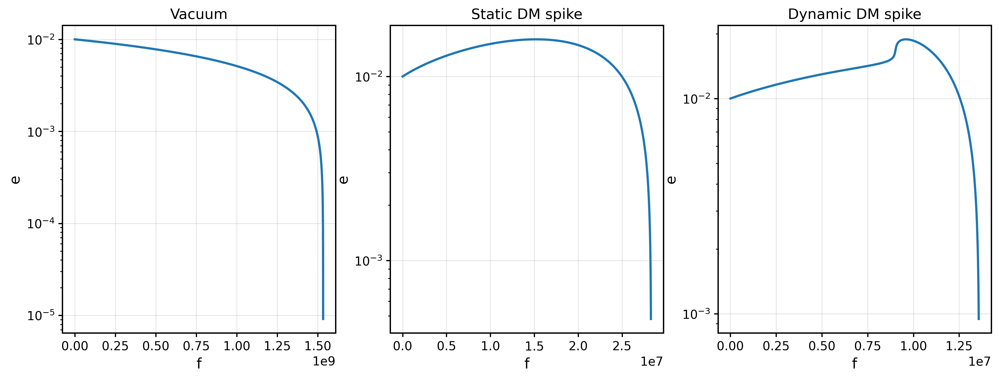

In [81]:
plt.figure(figsize=(15,5))

plt.subplot(131)
plt.title('Vacuum')
plt.plot(f_qc_gw, y_qc_gw[0,:])
plt.xlabel('f')
plt.ylabel('e')
plt.yscale('log')
plt.grid(True)

plt.subplot(132)
plt.title('Static DM spike')
plt.plot(f_qc_static_df_gw, y_qc_static_df_gw[0,:])
plt.xlabel('f')
plt.ylabel('e')
plt.yscale('log')
plt.grid(True)

plt.subplot(133)
plt.title('Dynamic DM spike')
plt.plot(f_qc_dynamic_df_gw, y_qc_dynamic_df_gw[0,:])
plt.xlabel('f')
plt.ylabel('e')
plt.yscale('log')
plt.grid(True)
plt.show()

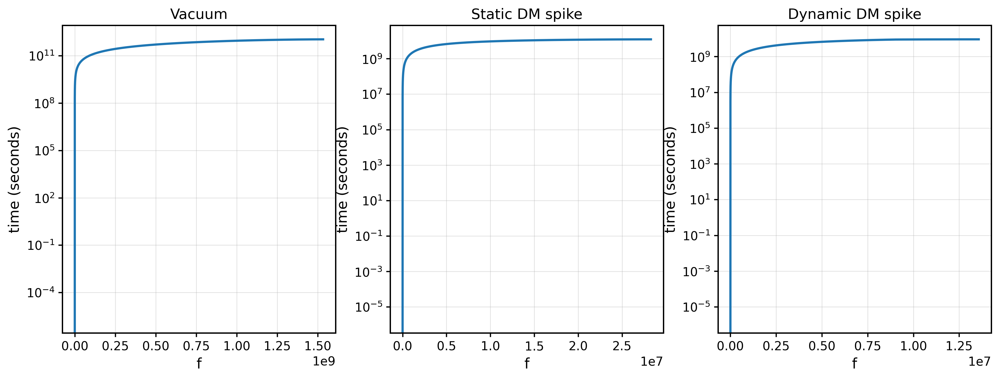

In [82]:
plt.figure(figsize=(15,5))

plt.subplot(131)
plt.title('Vacuum')
plt.plot(f_qc_gw, y_qc_gw[3,:]*t_factor)
plt.xlabel('f')
plt.ylabel('time (seconds)')
plt.yscale('log')
plt.grid(True)

plt.subplot(132)
plt.title('Static DM spike')
plt.plot(f_qc_static_df_gw, y_qc_static_df_gw[3,:]*t_factor)
plt.xlabel('f')
plt.ylabel('time (seconds)')
plt.yscale('log')
plt.grid(True)

plt.subplot(133)
plt.title('Dynamic DM spike')
plt.plot(f_qc_dynamic_df_gw, y_qc_dynamic_df_gw[3,:]*t_factor)
plt.xlabel('f')
plt.ylabel('time (seconds)')
plt.yscale('log')
plt.grid(True)
plt.show()

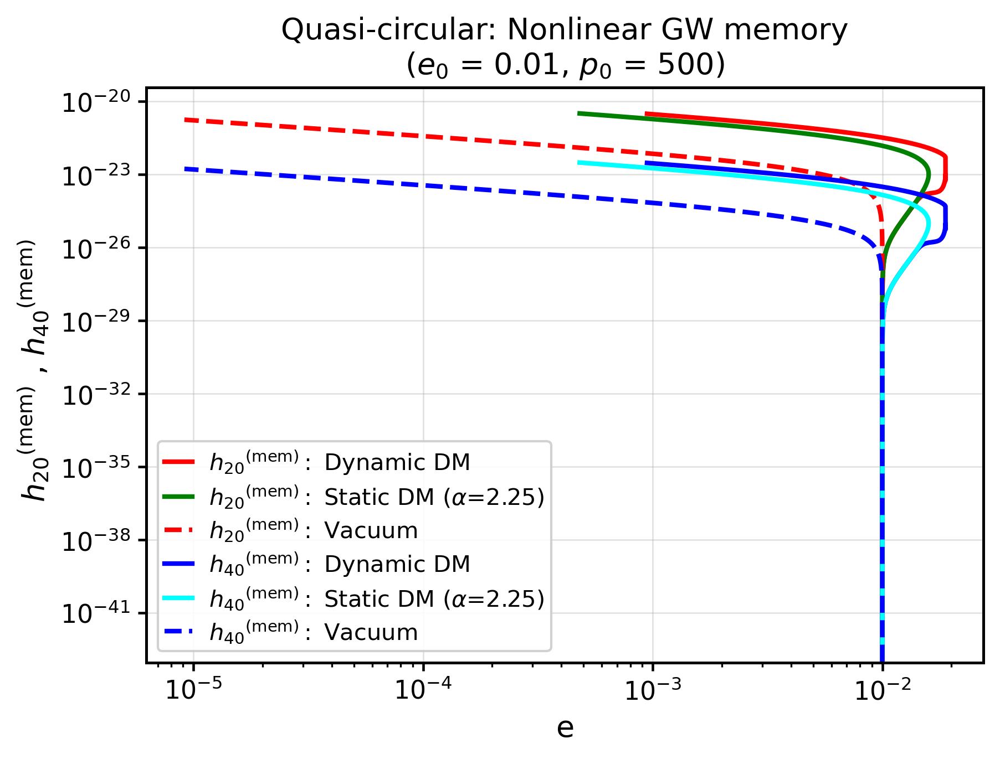

In [83]:
# Quasicircular : Plotting Nonlinear GW memory
plt.figure()
plt.title('Quasi-circular: Nonlinear GW memory' +'\n'+ rf'($e_0$ = {quasi_e_i}, $p_0$ = {quasi_p_i})')

plt.plot( y_qc_dynamic_df_gw[0,:], h20_mem_qc_dynamic_DF_gw, label = r' ${h_{20}}^{\text{(mem)}}:$' +' Dynamic DM', linestyle='-', color='red' )
plt.plot( y_qc_static_df_gw[0,:], h20_mem_qc_static_DF_gw, label = r' ${h_{20}}^{\text{(mem)}}:$' +rf' Static DM (${{\alpha}}$={alpha_static})', linestyle='-', color='green' )
plt.plot( y_qc_gw[0,:], h20_mem_qc_gw, label= r' ${h_{20}}^{\text{(mem)}}:$' + ' Vacuum', linestyle='--', color='red')

plt.plot( y_qc_dynamic_df_gw[0,:], h40_mem_qc_dynamic_DF_gw, label = r' ${h_{40}}^{\text{(mem)}}:$' +' Dynamic DM', linestyle='-', color='blue' )
plt.plot( y_qc_static_df_gw[0,:], h40_mem_qc_static_DF_gw, label = r' ${h_{40}}^{\text{(mem)}}:$' +rf' Static DM (${{\alpha}}$={alpha_static})', linestyle='-', color='cyan' )
plt.plot( y_qc_gw[0,:], h40_mem_qc_gw, label= r' ${h_{40}}^{\text{(mem)}}:$' + ' Vacuum', linestyle='--', color='blue')

plt.xlabel('e')
plt.ylabel(r' ${h_{20}}^{\text{(mem)}}$ , ${h_{40}}^{\text{(mem)}}$')
plt.xscale('log')
plt.yscale('log')
plt.legend(loc="lower left")
plt.grid(True)

# Save as PDF
plt.savefig("elliptical_spike_plot_9.pdf", format="pdf", bbox_inches="tight")

plt.show()